In [1]:
import io
import subprocess
import os
import glob

import pandas as pd
import numpy as np
import scipy
import scipy.stats as stats
from sklearn.decomposition import PCA
import pickle
import re
import math
import plotnine as pn
import seaborn as sns
import glob
import subprocess
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from numpy import log
from collections import defaultdict,Counter
import re
import statsmodels
import warnings

# !pip install statannotations==0.4.0
# #!pip uninstall statannotations --yes
# from statannotations.Annotator import Annotator

warnings.filterwarnings("ignore")
pd.options.display.max_rows = None
pd.options.display.max_columns=None
pd.options.display.max_colwidth=None
work_dir="/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/On_treatment_effect_on_methylation_03172024"

# Data preocessing

In [2]:
#Readin samples from MRD all col csv file of BMS_SOW33_Infinity_01 batch
#Note that there are 237 samples in total and one sample failed enrichment therefore not sequenced B00484294. Need to manually add it back to the final report.

df_BMS_MRD_all = pd.read_csv(f"{work_dir}/20230919_BMS_SOW33_Infinity_01_post_tb_tb_changed_all_cols_MRD.csv", header = 0) 

print("Total sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_all.shape[0]) + "\n") 
print("Total unique sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_all.GHSampleID.nunique()) + "\n")
print("Total unique patient sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_all.Patient_ID.nunique()) + "\n")

#drop duplicates 
df_BMS_MRD_all_1 = df_BMS_MRD_all.drop_duplicates(subset=["GHSampleID"])
print("Total sample size of BMS_SOW33_Infinity_01 batch after removing duplications is " + str(df_BMS_MRD_all_1.shape[0]) + "\n") 
df_BMS_MRD_all_1.head()

Total sample size of BMS_SOW33_Infinity_01 batch is 302

Total unique sample size of BMS_SOW33_Infinity_01 batch is 236

Total unique patient sample size of BMS_SOW33_Infinity_01 batch is 60

Total sample size of BMS_SOW33_Infinity_01 batch after removing duplications is 236



,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected
0,CA209-73L,AP948176G,A0820917,B00484176,0027-01736,NSCLC,NaN,CCRTC2D1,SUCCESS,NaN,Detected,0.002372,4.914,2.0,0,06/29/2023,10/17/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484176,0.006834,TP53,R267P,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577138.0,8.0,R267P,C>G,c.800G>C,NM_000546.6,0.006834,NaN,COSV52691512,rs587780075,462.0,B00484176,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484176,LUNG,2.128147,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.683371,Yes,Detected,Detected
1,CA209-73L,LP044532B,A0820973,B00484236,0041-01812,NSCLC,NaN,CCRTC1D1,SUCCESS,NaN,Detected,0.008647,7.800,2.0,0,06/29/2023,11/23/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484236,0.010574,TP53,E286K,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577082.0,8.0,E286K,C>T,c.856G>A,NM_000546.6,0.010574,NaN,COSV52664318,rs786201059,1349.0,B00484236,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484236,LUNG,1.858175,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",1.057400,Yes,Detected,Detected
2,CA209-73L,LP044549B,A0820974,B00484238,0041-01812,NSCLC,NaN,CCRTC3D1,SUCCESS,NaN,Not Detected,0.000000,7.800,2.0,0,06/29/2023,01/10/2023,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,NaN,0.000000,NaN,NaN,NaN,0,NaN,NaN,NaN,

# Generate MB Lung v4 caller outputs
### Important Note: No need to run these section of code because Mingyang has alreday generated the outputs

In [10]:
import epicaller
import epicaller.methylation.methyl_caller

def run_mb_lung_v4_caller_wrapper_slurm(sample_meta_df, mr_model_file, workdir):
    region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/v05_classification_space.tsv'
    control_region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/v05_positive_control_regions.tsv'
    lr_model_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/msre_lr_model.tsv'

    jobs_dir = f"{workdir}/MB_lung_v4_NAD02_IST01_Infinity_02_jobs"
    output_dir = f"{workdir}/MB_lung_v4_NAD02_IST01_Infinity_02_output"

    # Check and create directories if not exists
    if not os.path.exists(jobs_dir):
        os.makedirs(jobs_dir)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for _, row in sample_meta_df.iterrows():
        run_sample_id = row["GHSampleID"]
        fc_dir = row["fc_dir"]
        flowcell_id = row["runid"]
        mbd_hyper_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_hyper_molecules.tsv"
        mbd_residual_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_residual_molecules.tsv"
        
        # Check if the molecule file exists
        if not os.path.exists(mbd_hyper_molecules):
            continue

        job_file = f"{jobs_dir}/MB_call_{run_sample_id}.job"
        shebang_content = (f"#!/bin/bash\n"
                           f"#SBATCH --job-name=MB_call_{run_sample_id}\n"
                           f"#SBATCH --nodes=1\n"
                           f"#SBATCH --ntasks=1\n"
                           f"#SBATCH --cpus-per-task=1\n"
                           f"#SBATCH --mem=30gb\n"
                           f"#SBATCH --partition=dev\n"
                           f"#SBATCH --time=00:10:00\n"
                           f"#SBATCH --output={jobs_dir}/MB_call_{run_sample_id}.log\n\n")
        
        with open(job_file, "w") as job_output:
            job_output.write(shebang_content)
            job_output.write("python3 -m epicaller.methylation.methyl_caller " + 
                             f"--hyper-molecule-file {mbd_hyper_molecules} " + 
                             f"--residual-molecule-file {mbd_residual_molecules} " + 
                             f"--region-file {region_file} " +
                             f"--control-region-file {control_region_file} " + 
                             f"--lr-model-file {lr_model_file} " + 
                             f"--mr-model-file {mr_model_file} " +
                             "--min-frag-len 120 --max-frag-len 240 --min-cg-count 12 --max-cg-count 30 --cutsite-count-cutoff 1 --min-mapq 60 " + 
                             f"--sample-id {run_sample_id} --flowcell-id {flowcell_id} --outdir {output_dir}/")
            # print(job_output)    
        os.system(f"sbatch {job_file}")


In [11]:
#run the function to generate all the MB Lung v4 caller ouputs for BMS_SOW33_Infinity_01 batch 
run_mb_lung_v4_caller_wrapper_slurm(df_BMS_MRD_all_1, 
                      "/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv", 
                      f"{work_dir}")

Submitted batch job 73407575
Submitted batch job 73407576
Submitted batch job 73407577
Submitted batch job 73407579
Submitted batch job 73407580


# Generate MB Lung v4 score

In [5]:
#The function to calculate MB Lung v4 score
def calculate_MB_lung_v4_score(msre_file, mb_lung_v4_model_coef):
    msre_df = pd.read_table(msre_file)
    msre_df["region_score"] = np.log10(msre_df["hyper_residual_count"]/msre_df["hyper_residual_count_pos_ctrl"] + 1e-5)
    v6_score_df = (
        msre_df
         .merge(mb_lung_v4_model_coef, on='region_id', how='left')
        .groupby(["run_sample_id", "runid"])
        .apply(lambda x: (x["region_score"] * x["weight_y"]).sum() + x["bias_y"].iloc[0])
        .reset_index(name="v2_mb_score")
    )
    v2_score = v6_score_df.v2_mb_score.values[0]
    
    return v2_score
    

#example call
#the mb caller result folder is generated by Mingyang
mb_caller_result_folder = f"/ghds/projects/pharma/customers/BristolMyersSquibb/Infinity/BMS_SOW33_Infinity/BMS_SOW33_Infinity_01/data/summary/mb_lung_v4/mb_lung_v4_run"
mb_lung_v4_model_coef = pd.read_table("/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv")
calculate_MB_lung_v4_score(f"{mb_caller_result_folder}/B00484175/B00484175.msre_caller_mr_features.hdr.tsv", mb_lung_v4_model_coef)

-8.699510588921969

# Generate the MB Lung v4 binary results

In [9]:
#Generate MB Lung v4 score for BMS_SOW33_Infinity_01 batch
df_BMS_MRD_all_2 = df_BMS_MRD_all_1.copy()
df_BMS_MRD_all_2["MB_Lung_v4_call"] = np.nan
df_BMS_MRD_all_2["MB_Lung_v4_score"] = np.nan

#MR lung v4 score generation
mb_lung_v4_model_coef = pd.read_table("/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv")
MB_lung_v4_threshold = -20.398620396045953 #This 20.398620396045953 is the cutoff of 98% specificity for MB Lung v4 

mb_caller_result_folder = f"/ghds/projects/pharma/customers/BristolMyersSquibb/Infinity/BMS_SOW33_Infinity/BMS_SOW33_Infinity_01/data/summary/mb_lung_v4/mb_lung_v4_run"
for index, crc_row in df_BMS_MRD_all_2.iterrows():
    run_sample_id = crc_row["GHSampleID"]
    msre_mr_file = f"{mb_caller_result_folder}/{run_sample_id}/{run_sample_id}.msre_caller_mr_features.hdr.tsv" 
    mb_score = calculate_MB_lung_v4_score(msre_mr_file, mb_lung_v4_model_coef)
    # print(mb_score)
    df_BMS_MRD_all_2.at[index, "MB_Lung_v4_score"] = mb_score
    df_BMS_MRD_all_2.at[index, "MB_Lung_v4_call"] = "Detected" if mb_score > MB_lung_v4_threshold else "Not Detected"

df_BMS_MRD_all_2.head()

NameError: name 'calculate_MB_lung_v4_score' is not defined

# Generate the epiTF score (TFv2beta)
alpha version: Confluence page https://guardanthealth.atlassian.net/wiki/spaces/~6318d6f73778a7aadf1a179b/pages/3390276234/epiTF+command+line+documentation
beta version: /ghsfa/projects/omni_v2/users/juzhao/methyl/tumor_fraction/scripts/run_TFv2beta_pancanTF_accuracy.sh
beta version with plot: /home/agross/code/methylation_classifiers/scripts/

In [5]:
# #set up python interpreter based
# # This is for epiTFv2alpah
# %env PYTHON=/ghdevhome/home/agross/enviroment/mambaforge/envs/epiTF/bin/python
# %env SCRIPT_DIR=/ghdevhome/home/agross/code/epiTF/methylation_classification/scripts/
# %env SAMPLE_CMD=$SCRIPT_DIR/run_epiTF.py
# %env BATCH_CMD=$SCRIPT_DIR/run_epiTF_batch.py

In [15]:
#set up python interpreter based
# This is for epiTFv2beta
%env PYTHON=/ghdevhome/home/agross/enviroment/mambaforge/envs/work/bin/python
%env SCRIPT_DIR=/ghdevhome/home/agross/code/epiTFv2/methylation_classification/scripts
%env SAMPLE_CMD=$SCRIPT_DIR/run_epiTF.py
%env BATCH_CMD=$SCRIPT_DIR/run_epiTF_batch.py

env: PYTHON=/ghdevhome/home/agross/enviroment/mambaforge/envs/work/bin/python
env: SCRIPT_DIR=/ghdevhome/home/agross/code/epiTFv2/methylation_classification/scripts
env: SAMPLE_CMD=$SCRIPT_DIR/run_epiTF.py
env: BATCH_CMD=$SCRIPT_DIR/run_epiTF_batch.py


In [4]:
#set up python interpreter based
# This is for epiTFv2beta with plot
%env PYTHON=/ghdevhome/home/agross/enviroment/mambaforge/envs/work/bin/python
%env SCRIPT_DIR=/ghdevhome/home/agross/code/methylation_classifiers/scripts
%env SAMPLE_CMD=$SCRIPT_DIR/run_epiTF.py
%env BATCH_CMD=$SCRIPT_DIR/run_epiTF_batch.py

env: PYTHON=/ghdevhome/home/agross/enviroment/mambaforge/envs/work/bin/python
env: SCRIPT_DIR=/ghdevhome/home/agross/code/methylation_classifiers/scripts
env: SAMPLE_CMD=$SCRIPT_DIR/run_epiTF.py
env: BATCH_CMD=$SCRIPT_DIR/run_epiTF_batch.py


In [5]:
!echo $PYTHON
!echo $SCRIPT_DIR
!echo $SAMPLE_CMD
!echo $BATCH_CMD

/ghdevhome/home/agross/enviroment/mambaforge/envs/work/bin/python
/ghdevhome/home/agross/code/methylation_classifiers/scripts
$SCRIPT_DIR/run_epiTF.py
$SCRIPT_DIR/run_epiTF_batch.py


In [16]:
# #single sample test
# mbd_path="/ghds/ivd/flowcentral/230908_A01537_0337_AHCFK3DSX7.0599e5da-d205-4705-b7c0-3777056fd90c.20230910121415/A026969709/A026969709.mbd_hyper_molecules.tsv"
# sample_path="/ghds/ivd/flowcentral/230908_A01537_0337_AHCFK3DSX7.0599e5da-d205-4705-b7c0-3777056fd90c.20230910121415/A026969709"
# out_path="/home/hazhang/projects/EpiTF_method_performance_COSMOS_11112023"
# sample_id="A026969709"

# !$PYTHON ${SCRIPT_DIR}run_epiTF.py "/ghds/ivd/flowcentral/230908_A01537_0337_AHCFK3DSX7.0599e5da-d205-4705-b7c0-3777056fd90c.20230910121415/A026969709/A026969709.mbd_hyper_molecules.tsv" "/ghds/ivd/flowcentral/230908_A01537_0337_AHCFK3DSX7.0599e5da-d205-4705-b7c0-3777056fd90c.20230910121415/A026969709" "/home/hazhang/projects/EpiTF_method_performance_COSMOS_11112023" "A026969709"

In [18]:
# #generate epiTF output by TFv2alpha method
# df_BMS_MRD_all_3 = df_BMS_MRD_all_2.copy()

# out_path = f"{work_dir}/TFv2alpha_BMS_SOW33_ouput"

# PYTHON_alpha = '/ghdevhome/home/agross/enviroment/mambaforge/envs/epiTF/bin/python'
# SCRIPT_DIR_alpha = '/ghdevhome/home/agross/code/epiTF/methylation_classification/scripts/'

# # Check if the output directory exists, if not, create it
# if not os.path.exists(out_path):
#     os.makedirs(out_path)

# for index, row in df_BMS_MRD_all_3.iterrows():
#     #This is to deal the the cluster migration issue
#     fc_dir = row["fc_dir"].replace("/ghess", "/ghsfa/projects") 
#     sample_id = row["GHSampleID"]
#     sample_path = f"{fc_dir}/{sample_id}"
#     mbd_path = f"{sample_path}/{sample_id}.mbd_hyper_molecules.tsv"

#     try:
#         # Run the script for each sample
#         command = f"{PYTHON_alpha} {SCRIPT_DIR_alpha}run_epiTF.py {mbd_path} {sample_path} {out_path} {sample_id}"
#         os.system(command)
#     except FileNotFoundError:
#         print(f"No file found for {sample_id}")
#     except Exception as e:
#         print(f"An error occurred with {sample_id}: {str(e)}")


skip


Traceback (most recent call last):
  File "/ghdevhome/home/agross/code/epiTF/methylation_classification/scripts/run_epiTF.py", line 28, in <module>
    res, region_stats = run_epi_tf_model_variants(data, args.sample_path, args.sample_id)
  File "/ghdevhome/home/agross/code/epiTF/methylation_classification/src/python/model_runners.py", line 24, in run_epi_tf_model_variants
    pos_ctrl = epi_tf.get_pos_control(sample_path)
  File "/ghdevhome/home/agross/code/epiTF/methylation_classification/src/python/epi_tf_pan3.py", line 223, in get_pos_control
    pos_ctrl = pd.read_table(msre_all_call)['hyper_residual_count_pos_ctrl'].iloc[0]
  File "/ghdevhome/home/agross/enviroment/mambaforge/envs/epiTF/lib/python3.10/site-packages/pandas/core/indexing.py", line 967, in __getitem__
    return self._getitem_axis(maybe_callable, axis=axis)
  File "/ghdevhome/home/agross/enviroment/mambaforge/envs/epiTF/lib/python3.10/site-packages/pandas/core/indexing.py", line 1523, in _getitem_axis
    self._valid

In [16]:
# #generate epiTF output by TFv2beta method local version
# df_BMS_MRD_all_3 = df_BMS_MRD_all_2.copy()

# out_path = f"{work_dir}/TFv2_BMS_SOW33_beta_ouput"

# PYTHON = '/ghdevhome/home/agross/enviroment/mambaforge/envs/work/bin/python'
# SCRIPT_DIR = '/ghdevhome/home/agross/code/epiTFv2/methylation_classification/scripts/'

# # Check if the output directory exists, if not, create it
# if not os.path.exists(out_path):
#     os.makedirs(out_path)

# for index, row in df_BMS_MRD_all_3.iterrows():
#     #This is to deal the the cluster migration issue
#     fc_dir = row["fc_dir"].replace("/ghess", "/ghsfa/projects") 
#     sample_id = row["GHSampleID"]
#     sample_path = f"{fc_dir}/{sample_id}"
#     mbd_path = f"{sample_path}/{sample_id}.mbd_hyper_molecules.tsv"

#     try:
#         # Run the script for each sample
#         command = f"{PYTHON} {SCRIPT_DIR}run_epiTF.py {mbd_path} {sample_path} {out_path} {sample_id}"
#         os.system(command)
#     except FileNotFoundError:
#         print(f"No file found for {sample_id}")
#     except Exception as e:
#         print(f"An error occurred with {sample_id}: {str(e)}")


Traceback (most recent call last):
  File "/ghdevhome/home/agross/code/epiTFv2/methylation_classification/scripts/run_epiTF.py", line 33, in <module>
    data = overlap_mbd_with_regions(args.mbd_path, regions=params['REGIONS_FILE'],
  File "/ghdevhome/home/agross/code/epiTFv2/methylation_classification/src/python/molecule_counting.py", line 119, in overlap_mbd_with_regions
    for num, molecule_pr in enumerate(hyper_pr_chunks):
  File "/ghdevhome/home/agross/code/epiTFv2/methylation_classification/src/python/molecule_counting.py", line 56, in <genexpr>
    processed_chunks = (process_mbd_chunk_pyrange(chunk, mol_filters=mol_filters) for chunk in hyper)
  File "/ghdevhome/home/agross/code/epiTFv2/methylation_classification/src/python/molecule_counting.py", line -1, in process_mbd_chunk_pyrange
KeyboardInterrupt


In [10]:
#generate epiTF output by TFv2beta with plot method local version
df_BMS_MRD_all_3 = df_BMS_MRD_all_2.copy()

out_path = f"{work_dir}/TFv2_BMS_SOW33_beta_with_plot_ouput"

PYTHON = '/ghdevhome/home/agross/enviroment/mambaforge/envs/work/bin/python'
SCRIPT_DIR = '/ghdevhome/home/agross/code/methylation_classifiers/scripts/'

# Check if the output directory exists, if not, create it
if not os.path.exists(out_path):
    os.makedirs(out_path)

for index, row in df_BMS_MRD_all_3.iterrows():
    #This is to deal the the cluster migration issue
    fc_dir = row["fc_dir"].replace("/ghess", "/ghsfa/projects") 
    sample_id = row["GHSampleID"]
    sample_path = f"{fc_dir}/{sample_id}"
    mbd_path = f"{sample_path}/{sample_id}.mbd_hyper_molecules.tsv"

    try:
        # Run the script for each sample
        command = f"{PYTHON} {SCRIPT_DIR}run_epiTF.py {mbd_path} {sample_path} {out_path} {sample_id}"
        os.system(command)
    except FileNotFoundError:
        print(f"No file found for {sample_id}")
    except Exception as e:
        print(f"An error occurred with {sample_id}: {str(e)}")


using default config: /ghdevhome/home/agross/code/methylation_classifiers/config/params.yaml
{'FIXED_PEAK_OUT': None, 'FIXED_PEAK_REGIONS': PosixPath('/ghdevhome/home/agross/code/methylation_classifiers/config/fixed_peaks_update.csv'), 'REGIONS_FILE': PosixPath('/ghdevhome/home/agross/code/methylation_classifiers/config/fixed_peak_regions.csv'), 'TRAINING_MOLECULE_COUNT': None, 'TRAINING_SAMPLE_META': None, 'TUMOR_MODEL_FILE': PosixPath('/ghdevhome/home/agross/code/methylation_classifiers/config/tumor_model.pickle'), 'epi_tf_normalization_params': PosixPath('/ghdevhome/home/agross/code/methylation_classifiers/config/epi_tf_normalization_params.json'), 'epi_tf_params': {'NEAT_RATIO_ALPHA': -1.10236612182174, 'NEAT_RATIO_BETA': 2.41391359968745, 'min_num_regions': 30, 'num_top_regions': 300, 'outlier_fraction': 0.005, 'scale_factor': 0.76297207}, 'molecule_filters': {'all_motifs_count': 1, 'cg_count': 10, 'max_frag_len': 400, 'mean_mapq': 60, 'min_frag_len': 0}, 'tumor_fraction_regions_n

Traceback (most recent call last):
  File "/ghdevhome/home/agross/code/methylation_classifiers/scripts/run_epiTF.py", line 29, in <module>
    process_from_hyper_molecules(args.mbd_path, args.sample_path, args.sample_id, args.out_path,
  File "/ghdevhome/home/agross/code/methylation_classifiers/src/python/model_runners.py", line 159, in process_from_hyper_molecules
    process_from_region_counts(sample_path, sample_id, out_path, data=data, params=params)
  File "/ghdevhome/home/agross/code/methylation_classifiers/src/python/model_runners.py", line 118, in process_from_region_counts
    res, region_stats, data, figs, insert_size = run_epi_tf_model_variants(data, sample_path, sample_id, params=params)
  File "/ghdevhome/home/agross/code/methylation_classifiers/src/python/model_runners.py", line 56, in run_epi_tf_model_variants
    ctrl_cor_frac = epi_tf.get_ctrl_cor_frac(sample_path)
  File "/ghdevhome/home/agross/code/methylation_classifiers/src/python/epi_tf_pan3.py", line 278, in get_

In [5]:
#generate epiTF output by TFv2beta method slurm version

# Step 1: save the input csv file
df_BMS_MRD_all_3 = df_BMS_MRD_all_2.copy()
df_BMS_MRD_all_3.to_csv(f"{work_dir}/df_BMS_MRD_all_3.csv", index=False)

# Step 2: edit the slurm script
# Step 2.1: define the out_path path; define the column # in the script for extracting "fc_dir" and "sample_id"; this is optional: | sed 's/\/ghess\//\/ghsfa\/projects\//'

# STEP 3: run the slurm script
os.system(f"sbatch {work_dir}/run_TFv2beta_pancanTF_accuracy.sh")

Submitted batch job 76270049


0

In [ ]:
# # This is alpha version
# #retrieve the epiTF ("epiTFnewfit3_pan", "epi_tf_fixed_peak_bg3") from TFv2alpha
# #"epiTFnewfit3_pan", "epi_tf_fixed_peak_bg3" is considered to be the best TF prediction optimized for true accuracy by Andy

# df_BMS_MRD_all_4 = df_BMS_MRD_all_3.copy()
# df_BMS_MRD_all_4['epiTF_TFv2alpha'] = None 

# out_path = f"{work_dir}/TFv2alpha_BMS_SOW33_ouput"

# for index, row in df_BMS_MRD_all_4.iterrows():
#     sample_id = row["GHSampleID"]
#     file_path = f"{out_path}/{sample_id}.epiTF_model_predictions.csv"
    
#     try:
#         df_temp = pd.read_csv(file_path, index_col=0)
#         value_acc = df_temp.loc["epiTFnewfit3_pan", "epi_tf_fixed_peak_bg3"]
#         df_BMS_MRD_all_4.at[index, 'epiTF_TFv2alpha'] = value_acc
        
#     except Exception as e:
#         print(f"An error occurred with {sample_id}: {str(e)}")

# df_BMS_MRD_all_5 = df_BMS_MRD_all_4.copy()
# df_BMS_MRD_all_5.head()

In [6]:
# This is beta version
#retrieve the epiTF ("epiTFnewfit3_pan") from TFv2beta

df_BMS_MRD_all_3 = df_BMS_MRD_all_2.copy()
df_BMS_MRD_all_4 = df_BMS_MRD_all_3.copy()

df_BMS_MRD_all_4['epiTF_TFv2beta'] = None 

out_path = f"{work_dir}/TFv2beta_BMS_SOW33_04082024_ouput"

for index, row in df_BMS_MRD_all_4.iterrows():
    sample_id = row["GHSampleID"]
    file_path = f"{out_path}/{sample_id}.epiTF_model_predictions.csv"
    
    try:
        df_temp = pd.read_csv(file_path, index_col=0)
        value_beta = df_temp.squeeze()['epiTFnewfit3_pan']
        df_BMS_MRD_all_4.at[index, 'epiTF_TFv2beta'] = value_beta
        
    except Exception as e:
        print(f"An error occurred with {sample_id}: {str(e)}")

df_BMS_MRD_all_5 = df_BMS_MRD_all_4.copy()
df_BMS_MRD_all_5.head()

An error occurred with B00484293: [Errno 2] No such file or directory: '/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/On_treatment_effect_on_methylation_03172024/TFv2beta_BMS_SOW33_04082024_ouput/B00484293.epiTF_model_predictions.csv'


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected,MB_Lung_v4_call,MB_Lung_v4_score,epiTF_TFv2beta
0,CA209-73L,AP948176G,A0820917,B00484176,0027-01736,NSCLC,NaN,CCRTC2D1,SUCCESS,NaN,Detected,0.002372,4.914,2.0,0,06/29/2023,10/17/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484176,0.006834,TP53,R267P,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577138.0,8.0,R267P,C>G,c.800G>C,NM_000546.6,0.006834,NaN,COSV52691512,rs587780075,462.0,B00484176,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484176,LUNG,2.128147,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.683371,Yes,Detected,Detected,Detected,-17.701394,0.000412
1,CA209-73L,LP044532B,A0820973,B00484236,0041-01812,NSCLC,NaN,CCRTC1D1,SUCCESS,NaN,Detected,0.008647,7.800,2.0,0,06/29/2023,11/23/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484236,0.010574,TP53,E286K,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577082.0,8.0,E286K,C>T,c.856G>A,NM_000546.6,0.010574,NaN,COSV52664318,rs786201059,1349.0,B00484236,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484236,LUNG,1.858175,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",1.057400,Yes,Detected,Detected,Detected,-10.723566,0.009095
2,CA209-73L,LP044549B,A0820974,B00484238,0041-01812,NSCLC,NaN,CCRTC3D1,SUCCESS,NaN,Not Detected,0.000000,7.800,2.0,0,06/29/2023,01/10/2023,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1

In [8]:
#Save the dataframe
df_BMS_MRD_all_5.to_csv(f"{work_dir}/df_BMS_MRD_all_5.csv", index=False)
df_BMS_MRD_all_5.shape

(236, 61)

# Data Visualization of Swimmer plot and Binary caller inconsistency

## alluvial plot

In [26]:
import plotly.graph_objects as go

#drop the duplications
df_BMS_MRD_plot = df_BMS_MRD_all_5.drop_duplicates(subset=["GHSampleID"])

#drop the failed samples based on column "ctDNA_detected"
df_BMS_MRD_plot = df_BMS_MRD_plot.dropna(subset=['ctDNA_detected'])
print(df_BMS_MRD_plot.shape)

#rename the columns to indicate the caller name
df_BMS_MRD_plot = df_BMS_MRD_plot.rename(columns={"ctDNA_detected": "LR_lung_call", "MB_Lung_v4_call": "MB_Lung_v4_call"})

# Prepare the data for the alluvial plot
df_methods = df_BMS_MRD_plot[["LR_lung_call", "MB_Lung_v4_call"]]
df_methods['LR_lung_call'] = df_methods['LR_lung_call'].apply(lambda x: 'Positive' if x == 'Detected' else 'Negative')
df_methods['MB_Lung_v4_call'] = df_methods['MB_Lung_v4_call'].apply(lambda x: 'Positive' if x == 'Detected' else 'Negative')

# Calculate the counts
lr_positive_mb_negative = len(df_methods[(df_methods['LR_lung_call'] == 'Positive') & (df_methods['MB_Lung_v4_call'] == 'Negative')])
lr_negative_mb_positive = len(df_methods[(df_methods['LR_lung_call'] == 'Negative') & (df_methods['MB_Lung_v4_call'] == 'Positive')])
both_positive = len(df_methods[(df_methods['LR_lung_call'] == 'Positive') & (df_methods['MB_Lung_v4_call'] == 'Positive')])
both_negative = len(df_methods[(df_methods['LR_lung_call'] == 'Negative') & (df_methods['MB_Lung_v4_call'] == 'Negative')])

# Define a minimum visual threshold for the line width 
min_visual_threshold = 20  # Adjust this value as needed for visibility

# Adjusted values for visual representation
visual_values = [
    max(both_positive, min_visual_threshold),
    max(lr_positive_mb_negative, min_visual_threshold),
    max(lr_negative_mb_positive, min_visual_threshold),
    max(both_negative, min_visual_threshold)
]

# Define Sankey diagram structure with adjusted visual values
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=["LR Positive", "LR Negative", "MB Positive", "MB Negative"],
    ),
    link=dict(
        source=[0, 0, 1, 1],  # Indices correspond to 'label' above
        target=[2, 3, 2, 3],
        value=visual_values,  # Use adjusted visual values
        color=['rgba(0, 128, 128, 0.8)', 'rgba(255, 69, 0, 0.8)', 'rgba(138, 43, 226, 0.8)', 'rgba(128, 128, 128, 0.8)']
    ))])

# Update annotations with actual counts
annotations = [
    go.layout.Annotation(x=0.1, y=0.95, xref='paper', yref='paper', showarrow=False, 
                         text=f'Consistent Calls (LR+/MB+): {both_positive}'),
    go.layout.Annotation(x=0.1, y=0.03, xref='paper', yref='paper', showarrow=False, 
                         text=f'Consistent Calls (LR-/MB-): {both_negative}'),
    go.layout.Annotation(x=0.9, y=0.45, xref='paper', yref='paper', showarrow=False, 
                         text=f'Flipped Calls (LR+/MB-): {lr_positive_mb_negative}'),
    go.layout.Annotation(x=0.9, y=0.65, xref='paper', yref='paper', showarrow=False, 
                         text=f'Flipped Calls (LR-/MB+): {lr_negative_mb_positive}')
]

fig.update_layout(title_text="Comparison between LR Lung Caller and MB lung v4 Caller on BMS_SOW33_Infinity_01 batch", annotations=annotations)

fig.show()

(235, 61)


## Confusion Matrix

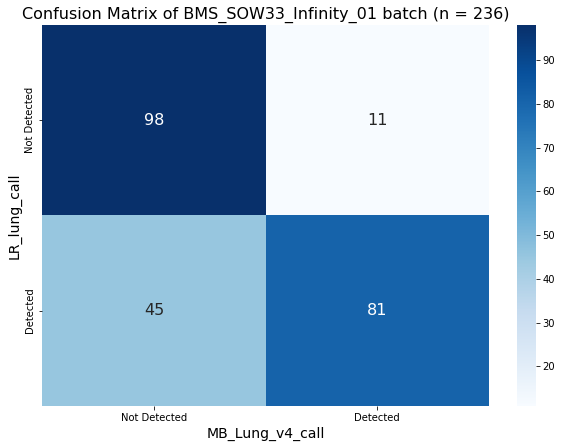

Cohen's Kappa: 0.53


In [27]:
#For batch BMS_SOW33_Infinity_01

from sklearn.metrics import confusion_matrix, cohen_kappa_score

# Mapping "Detected" to 1 and "Not Detected" to 0
df_BMS_MRD_plot['LR_lung_call_mapped'] = df_BMS_MRD_plot['LR_lung_call'].map({"Detected": 1, "Not Detected": 0})
df_BMS_MRD_plot['MB_Lung_v4_call_mapped'] = df_BMS_MRD_plot['MB_Lung_v4_call'].map({"Detected": 1, "Not Detected": 0})

# Extracting the values for confusion matrix calculation
y_true = df_BMS_MRD_plot['LR_lung_call_mapped'].values
y_pred = df_BMS_MRD_plot['MB_Lung_v4_call_mapped'].values

# Generating the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Detected", "Detected"], yticklabels=["Not Detected", "Detected"], annot_kws={"size": 16})
plt.xlabel('MB_Lung_v4_call', fontsize=14)
plt.ylabel('LR_lung_call', fontsize=14)
plt.title('Confusion Matrix of BMS_SOW33_Infinity_01 batch (n = 236)', fontsize=16)
plt.show()

# Calculating and printing Cohen's Kappa
kappa = cohen_kappa_score(y_true, y_pred)
print(f"Cohen's Kappa: {kappa:.2f}")

## Swimmer plot

In [4]:
#This step need to be mannually checked!
df_BMS_MRD_all_5 = pd.read_csv(f"{work_dir}/df_BMS_MRD_all_5.csv", header = 0) 

#Found the column "Visit_name" has difference values compared to the e-manifest.csv file, so replace the original value in df_BMS_MRD_all_6 with the value in e-manifest.csv.
df_BMS_MRD_all_6 = df_BMS_MRD_all_5.copy()

#read in e-manifest.csv file
df_manifest = pd.read_csv(f"{work_dir}/emanifest_copy.csv", header = 0) 

# Step 1: Deduplicate df_manifest with corrected column names
unique_manifest = df_manifest.drop_duplicates(subset=['Customer Sample ID', 'Patient ID'], keep='first')
unique_manifest_renamed = unique_manifest.rename(columns={"Customer Sample ID": "Customer_SampleID", "Sample Time point": "Visit_name", "Patient ID": "Patient_ID"})

# Step 2: Perform the merge
merged_df = pd.merge(df_BMS_MRD_all_6, unique_manifest_renamed[['Customer_SampleID', 'Patient_ID', 'Visit_name']], on=['Customer_SampleID', 'Patient_ID'], how='left', suffixes=('', '_new'))

# Step 3: Replace 'Visit_name' with 'Visit_name_new', handling NaNs
merged_df['Visit_name'] = merged_df['Visit_name_new'].fillna(merged_df['Visit_name'])

# Step 4: Drop the '_new' column
merged_df.drop(columns=['Visit_name_new'], inplace=True)

# Resulting dataframe
df_BMS_MRD_all_6 = merged_df

#save the dataframe
df_BMS_MRD_all_6.to_csv(f"{work_dir}/df_BMS_MRD_all_6.csv", index=False)
df_BMS_MRD_all_6.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected,MB_Lung_v4_call,MB_Lung_v4_score,epiTF_TFv2beta
0,CA209-73L,AP948176G,A0820917,B00484176,0027-01736,NSCLC,NaN,CCRTC2D1,SUCCESS,NaN,Detected,0.002372,4.914,2.0,0,06/29/2023,10/17/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484176,0.006834,TP53,R267P,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577138.0,8.0,R267P,C>G,c.800G>C,NM_000546.6,0.006834,NaN,COSV52691512,rs587780075,462.0,B00484176,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484176,LUNG,2.128147,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.683371,Yes,Detected,Detected,Detected,-17.701394,0.000412
1,CA209-73L,LP044532B,A0820973,B00484236,0041-01812,NSCLC,NaN,CCRTC1D1,SUCCESS,NaN,Detected,0.008647,7.800,2.0,0,06/29/2023,11/23/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484236,0.010574,TP53,E286K,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577082.0,8.0,E286K,C>T,c.856G>A,NM_000546.6,0.010574,NaN,COSV52664318,rs786201059,1349.0,B00484236,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484236,LUNG,1.858175,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",1.057400,Yes,Detected,Detected,Detected,-10.723566,0.009095
2,CA209-73L,LP044549B,A0820974,B00484238,0041-01812,NSCLC,NaN,CCRTC3D1,SUCCESS,NaN,Not Detected,0.000000,7.800,2.0,0,06/29/2023,01/10/2023,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1

In [5]:
#found the visit time point naming inconsistency. MY suggested to mannually fix it
df_BMS_MRD_all_5.Visit_name.value_counts()

CCRTC2D1               43
MAINTC3D1              37
MAINTC1D1              33
CCRTC3D1               29
MAINTC2D1              29
ARM C MAINT C1/8 D1    22
CCRTC1D1               15
UPPROG                 14
MAINTC8D1              10
MAINT C1/8 D1           3
MAINT C3 D1             1
Name: Visit_name, dtype: int64

In [11]:
#found the visit time point naming inconsistency. MY suggested to mannually fix it
df_BMS_MRD_all_6.Visit_name.value_counts()

MAINTC1D1    47
CCRTC2D1     46
MAINTC3D1    37
MAINTC2D1    30
CCRTC3D1     29
MAINTC8D1    21
UPPROG       14
CCRTC1D1     12
Name: Visit_name, dtype: int64

In [11]:
# Identifying duplicates based on 'Patient_ID' and 'Visit_name'
duplicates = df_BMS_MRD_all_6.duplicated(subset=['Patient_ID', 'Visit_name'], keep=False)

# Filter the DataFrame to only include the duplicates
duplicate_rows = df_BMS_MRD_all_6[duplicates]

# Sort the DataFrame based on 'Patient_ID' and 'Visit_name' to see the duplicates next to each other
duplicate_rows_sorted = duplicate_rows.sort_values(by=['Patient_ID', 'Visit_name'])

# Display the duplicate rows
duplicate_rows_sorted


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected,MB_Lung_v4_call,MB_Lung_v4_score,epiTF_TFv2beta
52,CA209-73L,EP488540G,A0820943,B00484217,0135-00352,NSCLC,NaN,MAINTC8D1,SUCCESS,NaN,Not Detected,0.0,10.400,2.0,0,06/30/2023,02/01/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A02056_0035_AHCGNTDSX7_PS3C134_AP2.Sirius-1.1.1-RLS,230909_A02056_0035_AHCGNTDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484217,0.002716,TP53,S183*,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7578382.0,5.0,S183*,G>C,c.548C>G,NM_000546.6,0.002716,NaN,COSV52662121,NaN,1507.0,B00484217,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484217,LUNG,2.019912,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.271555,No,Not Detected,Not Detected,Not Detected,-21.767452,0.000002
53,CA209-73L,EP789242G,A0820952,B00484192,0135-00352,NSCLC,NaN,MAINTC8D1,SUCCESS,NaN,Not Detected,0.0,7.904,2.0,0,06/30/2023,01/11/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A02056_0035_AHCGNTDSX7_PS3C134_AP2.Sirius-1.1.1-RLS,230909_A02056_0035_AHCGNTDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484192,0.003604,TP53,S183*,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7578382.0,5.0,S183*,G>C,c.548C>G,NM_000546.6,0.003604,NaN,COSV52662121,NaN,1149.0,B00484192,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484192,LUNG,2.419982,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.360360,No,Not Detected,Not Detected,Not Detected,-21.810634,0.000059


(235, 61)


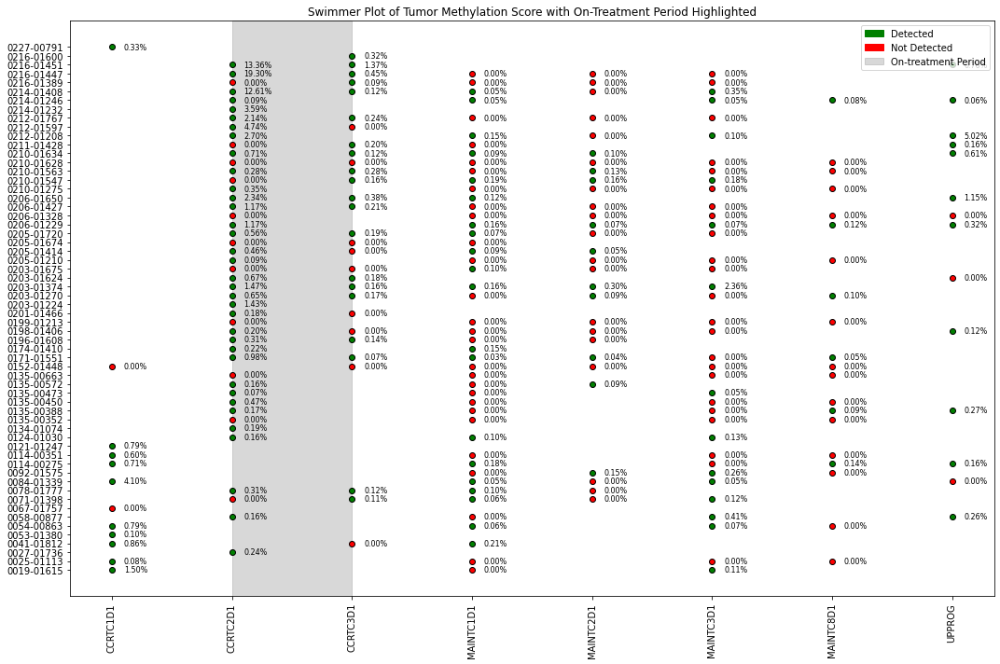

In [12]:
import matplotlib.patches as mpatches

# Convert 'Received_date' to datetime if it's not already
df_BMS_MRD_all_6['Received_date'] = pd.to_datetime(df_BMS_MRD_all_6['Received_date'])

# Sort the data by 'Patient_ID', 'Visit_name', and 'Received_date' so the latest dates are last
df_BMS_MRD_all_6_sorted = df_BMS_MRD_all_6.sort_values(by=['Patient_ID', 'Visit_name', 'Received_date'])

# Now, we will drop duplicates keeping the last entry which is the latest
df_BMS_MRD_all_6_latest = df_BMS_MRD_all_6_sorted.drop_duplicates(subset=['Patient_ID', 'Visit_name'], keep='last')

print(df_BMS_MRD_all_6_latest.shape)
# Pivot the cleaned data
pivoted_scores = df_BMS_MRD_all_6_latest.pivot(index='Patient_ID', columns='Visit_name', values='Tumor_methylation_score')
pivoted_ctDNA_status = df_BMS_MRD_all_6_latest.pivot(index='Patient_ID', columns='Visit_name', values='ctDNA_detected')

# Applying color mapping to ctDNA_detected status
color_mapping = {'Detected': 'green', 'Not Detected': 'red'}
pivoted_colors = pivoted_ctDNA_status.applymap(lambda x: color_mapping.get(x, 'grey'))  # Default to 'grey' if none of Detected/Not Detected

# Create the swimmer plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the size as needed

# Find the positions (indices) for the on-treatment period
visit_names = list(pivoted_scores.columns)
on_treatment_start = visit_names.index('CCRTC2D1')  # Index of start of on-treatment
on_treatment_end = visit_names.index('CCRTC3D1')  # Index of end of on-treatment

# Highlight the on-treatment period with a gray background
ax.axvspan(on_treatment_start, on_treatment_end, color='grey', alpha=0.3)

# Iterate over each patient and visit to plot the points
for i, patient in enumerate(pivoted_scores.index):
    for j, visit in enumerate(visit_names):
        score = pivoted_scores.loc[patient, visit]
        color = pivoted_colors.loc[patient, visit]
        if pd.notna(score):
            ax.scatter(j, i, color=color, edgecolor='black')  # Plot the dot
            ax.text(j + 0.1, i, f'{score:.2%}', va='center', ha='left', fontsize=8)  # Plot the score next to the dot

# Create custom legend
detected_patch = mpatches.Patch(color='green', label='Detected')
not_detected_patch = mpatches.Patch(color='red', label='Not Detected')
treatment_period_patch = mpatches.Patch(color='grey', alpha=0.3, label='On-treatment Period')

# Set the labels for the y-axis
ax.set_yticks(range(len(pivoted_scores.index)))
ax.set_yticklabels(pivoted_scores.index)

# Set the labels for the x-axis
ax.set_xticks(range(len(visit_names)))
ax.set_xticklabels(visit_names, rotation=90)

# Add the legend to the plot
ax.legend(handles=[detected_patch, not_detected_patch, treatment_period_patch], loc='upper right')

# Set the title and display options
ax.set_title('Swimmer Plot of Tumor Methylation Score with On-Treatment Period Highlighted')
plt.tight_layout()  # Adjust the layout to fit everything
plt.show()


(225, 61)


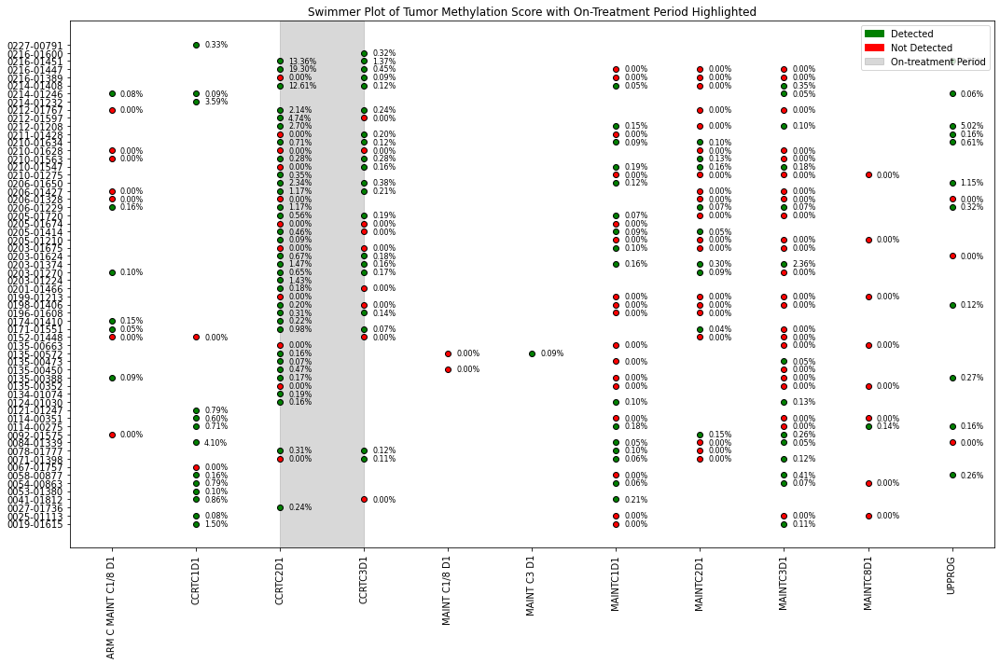

In [13]:
import matplotlib.patches as mpatches

# Convert 'Received_date' to datetime if it's not already
df_BMS_MRD_all_5['Received_date'] = pd.to_datetime(df_BMS_MRD_all_5['Received_date'])

# Sort the data by 'Patient_ID', 'Visit_name', and 'Received_date' so the latest dates are last
df_BMS_MRD_all_6_sorted = df_BMS_MRD_all_5.sort_values(by=['Patient_ID', 'Visit_name', 'Received_date'])

# Now, we will drop duplicates keeping the last entry which is the latest
df_BMS_MRD_all_6_latest = df_BMS_MRD_all_6_sorted.drop_duplicates(subset=['Patient_ID', 'Visit_name'], keep='last')

print(df_BMS_MRD_all_6_latest.shape)
# Pivot the cleaned data
pivoted_scores = df_BMS_MRD_all_6_latest.pivot(index='Patient_ID', columns='Visit_name', values='Tumor_methylation_score')
pivoted_ctDNA_status = df_BMS_MRD_all_6_latest.pivot(index='Patient_ID', columns='Visit_name', values='ctDNA_detected')

# Applying color mapping to ctDNA_detected status
color_mapping = {'Detected': 'green', 'Not Detected': 'red'}
pivoted_colors = pivoted_ctDNA_status.applymap(lambda x: color_mapping.get(x, 'grey'))  # Default to 'grey' if none of Detected/Not Detected

# Create the swimmer plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the size as needed

# Find the positions (indices) for the on-treatment period
visit_names = list(pivoted_scores.columns)
on_treatment_start = visit_names.index('CCRTC2D1')  # Index of start of on-treatment
on_treatment_end = visit_names.index('CCRTC3D1')  # Index of end of on-treatment

# Highlight the on-treatment period with a gray background
ax.axvspan(on_treatment_start, on_treatment_end, color='grey', alpha=0.3)

# Iterate over each patient and visit to plot the points
for i, patient in enumerate(pivoted_scores.index):
    for j, visit in enumerate(visit_names):
        score = pivoted_scores.loc[patient, visit]
        color = pivoted_colors.loc[patient, visit]
        if pd.notna(score):
            ax.scatter(j, i, color=color, edgecolor='black')  # Plot the dot
            ax.text(j + 0.1, i, f'{score:.2%}', va='center', ha='left', fontsize=8)  # Plot the score next to the dot

# Create custom legend
detected_patch = mpatches.Patch(color='green', label='Detected')
not_detected_patch = mpatches.Patch(color='red', label='Not Detected')
treatment_period_patch = mpatches.Patch(color='grey', alpha=0.3, label='On-treatment Period')

# Set the labels for the y-axis
ax.set_yticks(range(len(pivoted_scores.index)))
ax.set_yticklabels(pivoted_scores.index)

# Set the labels for the x-axis
ax.set_xticks(range(len(visit_names)))
ax.set_xticklabels(visit_names, rotation=90)

# Add the legend to the plot
ax.legend(handles=[detected_patch, not_detected_patch, treatment_period_patch], loc='upper right')

# Set the title and display options
ax.set_title('Swimmer Plot of Tumor Methylation Score with On-Treatment Period Highlighted')
plt.tight_layout()  # Adjust the layout to fit everything
plt.show()


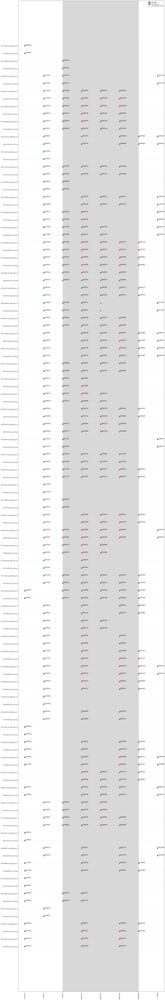

In [14]:
import matplotlib.patches as mpatches
# Swimmer plot for two caller results

# Convert 'Received_date' to datetime if it's not already
df_BMS_MRD_all_6['Received_date'] = pd.to_datetime(df_BMS_MRD_all_6['Received_date'])

# Sort the data by 'Patient_ID', 'Visit_name', and 'Received_date' so the latest dates are last
df_BMS_MRD_all_6_sorted = df_BMS_MRD_all_6.sort_values(by=['Patient_ID', 'Visit_name', 'Received_date'])

# Now, we will drop duplicates keeping the last entry which is the latest
df_BMS_MRD_all_6_latest = df_BMS_MRD_all_6_sorted.drop_duplicates(subset=['Patient_ID', 'Visit_name'], keep='last')

# Create two separate dataframes for each criteria
df_lr_lung = df_BMS_MRD_all_6_latest.copy()
df_lr_lung['Patient_ID'] = df_lr_lung['Patient_ID'].astype(str) + '_by_LR_lung'
df_lr_lung['Detection'] = df_lr_lung['ctDNA_detected']
df_lr_lung['Score'] = df_lr_lung['epiTF_TFv2beta']

df_mb_lung_v4 = df_BMS_MRD_all_6_latest.copy()
df_mb_lung_v4['Patient_ID'] = df_mb_lung_v4['Patient_ID'].astype(str) + '_by_MB_lung_v4'
df_mb_lung_v4['Detection'] = df_mb_lung_v4['MB_Lung_v4_call']
df_mb_lung_v4['Score'] = df_mb_lung_v4['epiTF_TFv2beta']

# Concatenate the dataframes
df_combined = pd.concat([df_lr_lung, df_mb_lung_v4]).reset_index(drop=True)

# Sort by patient ID and visit name for consistent plotting order
df_combined.sort_values(by=['Patient_ID', 'Visit_name'], inplace=True)

# Create the plot with a dark background
fig, ax = plt.subplots(figsize=(20, len(df_combined['Patient_ID'].unique())))
# fig, ax = plt.subplots(figsize=(20, 30))


# Plot settings
color_mapping = {'Detected': 'green', 'Not Detected': 'red'}
visit_order = sorted(df_combined['Visit_name'].unique())
patient_order = sorted(df_combined['Patient_ID'].unique(), key=lambda x: x.split('_by_')[0])

# Plotting logic with larger dots and text
for i, patient_id in enumerate(patient_order):
    patient_data = df_combined[df_combined['Patient_ID'] == patient_id]
    for j, row in patient_data.iterrows():
        visit_index = visit_order.index(row['Visit_name'])
        color = color_mapping.get(row['Detection'], 'grey')
        score = row['Score']
        ax.scatter(visit_index, i, color=color, s=80)  # Larger dot size
        if pd.notnull(score):
            ax.text(visit_index, i, f"{score:.6f}", ha='left', va='bottom', fontsize=12, color='black')  # Larger font size 

# Add legend for detection
detected_patch = mpatches.Patch(color='green', label='Detected')
not_detected_patch = mpatches.Patch(color='red', label='Not Detected')
treatment_period_patch = mpatches.Patch(color='grey', alpha=0.3, label='On-treatment Period')
ax.legend(handles=[detected_patch, not_detected_patch, treatment_period_patch], loc='upper right')

# Adjust y-ticks to account for the two rows per patient
ax.set_yticks(range(len(patient_order)))
ax.set_yticklabels(patient_order, color='black')  

# Add gray background for the treatment period
try:
    treatment_start = visit_order.index('CCRTC3D1')
    treatment_end = visit_order.index('MAINTC8D1')
    ax.axvspan(treatment_start, treatment_end, color='grey', alpha=0.3)
except ValueError:
    print("On-treatment period visits not found in the visit order.")


# Add horizontal lines
ax.yaxis.grid(True, which='major', linestyle='-', linewidth=0.5, color='silver')

# Adjust x-ticks and labels
ax.set_xticks(range(len(visit_order)))
ax.set_xticklabels(visit_order, rotation=90, color='black')  # White color for visibility

plt.tight_layout()
plt.show()


In [5]:
df_BMS_MRD_all_6_1 = df_BMS_MRD_all[df_BMS_MRD_all["Patient_ID"] == "0216-01447"]
df_BMS_MRD_all_6_1

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected
239,CA209-73L,SP175686D,A0821017,B00484943,0216-01447,NSCLC,NaN,CCRTC2D1,SUCCESS,NaN,Detected,0.192978,8.060,2.0,0,08/03/2023,04/22/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230911_A02056_0037_BHCC7YDSX7_PS3C138_AP1.Sirius-1.1.1-RLS,230911_A02056_0037_BHCC7YDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484943,0.188379,TP53,C176F,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common clonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7578403.0,5.0,C176F,C>A,c.527G>T,NM_000546.6,0.188379,NaN,COSV52661329,rs786202962,1094.0,B00484943,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common clonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484943,LUNG,2.070148,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",18.837900,Yes,Detected,Detected
240,CA209-73L,SP209006D,A0821046,B00484881,0216-01447,NSCLC,NaN,CCRTC3D1,SUCCESS,NaN,Detected,0.004549,5.720,2.0,0,08/03/2023,05/13/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230911_A02056_0037_BHCC7YDSX7_PS3C138_AP1.Sirius-1.1.1-RLS,230911_A02056_0037_BHCC7YDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484881,0.004478,TP53,C176F,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common clonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7578403.0,5.0,C176F,C>A,c.527G>T,NM_000546.6,0.004478,NaN,COSV52661329,rs786202962,680.0,B00484881,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common clonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484881,LUNG,0.774458,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.447761,Yes,Detected,Detected
241,CA209-73L,SP300861D,A0821062,B00484934,0216-01447,NSCLC,NaN,MAINTC1D1,SUCCESS,NaN,Not Detected,0.000000,10.660,2.0,0,08/03/2023,06/28/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230911_A02056_0037_BHCC7YDSX7_PS3C138_AP1.Sirius-1.1.1-RLS,230911_A02056_0037_BHCC7YDSX7,NSCLC,NSCLC,LUNG,NSCLC,L

# On-treatment effect on methylation quantificiation 

## EpiTF

In [5]:
#generate a dataframe from "all_cols.csv" file to sort for the max tvf VAF for each row if there is a tvf somatic variant detected

#introduce the addtional new columns to all_cols.csv dataframe
df_new_cols = df_BMS_MRD_all_6[["MB_Lung_v4_call", "MB_Lung_v4_score", "epiTF_TFv2beta", "GHSampleID"]]
df_merged_BMS_all = pd.merge(df_BMS_MRD_all, df_new_cols, on="GHSampleID", how="left")

# Split the DataFrame based on 'tvf_call' value
df_tvf_call_0 = df_merged_BMS_all[df_merged_BMS_all['tvf_call'] == 0].drop_duplicates(subset='GHSampleID')
df_tvf_call_1 = df_merged_BMS_all[df_merged_BMS_all['tvf_call'] == 1]

# For 'tvf_call' == 1, group by 'GHSampleID', then keep the row with the maximum 'maf' value for each group
df_tvf_call_1_filtered = df_tvf_call_1.loc[df_tvf_call_1.groupby('GHSampleID')['maf'].idxmax()]

# Concatenate the two DataFrames to get the final result
df_BMS_MRD_completed = pd.concat([df_tvf_call_0, df_tvf_call_1_filtered], ignore_index=True)

print("Total sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_completed.shape[0]) + "\n") 
print("Total unique sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_completed.GHSampleID.nunique()) + "\n")
print("Total unique patient sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_completed.Patient_ID.nunique()) + "\n")

Total sample size of BMS_SOW33_Infinity_01 batch is 236

Total unique sample size of BMS_SOW33_Infinity_01 batch is 236

Total unique patient sample size of BMS_SOW33_Infinity_01 batch is 60



### Correlation analysis between epiTF (methyaltion quantification) and MB score (all)

Total sample size of BMS_SOW33_Infinity_01 batch is 236

Total sample size of BMS_SOW33_Infinity_01 batch after removing progression is 196



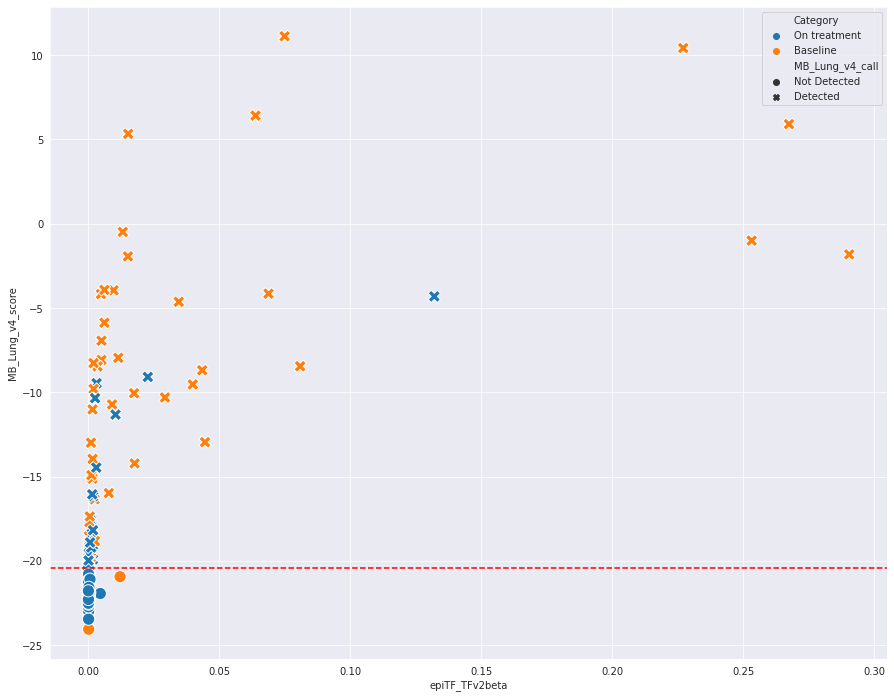

In [90]:
# Define your visit categories
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']

# Categorize samples based on visit names
def categorize_row(row):
    if row['Visit_name'] in on_treatment_visits:
        return "On treatment"
    elif row['Visit_name'] in baseline_visits:
        return "Baseline"
    else:
        return "Progression"

df_BMS_MRD_completed['Category'] = df_BMS_MRD_completed.apply(categorize_row, axis=1)

df_BMS_MRD_completed_no_progression = df_BMS_MRD_completed[df_BMS_MRD_completed["Category"] != "Progression"]

print("Total sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_completed.shape[0]) + "\n") 
print("Total sample size of BMS_SOW33_Infinity_01 batch after removing progression is " + str(df_BMS_MRD_completed_no_progression.shape[0]) + "\n")

# Now plot with seaborn
plt.figure(figsize=(15, 12))

# Use hue for the Category and style for the MB_Lung_v4_call, with markers as circle and x
sns.scatterplot(data=df_BMS_MRD_completed_no_progression, x='epiTF_TFv2beta', y='MB_Lung_v4_score', 
                hue='Category', style='MB_Lung_v4_call', s=150)

# Draw the horizontal line at the specified y-value
plt.axhline(y=-20.398620396045953, color='r', linestyle='--')

# Show the legend and plot
plt.legend(loc='upper right')
plt.show()


Total sample size of BMS_SOW33_Infinity_01 batch is 236

Total sample size of BMS_SOW33_Infinity_01 batch after removing progression is 222



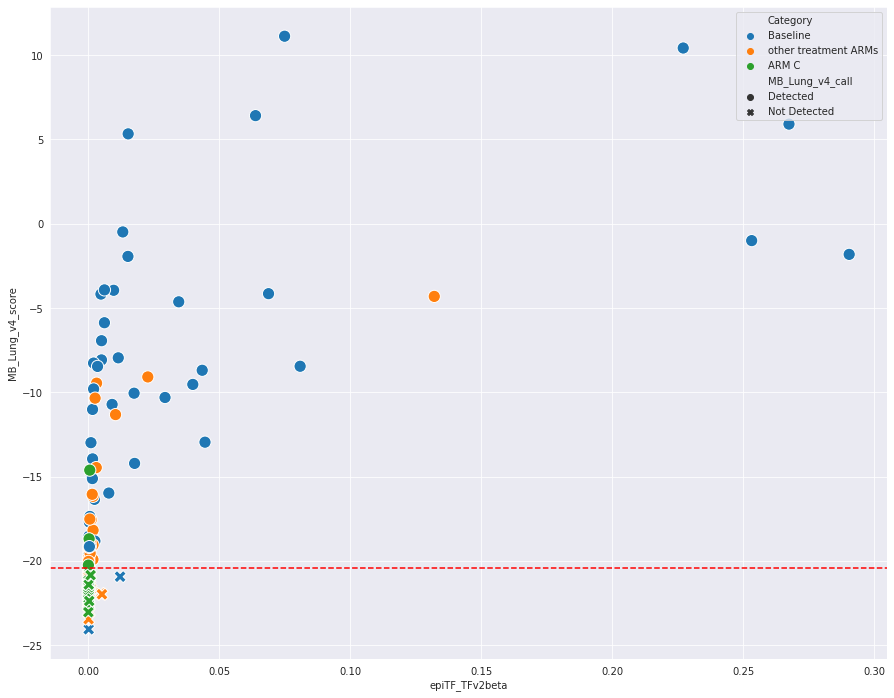

In [92]:
df_BMS_MRD_completed_no_progression = df_BMS_MRD_all_7[df_BMS_MRD_all_7["Category"] != "Progression"]

print("Total sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_completed.shape[0]) + "\n") 
print("Total sample size of BMS_SOW33_Infinity_01 batch after removing progression is " + str(df_BMS_MRD_completed_no_progression.shape[0]) + "\n")

# Now plot with seaborn
plt.figure(figsize=(15, 12))

# Use hue for the Category and style for the MB_Lung_v4_call, with markers as circle and x
sns.scatterplot(data=df_BMS_MRD_completed_no_progression, x='epiTF_TFv2beta', y='MB_Lung_v4_score', 
                hue='Category', style='MB_Lung_v4_call', s=150)

# Draw the horizontal line at the specified y-value
plt.axhline(y=-20.398620396045953, color='r', linestyle='--')

# Show the legend and plot
plt.legend(loc='upper right')
plt.show()


### Correlation analysis between epiTF (methyaltion quantification) and TVF somatic max-VAF (LR and MB)

In [5]:
# Generate the data for correlation analysis
df_LR_pos = df_BMS_MRD_completed[(df_BMS_MRD_completed['ctDNA_detected'] == "Detected") & df_BMS_MRD_completed['maf'].notna()]
print(df_LR_pos.shape)
df_MB_pos = df_BMS_MRD_completed[(df_BMS_MRD_completed['MB_Lung_v4_call'] == "Detected") & df_BMS_MRD_completed['maf'].notna()]
print(df_MB_pos.shape)

(65, 61)
(54, 61)


In [6]:
def analyze_and_plot_correlation_LR(df, x_col, y_col, exclude_categories=None):
    """
    Analyze and plot the correlation between two columns, allowing for exclusion of specified categories.

    Parameters:
    - df: DataFrame containing the data.
    - x_col: The name of the column to be used as the x-axis.
    - y_col: The name of the column to be used as the y-axis.
    - exclude_categories: A list of categories to exclude from the analysis. Defaults to None.
    """
    # Set the plot style
    sns.set_style('darkgrid')

    # Define "on-treatment" visit names
    on_treatment_visits = ["MAINTC1D1", "MAINTC3D1", "MAINTC2D1", "CCRTC3D1", "MAINTC8D1"]

    # Categorize samples based on specified conditions
    def categorize_row(row):
        if row['Visit_name'] in on_treatment_visits:
            if (row['MB_Lung_v4_call'] == "Not Detected") and (row['ctDNA_detected'] == "Detected"):
                return "flipped call (LR+MB-) on treatment"
            else:
                return "on-treatment"
        else:
            if (row['MB_Lung_v4_call'] == "Not Detected") and (row['ctDNA_detected'] == "Detected"):
                return "flipped call (LR+MB-) on baseline/progression"
            else:
                return "Baseline/Progression"

    df['Category'] = df.apply(categorize_row, axis=1)

    # Exclude specified categories if requested
    if exclude_categories:
        df_filtered = df[~df['Category'].isin(exclude_categories)]
    else:
        df_filtered = df

    # Calculate the Pearson and Spearman correlations
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())

    # Print the correlation results
    print(f"Pearson correlation between {x_col} and {y_col}: {pearson_corr:.3f}, p-value: {pearson_p_val:.3g}")
    print(f"Spearman correlation between {x_col} and {y_col}: {spearman_corr:.3f}, p-value: {spearman_p_val:.3g}")

    # Plotting
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x_col, y=y_col, data=df_filtered, hue="Category", palette="bright", edgecolor=None)
    sns.regplot(x=x_col, y=y_col, data=df_filtered, scatter=False, color="gray", logistic=False)

    plt.xscale('log')
    plt.xlabel("TVF somatic max-VAF")
    plt.yscale('log')
    plt.ylabel("epiTFv2beta")
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add text annotation for Pearson and Spearman correlation
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
             ha='left', va='top', transform=plt.gca().transAxes, fontsize=15, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

    plt.show()

    return pearson_corr, pearson_p_val, spearman_corr, spearman_p_val



In [81]:
# LR caller samples result
epiTF_col = "maf"  

#all LR samples (LR+ with reportable somatic variant)
analyze_and_plot_correlation_LR(df_LR_pos, epiTF_col, 'epiTF_TFv2alpha', exclude_categories=None)
analyze_and_plot_correlation_LR(df_LR_pos, epiTF_col, 'epiTF_TFv2alpha', exclude_categories=["flipped call (LR+MB-) on baseline/progression", "flipped call (LR+MB-) on treatment"])
analyze_and_plot_correlation_LR(df_LR_pos, epiTF_col, 'epiTF_TFv2alpha', exclude_categories=["flipped call (LR+MB-) on treatment", "on-treatment"])

NameError: name 'df_LR_pos' is not defined

In [18]:
def analyze_and_plot_correlation_MB(df, x_col, y_col, exclude_categories=None):
    """
    Analyze and plot the correlation between two columns, allowing for exclusion of specified categories.

    Parameters:
    - df: DataFrame containing the data.
    - x_col: The name of the column to be used as the x-axis.
    - y_col: The name of the column to be used as the y-axis.
    - exclude_categories: A list of categories to exclude from the analysis. Defaults to None.
    """
    # Set the plot style
    sns.set_style('darkgrid')

    # Define "on-treatment" visit names
    on_treatment_visits = ["MAINTC1D1", "MAINTC3D1", "MAINTC2D1", "CCRTC3D1", "MAINTC8D1"]

    # Categorize samples based on specified conditions
    def categorize_row(row):
        if row['Visit_name'] in on_treatment_visits:
            if (row['MB_Lung_v4_call'] == "Detected") and (row['ctDNA_detected'] == "Not Detected"):
                return "flipped call (LR-MB+) on treatment"
            else:
                return "on-treatment"
        else:
            if (row['MB_Lung_v4_call'] == "Detected") and (row['ctDNA_detected'] == "Not Detected"):
                return "flipped call (LR-MB+) on baseline/progression"
            else:
                return "Baseline/Progression"

    df['Category'] = df.apply(categorize_row, axis=1)

    # Exclude specified categories if requested
    if exclude_categories:
        df_filtered = df[~df['Category'].isin(exclude_categories)]
    else:
        df_filtered = df

    # Calculate the Pearson and Spearman correlations
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())

    # Print the correlation results
    print(f"Pearson correlation between {x_col} and {y_col}: {pearson_corr:.3f}, p-value: {pearson_p_val:.3g}")
    print(f"Spearman correlation between {x_col} and {y_col}: {spearman_corr:.3f}, p-value: {spearman_p_val:.3g}")

    # Plotting
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x_col, y=y_col, data=df_filtered, hue="Category", palette="bright", edgecolor=None)
    sns.regplot(x=x_col, y=y_col, data=df_filtered, scatter=False, color="gray", logistic=False)

    plt.xscale('log')
    plt.xlabel("TVF somatic max-VAF")
    plt.yscale('log')
    plt.ylabel("epiTFalphav2")
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add text annotation for Pearson and Spearman correlation
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
             ha='left', va='top', transform=plt.gca().transAxes, fontsize=15, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

    plt.show()

    return pearson_corr, pearson_p_val, spearman_corr, spearman_p_val



Pearson correlation between maf and epiTF_TFv2alpha: 0.837, p-value: 3.23e-15
Spearman correlation between maf and epiTF_TFv2alpha: 0.775, p-value: 5.82e-12


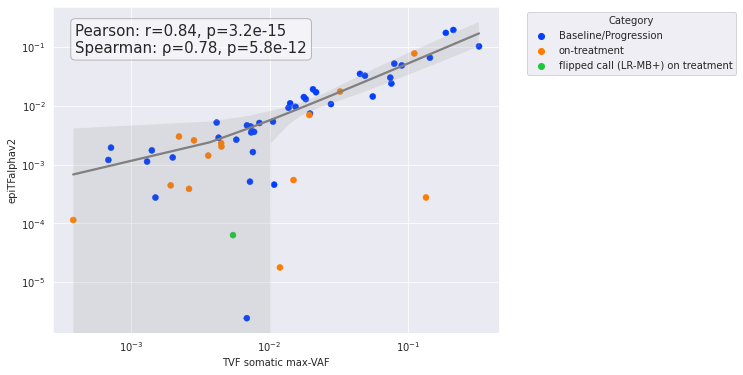

Pearson correlation between maf and epiTF_TFv2alpha: 0.836, p-value: 6.67e-15
Spearman correlation between maf and epiTF_TFv2alpha: 0.782, p-value: 4.53e-12


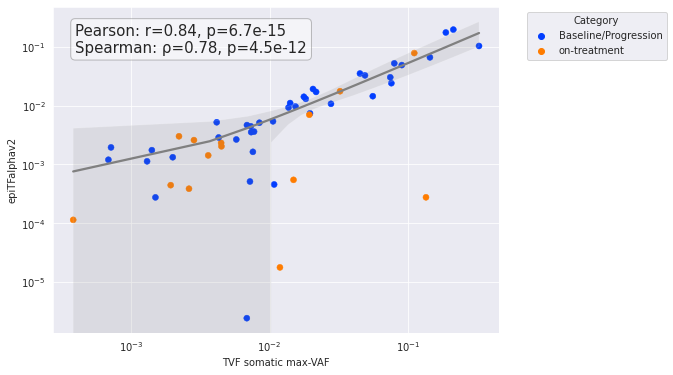

Pearson correlation between maf and epiTF_TFv2alpha: 0.863, p-value: 1.53e-12
Spearman correlation between maf and epiTF_TFv2alpha: 0.910, p-value: 9.9e-16


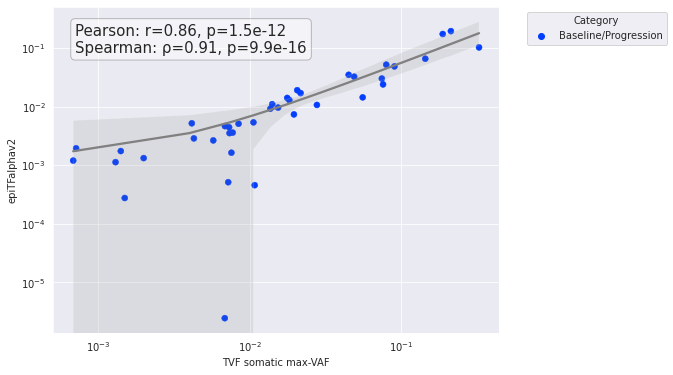

(0.8633570965285139,
 1.52695088626301e-12,
 0.9101214574898786,
 9.903542350577243e-16)

In [29]:
# MB caller samples result
epiTF_col = "maf"  

#all MB samples (LR+ with reportable somatic variant)
analyze_and_plot_correlation_MB(df_MB_pos, epiTF_col, 'epiTF_TFv2alpha', exclude_categories=None)
analyze_and_plot_correlation_MB(df_MB_pos, epiTF_col, 'epiTF_TFv2alpha', exclude_categories=["flipped call (LR-MB+) on baseline/progression", "flipped call (LR-MB+) on treatment"])
analyze_and_plot_correlation_MB(df_MB_pos, epiTF_col, 'epiTF_TFv2alpha', exclude_categories=["flipped call (LR-MB+) on treatment", "on-treatment"])

### Correlation analysis between epiTF (methyaltion quantification) and TVF somatic max-VAF (All)

In [7]:
def analyze_and_plot_correlation_all(df, x_col, y_col, exclude_categories=None):
    """
    Analyze and plot the correlation between two columns, allowing for exclusion of specified categories.

    Parameters:
    - df: DataFrame containing the data.
    - x_col: The name of the column to be used as the x-axis.
    - y_col: The name of the column to be used as the y-axis.
    - exclude_categories: A list of categories to exclude from the analysis. Defaults to None.
    """
    # Set the plot style
    sns.set_style('darkgrid')

    # Define "on-treatment" visit names
    baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
    on_treatment_visits = ["MAINTC1D1", "MAINTC3D1", "MAINTC2D1", "CCRTC3D1", "MAINTC8D1"]

    # Categorize samples based on specified conditions
    def categorize_row(row):
        if row['Visit_name'] in on_treatment_visits:
            return "On treatment"
        elif row['Visit_name'] in baseline_visits:
            return "Baseline"
        else:
            return "Progression"

    df['Category'] = df.apply(categorize_row, axis=1)

    # Exclude specified categories if requested
    if exclude_categories:
        df_filtered = df[~df['Category'].isin(exclude_categories)]
    else:
        df_filtered = df

    # Calculate the Pearson and Spearman correlations
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())

    # Print the correlation results
    print(f"Pearson correlation between {x_col} and {y_col}: {pearson_corr:.3f}, p-value: {pearson_p_val:.3g}")
    print(f"Spearman correlation between {x_col} and {y_col}: {spearman_corr:.3f}, p-value: {spearman_p_val:.3g}")

    # Plotting
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x_col, y=y_col, data=df_filtered, hue="Category", palette="bright", edgecolor=None)
    sns.regplot(x=x_col, y=y_col, data=df_filtered, scatter=False, color="gray", logistic=False)

    plt.xscale('log')
    plt.xlabel("TVF somatic max-VAF")
    plt.yscale('log')
    plt.ylabel("epiTFv2beta")
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add text annotation for Pearson and Spearman correlation
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
             ha='left', va='top', transform=plt.gca().transAxes, fontsize=15, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

    # Adding a red dashed line for x=y
    ax = plt.gca()  # Get the current Axes instance on the current figure matching the given keyword args, or create one.
    xlim = ax.get_xlim()  # Get the x-axis view limits
    ylim = ax.get_ylim()  # Get the y-axis view limits

    # Assuming your log scale might change the limits, set the line from the minimum to the maximum of the combined limits
    min_limit = min(xlim[0], ylim[0])
    max_limit = max(xlim[1], ylim[1])
    plt.plot([min_limit, max_limit], [min_limit, max_limit], 'r--')  # Plot the red dashed line

    plt.xlim(xlim)  # Set the x-axis view limits
    plt.ylim(ylim)  # Set the y-axis view limits

    plt.show()

    return pearson_corr, pearson_p_val, spearman_corr, spearman_p_val



Total sample size of BMS_SOW33_Infinity_01 batch with somatic maf is 54

Pearson correlation between maf and epiTF_TFv2beta: 0.920, p-value: 9.16e-23
Spearman correlation between maf and epiTF_TFv2beta: 0.760, p-value: 2.59e-11


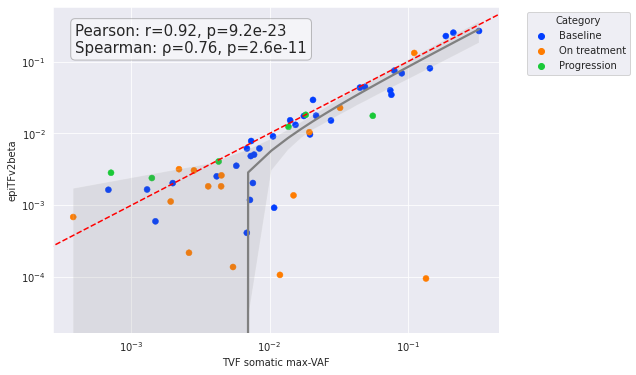

Pearson correlation between maf and epiTF_TFv2beta: 0.921, p-value: 1.81e-20
Spearman correlation between maf and epiTF_TFv2beta: 0.758, p-value: 4.33e-10


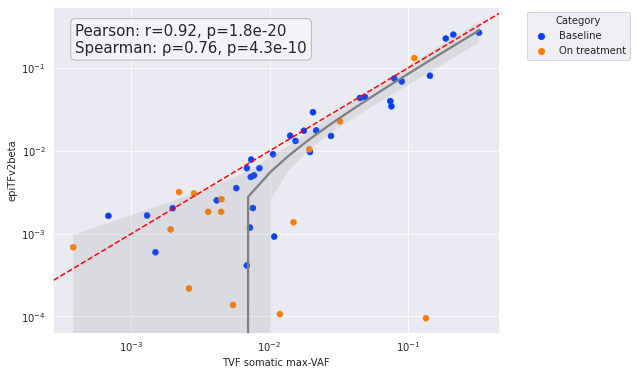

Pearson correlation between maf and epiTF_TFv2beta: 0.961, p-value: 8.74e-19
Spearman correlation between maf and epiTF_TFv2beta: 0.929, p-value: 6.56e-15


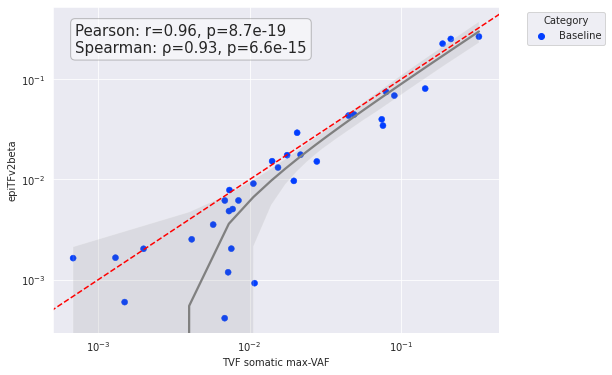

Pearson correlation between maf and epiTF_TFv2beta: 0.582, p-value: 0.0227
Spearman correlation between maf and epiTF_TFv2beta: 0.150, p-value: 0.594


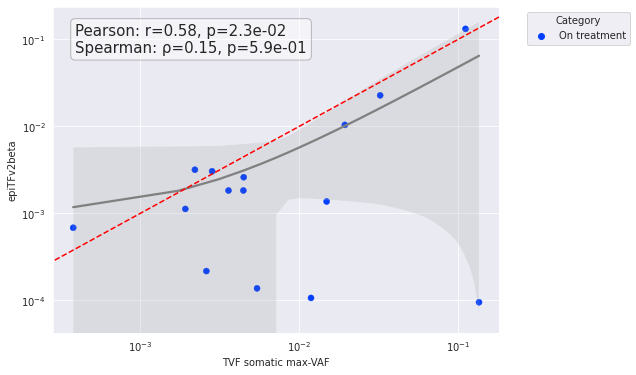

(0.5824601635608327, 0.022701878418087643, 0.15, 0.5936302027425882)

In [8]:
# generate the regression analysis for MB lung v4 positive samples
df_MB_pos_dropna = df_MB_pos[df_MB_pos['maf'].notna()]
print("Total sample size of BMS_SOW33_Infinity_01 batch with somatic maf is " + str(df_MB_pos_dropna.GHSampleID.unique().size) + "\n") 

epiTF_col = "maf"  

analyze_and_plot_correlation_all(df_MB_pos_dropna, epiTF_col, 'epiTF_TFv2beta', exclude_categories=None)
analyze_and_plot_correlation_all(df_MB_pos_dropna, epiTF_col, 'epiTF_TFv2beta', exclude_categories=["Progression"])
analyze_and_plot_correlation_all(df_MB_pos_dropna, epiTF_col, 'epiTF_TFv2beta', exclude_categories=["On treatment", "Progression"])
analyze_and_plot_correlation_all(df_MB_pos_dropna, epiTF_col, 'epiTF_TFv2beta', exclude_categories=["Baseline", "Progression"])

### Deep deive on the outliers of the association between epiTFv2 and somaticTF on baseline samples

Pearson correlation: r=0.961, p-value=8.74e-19
Spearman correlation: ρ=0.929, p-value=6.56e-15


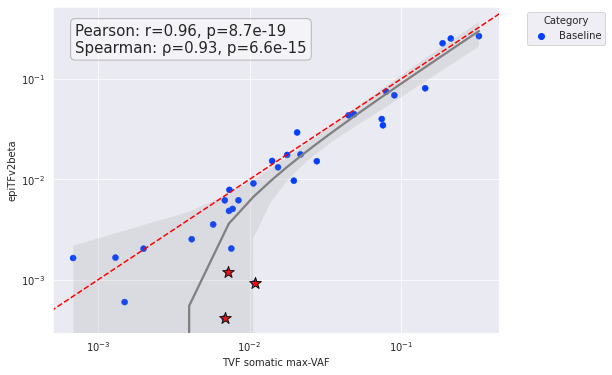

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected,MB_Lung_v4_call,MB_Lung_v4_score,epiTF_TFv2beta,Category,abs_diff
142,CA209-73L,AP948176G,A0820917,B00484176,0027-01736,NSCLC,NaN,CCRTC2D1,SUCCESS,NaN,Detected,0.002372,4.914,2.0,0,06/29/2023,10/17/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484176,0.006834,TP53,R267P,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577138.0,8.0,R267P,C>G,c.800G>C,NM_000546.6,0.006834,NaN,COSV52691512,rs587780075,462.0,B00484176,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484176,LUNG,2.128147,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.683371,Yes,Detected,Detected,Detected,-17.701394,0.000412,Baseline,2.809252
150,CA209-73L,AP285490G,A0820903,B00484210,0053-01380,NSCLC,NaN,CCRTC1D1,SUCCESS,NaN,Detected,0.001033,15.132,2.0,0,06/29/2023,04/04/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484210,0.010773,KRAS,V14I,"{""LUNG"":""common clonal SNV"",""BREAST"":""G360 gene whitelist SNV"",""BLADDER"":""G360 gene whitelist SNV"",""CRC"":""common subclonal SNV"",""OVARIAN"":""uncommon SNV"",""HN"":""uncommon SNV"",""GASTRIC"":""uncommon SNV"",""LIVER"":""uncommon SNV"",""MELANOMA"":""uncommon SNV"",""PANCREATIC"":""uncommon SNV"",""PROSTATE"":""uncommon SNV"",""RCC"":""G360 gene whitelist SNV""}",1,SNV,NaN,KRAS,12.0,25398279.0,2.0,V14I,C>T,c.40G>A,NM_004985.5,0.010773,NaN,COSV55501342,rs104894365,1649.0,B00484210,"{""LUNG"":""common clonal SNV"",""BREAST"":""G360 gene whitelist SNV"",""BLADDER"":""G360 gene whitelist SNV"",""CRC"":""common subclonal SNV"",""OVARIAN"":""uncommon SNV"",""HN"":""uncommon SNV"",""GASTRIC"":""uncommon SNV"",""LIVER"":""uncommon SNV"",""MELANOMA"":""uncommon SNV"",""PANCREATIC"":""uncommon SNV"",""PROSTATE"":""uncommon SNV"",""RCC"":""G360 gene whitelist SNV""}",B00484210,LUNG,3.008649,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",1.077310,Yes,Detected,Detected,Detected,-19.796964,0.000921,Baseline,2.459472
172,CA209-73L,EP832249G,A0820963,B00484261,0025-01113,NSCLC,NaN,CCRTC1D1,SUCCESS,NaN,Detected,0.000848,4.342,2.0,0,06/30/2023,12/07/2021,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCL

In [9]:
# Label the outliers in baseline only samples (> 1.5 SD on the mean difference)

def identify_outliers(df, x_col, y_col, threshold):
    ''' Identify the outliers based on a certain number of standard deviations away from the mean difference'''
    df['abs_diff'] = abs(np.log(df[x_col]) - np.log(df[y_col]))
    mean_diff = df['abs_diff'].mean()
    std_diff = df['abs_diff'].std()
    outlier_condition = df['abs_diff'] > (mean_diff + threshold * std_diff)
    df_outliers = df[outlier_condition]
    return df_outliers

def analyze_and_plot_correlation_all_outlier(df, x_col, y_col, exclude_categories=None, baseline_outliers=None):
    sns.set_style('darkgrid')

    # Define "on-treatment" and "baseline" visit names
    baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
    on_treatment_visits = ["MAINTC1D1", "MAINTC3D1", "MAINTC2D1", "CCRTC3D1", "MAINTC8D1"]

    # Categorize samples based on visit names
    def categorize_row(row):
        if row['Visit_name'] in on_treatment_visits:
            return "On treatment"
        elif row['Visit_name'] in baseline_visits:
            return "Baseline"
        else:
            return "Progression"

    df['Category'] = df.apply(categorize_row, axis=1)

    # Exclude specified categories if requested
    if exclude_categories:
        df_filtered = df[~df['Category'].isin(exclude_categories)]
    else:
        df_filtered = df

    # Plotting
    plt.figure(figsize=(8, 6))

    # Plot all points excluding outliers
    sns.scatterplot(x=x_col, y=y_col, data=df_filtered, hue="Category", palette="bright", edgecolor=None)

    # Highlight baseline outliers if provided
    if baseline_outliers is not None:
        baseline_df = df_filtered[df_filtered['Category'] == 'Baseline']
        sns.scatterplot(x=x_col, y=y_col, data=baseline_df.loc[baseline_outliers], color="red", edgecolor="black", marker='*', s=150, legend=False)

    # Add linear regression fit on the data
    sns.regplot(x=x_col, y=y_col, data=df_filtered, scatter=False, color="gray", logistic=False)

    # Set log scale for axes
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel("TVF somatic max-VAF")
    plt.ylabel("epiTFv2beta")

    # Calculate Pearson and Spearman correlations for the filtered data
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(df_filtered[x_col].dropna(), df_filtered[y_col].dropna())

    # Print the correlation results
    print(f"Pearson correlation: r={pearson_corr:.3f}, p-value={pearson_p_val:.3g}")
    print(f"Spearman correlation: ρ={spearman_corr:.3f}, p-value={spearman_p_val:.3g}")

    # Add text annotation for Pearson and Spearman correlation
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
             ha='left', va='top', transform=plt.gca().transAxes, fontsize=15, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

    # Adding a red dashed line for x=y
    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    min_limit = min(xlim[0], ylim[0])
    max_limit = max(xlim[1], ylim[1])
    plt.plot([min_limit, max_limit], [min_limit, max_limit], 'r--')

    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()

    # Return the correlation coefficients
    return pearson_corr, pearson_p_val, spearman_corr, spearman_p_val


# Identify outliers within the 'Baseline' category first
baseline_df = df_MB_pos_dropna[df_MB_pos_dropna['Category'] == 'Baseline']
baseline_outliers = identify_outliers(baseline_df, 'maf', 'epiTF_TFv2beta', 1.5)
baseline_outliers_indices = baseline_outliers.index
# Call the plotting function with these outliers
analyze_and_plot_correlation_all_outlier(df_MB_pos_dropna, 'maf', 'epiTF_TFv2beta', exclude_categories=["On treatment", "Progression"], baseline_outliers=baseline_outliers_indices)

# Print all the baseline ourliers
baseline_outliers

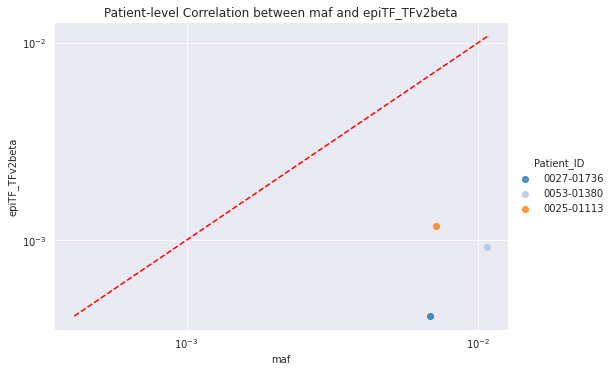

In [10]:
# Select baseline outliers samples for longitudinal checking
df_baseline_outlier_patients = df_MB_pos_dropna[(df_MB_pos_dropna['Patient_ID'] == "0027-01736") | (df_MB_pos_dropna['Patient_ID'] == "0053-01380") | (df_MB_pos_dropna['Patient_ID'] == "0025-01113")]

# Generate patient-level longitudinal correlation plot of all patients  with "On treatment" samples (meanwhile its the somaticTF should be available too)

sns.lmplot(x='maf', y='epiTF_TFv2beta', hue='Patient_ID', data=df_baseline_outlier_patients,
           aspect=1.5, ci=None, palette='tab20')

# Determine the limits of your data on a log scale for accurate plotting
min_lim = min(df_baseline_outlier_patients['maf'].min(), df_baseline_outlier_patients['epiTF_TFv2beta'].min())
max_lim = max(df_baseline_outlier_patients['maf'].max(), df_baseline_outlier_patients['epiTF_TFv2beta'].max())

# Since the axes are logarithmic, ensure the line extends across the full data range
plt.plot([min_lim, max_lim], [min_lim, max_lim], 'r--')  # 'r--' specifies a red dashed line

plt.title('Patient-level Correlation between maf and epiTF_TFv2beta')
plt.xscale('log')
plt.xlabel('maf')
plt.yscale('log')
plt.ylabel('epiTF_TFv2beta')


plt.show()


### Deep deive all deviated on-treatment samples (all of them) of the association between epiTFv2 and somaticTF

#### Patient level of longitudinal coorelation analysis of TVF somatic max-VAF and epiTFv2beta for the patients including on-treatment samples

In [11]:
# Identify all the patients with "On treatment" samples (meanwhile its the somaticTF should be available too)

# Step 1: Filter to get "On treatment" rows
df_on_treatment = df_MB_pos_dropna[df_MB_pos_dropna['Category'] == "On treatment"]

# Step 2: Create a list of unique "Patient_ID" from the filtered dataframe
patient_ids_on_treatment = df_on_treatment['Patient_ID'].unique()

# Step 3: Select all rows from the original dataframe where "Patient_ID" is in the list
df_selected_patients = df_MB_pos_dropna[df_MB_pos_dropna['Patient_ID'].isin(patient_ids_on_treatment)]

print("Total patient size of BMS_SOW33_Infinity_01 batch that including on-treatment samples and somatic TF is " + str(df_selected_patients.shape[0]) + "\n") 

df_selected_patients.Category.value_counts()


Total patient size of BMS_SOW33_Infinity_01 batch that including on-treatment samples and somatic TF is 27



On treatment    15
Baseline         8
Progression      4
Name: Category, dtype: int64

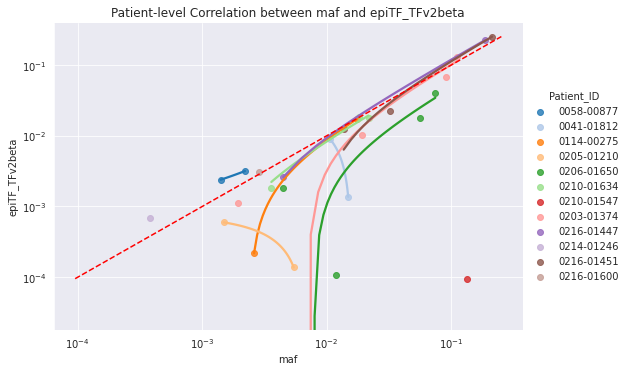

In [12]:
# Generate patient-level longitudinal correlation plot of all patients  with "On treatment" samples (meanwhile its the somaticTF should be available too)

sns.lmplot(x='maf', y='epiTF_TFv2beta', hue='Patient_ID', data=df_selected_patients,
           aspect=1.5, ci=None, palette='tab20')

# Determine the limits of your data on a log scale for accurate plotting
min_lim = min(df_selected_patients['maf'].min(), df_selected_patients['epiTF_TFv2beta'].min())
max_lim = max(df_selected_patients['maf'].max(), df_selected_patients['epiTF_TFv2beta'].max())

# Since the axes are logarithmic, ensure the line extends across the full data range
plt.plot([min_lim, max_lim], [min_lim, max_lim], 'r--')  # 'r--' specifies a red dashed line

plt.title('Patient-level Correlation between maf and epiTF_TFv2beta')
plt.xscale('log')
plt.xlabel('maf')
plt.yscale('log')
plt.ylabel('epiTF_TFv2beta')


plt.show()


In [13]:
# # Create a FacetGrid to plot individual patient trends separately
# g = sns.FacetGrid(df_selected_patients, col="Patient_ID", col_wrap=4, sharex=False, sharey=False, height=3, aspect=1.5)
# g = g.map(sns.regplot, "maf", "epiTF_TFv2beta", scatter_kws={'alpha':0.5}, line_kws={'color':'red'})

# # Loop over each subplot to set the scale to log
# for ax in g.axes:
#     ax.set_xscale('log')
#     ax.set_yscale('log')

# # Add a main title
# plt.subplots_adjust(top=0.9)
# g.fig.suptitle('Individual Patient Trends: maf vs. epiTF_TFv2beta')

# # Show the plot
# plt.show()


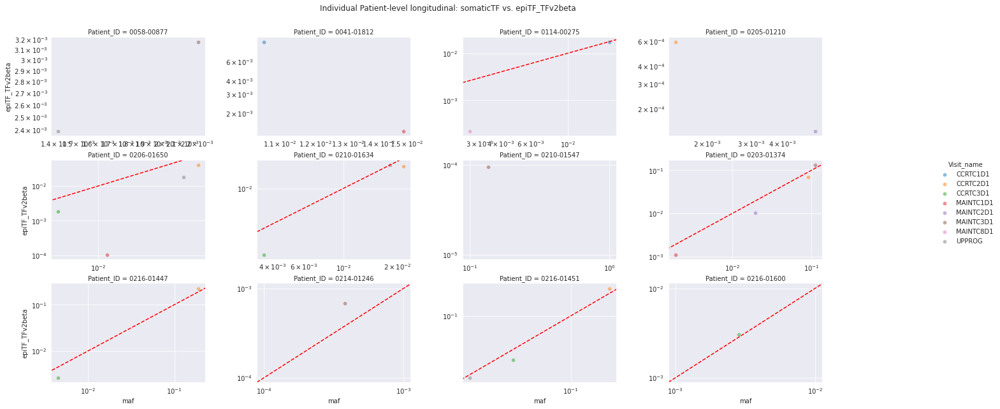

In [14]:
# Create a FacetGrid to plot individual patient trends separately

# Define the order and palette for "Visit_name"
visit_name_order = ['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG']
palette = sns.color_palette('tab10', n_colors=len(visit_name_order))

# Create a FacetGrid
g = sns.FacetGrid(df_selected_patients, col="Patient_ID", col_wrap=4, sharex=False, sharey=False, height=3, aspect=1.5, hue='Visit_name', palette=palette, hue_order=visit_name_order)

# Map the scatter plots with color-coding
g.map_dataframe(sns.scatterplot, 'maf', 'epiTF_TFv2beta', alpha=0.5)

# Loop over each subplot to set the scale to log and add the x=y line
for ax in g.axes.flatten():
    ax.set_xscale('log')
    ax.set_yscale('log')
    # Get current axis limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    # Set the limits for x=y line
    min_limit = min(xlim[0], ylim[0])
    max_limit = max(xlim[1], ylim[1])
    # Add the x=y line
    ax.plot([min_limit, max_limit], [min_limit, max_limit], 'r--')
    # Restore the original limits after plotting the line
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

# Add a main title
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Individual Patient-level longitudinal: somaticTF vs. epiTF_TFv2beta')

# Add the legend outside the plots
g.add_legend(title="Visit_name", bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0.)

# Show the plot
plt.show()


#### Resistant mutation check for individual longitudinal change of TVF mutation VAF and methylation socre

In [33]:
# Check individual longitudinal change of TVF mutation VAF and methylation socre
# df_tvf_call_1 is the dataframe with TVF filtered variants not just limited to the max TVF somaticTF
df_tvf_call_1_new = df_tvf_call_1.copy()
df_tvf_call_1_new["Variant_merged_info"] = df_tvf_call_1_new["Gene"] + str(" ") + df_tvf_call_1_new["Mut_aa"] 

In [34]:
# Update the visit_name
df_tvf_call_1_new_2 = df_tvf_call_1_new.copy()
print(df_tvf_call_1_new_2.Visit_name.value_counts())

#read in e-manifest.csv file
df_manifest = pd.read_csv(f"{work_dir}/emanifest_copy.csv", header = 0) 

# Step 1: Deduplicate df_manifest with corrected column names
unique_manifest = df_manifest.drop_duplicates(subset=['Customer Sample ID', 'Patient ID'], keep='first')
unique_manifest_renamed = unique_manifest.rename(columns={"Customer Sample ID": "Customer_SampleID", "Sample Time point": "Visit_name", "Patient ID": "Patient_ID"})

# Step 2: Perform the merge
merged_df_tvf = pd.merge(df_tvf_call_1_new_2, unique_manifest_renamed[['Customer_SampleID', 'Patient_ID', 'Visit_name']], on=['Customer_SampleID', 'Patient_ID'], how='left', suffixes=('', '_new'))

# Step 3: Replace 'Visit_name' with 'Visit_name_new', handling NaNs
merged_df_tvf['Visit_name'] = merged_df_tvf['Visit_name_new'].fillna(merged_df_tvf['Visit_name'])

# Step 4: Drop the '_new' column
merged_df_tvf.drop(columns=['Visit_name_new'], inplace=True)

# Resulting dataframe for MR result generation
df_tvf_call_1_new_2 = merged_df_tvf
df_tvf_call_1_new_2.Visit_name.value_counts()

CCRTC2D1               43
MAINTC1D1              20
MAINTC3D1              19
UPPROG                 16
CCRTC1D1               15
MAINT C1/8 D1          15
MAINTC2D1              14
CCRTC3D1               12
MAINTC8D1               6
ARM C MAINT C1/8 D1     1
Name: Visit_name, dtype: int64


CCRTC2D1     46
MAINTC1D1    30
MAINTC3D1    19
UPPROG       16
MAINTC2D1    14
CCRTC1D1     12
MAINTC8D1    12
CCRTC3D1     12
Name: Visit_name, dtype: int64

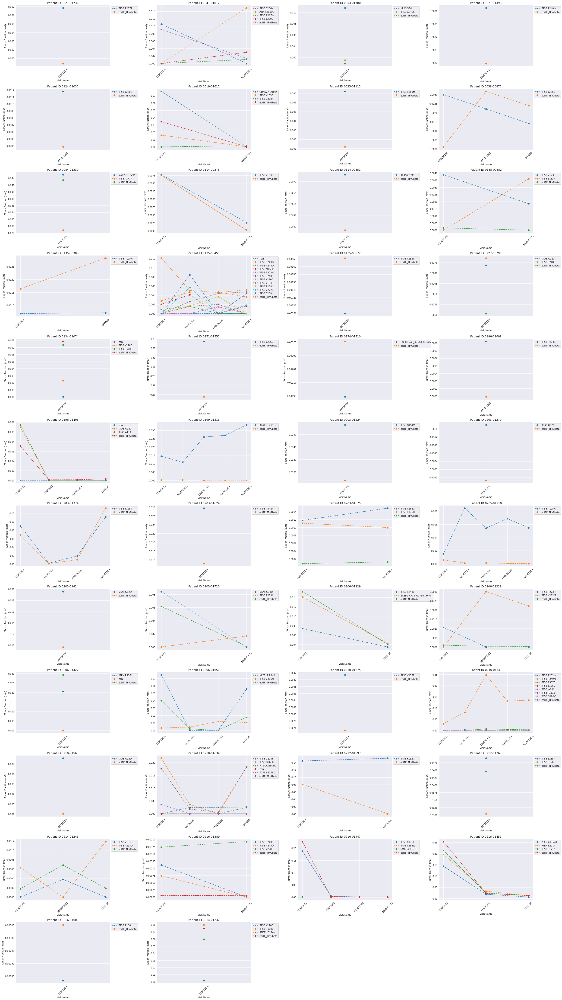

In [35]:
# Check individual longitudinal change of TVF mutation VAF and methylation socre

# Set the order for the x-axis
visit_name_order = ['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG']

# Define a function to plot the data for all Patient_IDs
def plot_all_patient_data(df, visit_name_order):
    # Get the number of unique patients
    patient_ids = df['Patient_ID'].unique()
    num_patients = len(patient_ids)
    
    # Calculate the number of rows for subplots (4 plots per row)
    num_rows = (num_patients + 3) // 4
    fig, axes = plt.subplots(num_rows, 4, figsize=(40, 5 * num_rows))  # Adjust the figure size as needed
    axes = axes.ravel()  # Flatten the axes array for easy iteration
    
    for i, patient_id in enumerate(patient_ids):
        ax = axes[i]
        patient_data = df[df['Patient_ID'] == patient_id]

        # Filter the visit names for the current patient
        patient_visit_names = patient_data['Visit_name'].unique()
        patient_visit_order = [visit for visit in visit_name_order if visit in patient_visit_names]

        # Get all unique variants for this patient, including epiTF_TFv2beta
        unique_variants = patient_data['Variant_merged_info'].unique().tolist()
        if 'epiTF_TFv2beta' in patient_data.columns:
            unique_variants.append('epiTF_TFv2beta')

        # Create a DataFrame to store restructured data
        plot_data = pd.DataFrame(index=patient_visit_order, columns=unique_variants).fillna(0)

        # Fill in the maf values where the variant info is present, else keep it as 0
        for variant in unique_variants:
            if variant == 'epiTF_TFv2beta':
                # Special handling for epiTF_TFv2beta to plot it as a line
                plot_data[variant] = patient_data.groupby('Visit_name')['epiTF_TFv2beta'].first().reindex(patient_visit_order).fillna(0)
            else:
                variant_data = patient_data[patient_data['Variant_merged_info'] == variant]
                for index, row in variant_data.iterrows():
                    plot_data.at[row['Visit_name'], variant] = row['maf']

        # Plot each variant
        for variant in unique_variants:
            ax.plot(plot_data.index, plot_data[variant], marker='o', linestyle='--', label=variant)
        
        # Set the x-axis to have only the visit names present for the patient
        ax.set_xticks(range(len(patient_visit_order)))
        ax.set_xticklabels(patient_visit_order, rotation=45)
        ax.set_xlabel('Visit Name')
        ax.set_ylabel('Tumor Fraction (maf)')
        ax.set_title(f'Patient ID {patient_id}')

        # Set legend outside the plot
        ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    plt.subplots_adjust(right=0.8)

    # Hide any unused subplots if the number of patients is not a multiple of 4
    for j in range(i + 1, num_rows * 4):
        fig.delaxes(axes[j])

    # Show the plot
    plt.show()

# Call the function to plot all patient data
plot_all_patient_data(df_tvf_call_1_new_2, visit_name_order)



## MR analysis

In [7]:
# Load original Infinity RUO output based on LR caller data
df_RUO_report_ori = pd.read_csv(f"{work_dir}/20230919_BristolMyersSquibb_SOW33_237Samples_InfinityReport.csv", header=1)
df_RUO_report_1 = df_RUO_report_ori.copy()
print(df_RUO_report_ori.Visit_name.value_counts())

#read in e-manifest.csv file
df_manifest = pd.read_csv(f"{work_dir}/emanifest_copy.csv", header = 0) 

# Step 1: Deduplicate df_manifest with corrected column names
unique_manifest = df_manifest.drop_duplicates(subset=['Customer Sample ID', 'Patient ID'], keep='first')
unique_manifest_renamed = unique_manifest.rename(columns={"Customer Sample ID": "Customer_SampleID", "Sample Time point": "Visit_name", "Patient ID": "Patient_ID"})

# Step 2: Perform the merge
merged_df_1 = pd.merge(df_RUO_report_1, unique_manifest_renamed[['Customer_SampleID', 'Patient_ID', 'Visit_name']], on=['Customer_SampleID', 'Patient_ID'], how='left', suffixes=('', '_new'))

# Step 3: Replace 'Visit_name' with 'Visit_name_new', handling NaNs
merged_df_1['Visit_name'] = merged_df_1['Visit_name_new'].fillna(merged_df_1['Visit_name'])

# Step 4: Drop the '_new' column
merged_df_1.drop(columns=['Visit_name_new'], inplace=True)

# Resulting dataframe for MR result generation
df_RUO_report_1 = merged_df_1
df_RUO_report_1.Visit_name.value_counts()

CCRTC2D1               1744
MAINTC3D1              1167
MAINTC1D1              1033
CCRTC3D1                944
MAINTC2D1               900
ARM C MAINT C1/8 D1     728
UPPROG                  608
CCRTC1D1                593
MAINTC8D1               291
MAINT C1/8 D1           116
MAINT C3 D1              25
Name: Visit_name, dtype: int64


CCRTC2D1     1918
MAINTC1D1    1533
MAINTC3D1    1167
CCRTC3D1      944
MAINTC2D1     925
MAINTC8D1     635
UPPROG        608
CCRTC1D1      419
Name: Visit_name, dtype: int64

In [8]:
#name the visit time point so that Kyle's MR script won't recognize multiple time points as T0, T1, T2....

#mapping rule
visit_mapping = {
    'CCRTC1D1': 'CCRTC1D1',
    'CCRTC2D1': 'CCRTC2D1',
    'CCRTC3D1': 'CCRTC3D1',
    'MAINTC8D1': 'MAINT8',
    'MAINTC1D1': 'MAINT1',
    'MAINTC2D1': 'MAINT2',
    'MAINTC3D1': 'MAINT3',
    'MAINTC8D1': 'MAINT8',
    'UPPROG': 'UPPROG',
}

#create the new 'pre_vs_post' column based on the 'visit' column using the mapping
df_RUO_report_1['Visit_name'] = df_RUO_report_1['Visit_name'].map(visit_mapping)
print(df_RUO_report_1.Visit_name.value_counts())

#save the final version for Kyle's MR script
df_RUO_report_1.to_csv(f"{work_dir}/20240319_BristolMyersSquibb_SOW33_237Samples_InfinityReport.csv", index=False)


CCRTC2D1    1918
MAINT1      1533
MAINT3      1167
CCRTC3D1     944
MAINT2       925
MAINT8       635
UPPROG       608
CCRTC1D1     419
Name: Visit_name, dtype: int64


In [9]:
df_mrv2_dmr_all = pd.read_csv(f"{work_dir}/20240319_BristolMyersSquibb_SOW33_norm_mols.csv.gz", header=0)
print(df_mrv2_dmr_all.shape)
df_mrv2_dmr_1339 = df_mrv2_dmr_all[df_mrv2_dmr_all["run_sample_id_A"] == "B00484175"]
df_mrv2_dmr_1339.shape

(26885, 14)


(17322, 14)

### Correlation between MRv1 and MRv2.1

In [10]:
# Used Kyle's MR script to generate the final version of the MRv1 and v2 comparison
# The final merged MRv1 and MRv2 comparison file is called "20240328_BMS_MR_merged.csv"
# The manually filtered version of the MRv1 and MRv2 comparison file is called "20240328_BMS_MRv1v2_filtered_manually.csv" which only contains the rows with quantificable values on both MRv1 and MRv2
df_mrv1_v2 = pd.read_csv(f"{work_dir}/20240328_BMS_MRv1v2_filtered_manually.csv", header=0)
df_mrv1_v2.head()

,Patient_ID,Visit_name_A,Visit_name_B,Ctdna_percentage_change_v2,Ctdna_level_change_v2,Ctdna_percentage_change_v1,Ctdna_level_change_v1
0,0084-01339,CCRTC1D1,MAINTC1D1,-100,Decrease,-95,Decrease
1,0084-01339,CCRTC1D1,MAINTC2D1,-100,Decrease,-100,Decrease
2,0084-01339,CCRTC1D1,MAINTC3D1,-100,Decrease,-97,Decrease
3,0084-01339,CCRTC1D1,UPPROG,-100,Decrease,-100,Decrease
4,0114-00275,CCRTC1D1,MAINTC1D1,-95,Decrease,-100,Decrease


Pearson correlation between Ctdna_percentage_change_v2 and Ctdna_percentage_change_v1: 0.392, p-value: 0.0078
Spearman correlation between Ctdna_percentage_change_v2 and Ctdna_percentage_change_v1: 0.629, p-value: 3.77e-06


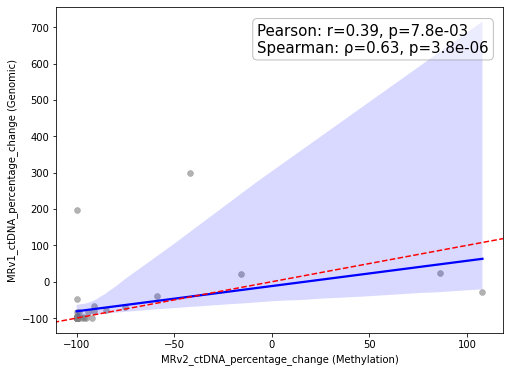

({'Ctdna_percentage_change_v2': 0.3916747767481482},
 {'Ctdna_percentage_change_v2': 0.007797083923417176},
 {'Ctdna_percentage_change_v2': 0.6286112655588062},
 {'Ctdna_percentage_change_v2': 3.7666895289065747e-06})

In [11]:
def analyze_and_plot_correlation_general(df, x_cols, y_col):
    correlations = {}
    spearman_correlations = {}
    p_values = {}
    spearman_p_values = {} 

    for x_col in x_cols:
        # Check if both columns have at least 2 elements
        if len(df[x_col]) < 2 or len(df[y_col]) < 2:
            print(f"Insufficient data for {x_col} and {y_col}. Skipping.")
            continue

        # Calculate the Pearson correlation coefficient and p-value
        pearson_corr, pearson_p_val = scipy.stats.pearsonr(df[x_col], df[y_col])
        correlations[x_col] = pearson_corr
        p_values[x_col] = pearson_p_val

        # Calculate the Spearman correlation coefficient and p-value
        spearman_corr, spearman_p_val = scipy.stats.spearmanr(df[x_col], df[y_col])
        spearman_correlations[x_col] = spearman_corr
        spearman_p_values[x_col] = spearman_p_val

        # Print the correlation results
        print(f"Pearson correlation between {x_col} and {y_col}: {pearson_corr:.3f}, p-value: {pearson_p_val:.3g}")
        print(f"Spearman correlation between {x_col} and {y_col}: {spearman_corr:.3f}, p-value: {spearman_p_val:.3g}")
        
        # Create scatter plot for all data points
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=x_col, y=y_col, data=df, color="gray", alpha=0.6, edgecolor=None)

        # Draw regression line without scatter points
        sns.regplot(x=x_col, y=y_col, data=df, scatter=False, color="blue")

        # Add text annotation for Pearson and Spearman correlation
        plt.text(0.45, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
                ha='left', va='top', transform=plt.gca().transAxes, fontsize=15,
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

        # Adding a red dashed line for x=y
        ax = plt.gca()  # Get the current Axes instance on the current figure matching the given keyword args, or create one.
        xlim = ax.get_xlim()  # Get the x-axis view limits
        ylim = ax.get_ylim()  # Get the y-axis view limits

        # Assuming your log scale might change the limits, set the line from the minimum to the maximum of the combined limits
        min_limit = min(xlim[0], ylim[0])
        max_limit = max(xlim[1], ylim[1])
        plt.plot([min_limit, max_limit], [min_limit, max_limit], 'r--')  # Plot the red dashed line

        plt.xlim(xlim)  # Set the x-axis view limits
        plt.ylim(ylim)  # Set the y-axis view limits

        plt.xlabel(x_col)
        plt.xlabel("MRv2_ctDNA_percentage_change (Methylation)")
        plt.ylabel(y_col)
        plt.ylabel("MRv1_ctDNA_percentage_change (Genomic)")
        plt.show()
    return correlations, p_values, spearman_correlations, spearman_p_values


#call the function
epiTF_cols = ["Ctdna_percentage_change_v2"]
analyze_and_plot_correlation_general(df_mrv1_v2, ["Ctdna_percentage_change_v2"], 'Ctdna_percentage_change_v1')


### Correlation between MRv1/MRv2.1 and epiTFv2beta ratio

In [12]:
# Used Kyle's MR script to generate the final version of the MRv1 and v2 comparison
# The complete final merged with sample_id MRv1 and MRv2 comparison file is called "20240328_BMS_MRv1v2_filtered_manually_complete.csv" 
# "20240328_BMS_MRv1v2_filtered_manually_complete.csv" has only include the samples that have both quantificable MRv1 and MRv2.1
df_mrv1_v2_complete = pd.read_csv(f"{work_dir}/20240328_BMS_MRv1v2_filtered_manually_complete.csv", header=0)
df_mrv1_v2_complete.head()

,Patient_ID,Visit_name_A,GHSampleID_A,Visit_name_B,GHSampleID_B,MR_score_percentage_v2,Ctdna_percentage_change_v2,Ctdna_level_change_v2,MR_score_percentage_v1,Ctdna_percentage_change_v1,Ctdna_level_change_v1
0,0084-01339,CCRTC1D1,B00484175,MAINTC1D1,B00484259,0,-100,Decrease,5,-95,Decrease
1,0084-01339,CCRTC1D1,B00484175,MAINTC2D1,B00484253,0,-100,Decrease,0,-100,Decrease
2,0084-01339,CCRTC1D1,B00484175,MAINTC3D1,B00484227,0,-100,Decrease,3,-97,Decrease
3,0084-01339,CCRTC1D1,B00484175,UPPROG,B00484244,0,-100,Decrease,0,-100,Decrease
4,0114-00275,CCRTC1D1,B00484237,MAINTC1D1,B00484257,5,-95,Decrease,0,-100,Decrease


In [15]:
# Add epiTFv2beta values of the "GHSampleID_A" and "GHSampleID_B" to df_mrv1_v2_complete

# Merge for epiTFv2beta_visit_A
df_mrv1_v2_complete_epiTFbeta_A = pd.merge(
    df_mrv1_v2_complete,
    df_BMS_MRD_all_6[['GHSampleID', 'epiTF_TFv2beta']],
    how='left',
    left_on='GHSampleID_A',
    right_on='GHSampleID'
).rename(columns={'epiTF_TFv2beta': 'epiTFv2beta_visit_A'})

# Drop the extra 'GHSampleID' column resulted from the merge
df_mrv1_v2_complete_epiTFbeta_A.drop(columns=['GHSampleID'], inplace=True)

# Merge for epiTFv2beta_visit_B
df_mrv1_v2_complete_epiTFbeta = pd.merge(
    df_mrv1_v2_complete_epiTFbeta_A,
    df_BMS_MRD_all_6[['GHSampleID', 'epiTF_TFv2beta']],
    how='left',
    left_on='GHSampleID_B',
    right_on='GHSampleID'
).rename(columns={'epiTF_TFv2beta': 'epiTFv2beta_visit_B'})

# Drop the extra 'GHSampleID' column resulted from the merge
df_mrv1_v2_complete_epiTFbeta.drop(columns=['GHSampleID'], inplace=True)

df_mrv1_v2_complete_epiTFbeta.head()

,Patient_ID,Visit_name_A,GHSampleID_A,Visit_name_B,GHSampleID_B,MR_score_percentage_v2,Ctdna_percentage_change_v2,Ctdna_level_change_v2,MR_score_percentage_v1,Ctdna_percentage_change_v1,Ctdna_level_change_v1,epiTFv2beta_visit_A,epiTFv2beta_visit_B
0,0084-01339,CCRTC1D1,B00484175,MAINTC1D1,B00484259,0,-100,Decrease,5,-95,Decrease,0.043481,0.000159
1,0084-01339,CCRTC1D1,B00484175,MAINTC2D1,B00484253,0,-100,Decrease,0,-100,Decrease,0.043481,0.000083
2,0084-01339,CCRTC1D1,B00484175,MAINTC3D1,B00484227,0,-100,Decrease,3,-97,Decrease,0.043481,0.000212
3,0084-01339,CCRTC1D1,B00484175,UPPROG,B00484244,0,-100,Decrease,0,-100,Decrease,0.043481,0.000015
4,0114-00275,CCRTC1D1,B00484237,MAINTC1D1,B00484257,5,-95,Decrease,0,-100,Decrease,0.017481,0.000309


In [16]:
def analyze_and_plot_correlation_general(df, x_cols, y_col):
    correlations = {}
    spearman_correlations = {}
    p_values = {}
    spearman_p_values = {} 

    for x_col in x_cols:
        # Check if both columns have at least 2 elements
        if len(df[x_col]) < 2 or len(df[y_col]) < 2:
            print(f"Insufficient data for {x_col} and {y_col}. Skipping.")
            continue

        # Calculate the Pearson correlation coefficient and p-value
        pearson_corr, pearson_p_val = scipy.stats.pearsonr(df[x_col], df[y_col])
        correlations[x_col] = pearson_corr
        p_values[x_col] = pearson_p_val

        # Calculate the Spearman correlation coefficient and p-value
        spearman_corr, spearman_p_val = scipy.stats.spearmanr(df[x_col], df[y_col])
        spearman_correlations[x_col] = spearman_corr
        spearman_p_values[x_col] = spearman_p_val

        # Print the correlation results
        print(f"Pearson correlation between {x_col} and {y_col}: {pearson_corr:.3f}, p-value: {pearson_p_val:.3g}")
        print(f"Spearman correlation between {x_col} and {y_col}: {spearman_corr:.3f}, p-value: {spearman_p_val:.3g}")

        # Set the plot style
        sns.set_style('darkgrid')
        
        # Create scatter plot for all data points
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=x_col, y=y_col, data=df, color="gray", alpha=0.6, edgecolor=None)

        # Draw regression line without scatter points
        sns.regplot(x=x_col, y=y_col, data=df, scatter=False, color="blue")

        # Add text annotation for Pearson and Spearman correlation
        plt.text(0.45, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
                ha='left', va='top', transform=plt.gca().transAxes, fontsize=15,
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))
        
        # Adding a red dashed line for x=y
        ax = plt.gca()  # Get the current Axes instance on the current figure matching the given keyword args, or create one.
        xlim = ax.get_xlim()  # Get the x-axis view limits
        ylim = ax.get_ylim()  # Get the y-axis view limits

        # Assuming your log scale might change the limits, set the line from the minimum to the maximum of the combined limits
        min_limit = min(xlim[0], ylim[0])
        max_limit = max(xlim[1], ylim[1])
        plt.plot([min_limit, max_limit], [min_limit, max_limit], 'r--')  # Plot the red dashed line

        plt.xlim(xlim)  # Set the x-axis view limits
        plt.ylim(ylim)  # Set the y-axis view limits

        plt.xlabel(x_col)
        plt.xlabel("MR_score_percentage_epiTFv2beta")
        plt.ylabel(y_col)
        plt.ylabel("MR_score_percentage_v2.1")
        plt.show()
    return correlations, p_values, spearman_correlations, spearman_p_values

Pearson correlation between TFv2_MR_score and MR_score_percentage_v2: 0.989, p-value: 4.26e-37
Spearman correlation between TFv2_MR_score and MR_score_percentage_v2: 0.829, p-value: 2.08e-12


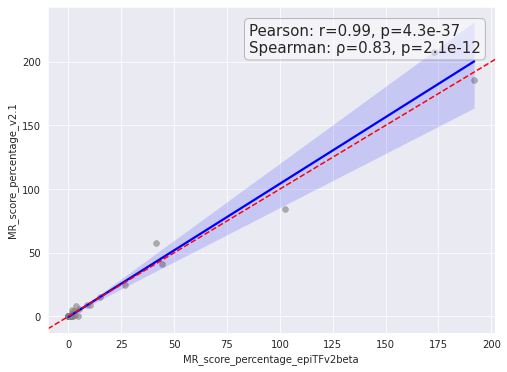

Pearson correlation between TFv2_MR_score and MR_score_percentage_v1: 0.378, p-value: 0.0105
Spearman correlation between TFv2_MR_score and MR_score_percentage_v1: 0.731, p-value: 1.17e-08


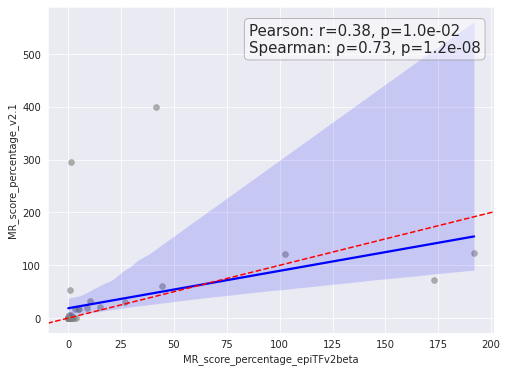

({'TFv2_MR_score': 0.3779379507308678},
 {'TFv2_MR_score': 0.01047750336330322},
 {'TFv2_MR_score': 0.7311379663219127},
 {'TFv2_MR_score': 1.173949610821065e-08})

In [17]:
# Generate a new column "TFv2_MR_score"
df_mrv1_v2_complete_epiTFbeta["TFv2_MR_score"] = (df_mrv1_v2_complete_epiTFbeta["epiTFv2beta_visit_B"] / df_mrv1_v2_complete_epiTFbeta["epiTFv2beta_visit_A"]) * 100
df_mrv1_v2_complete_epiTFbeta.head()

# Corelation analysis for the new column "TFv2_MR_score" vs "MR_score_percentage_v2"
analyze_and_plot_correlation_general(df_mrv1_v2_complete_epiTFbeta, ["TFv2_MR_score"], 'MR_score_percentage_v2')

# Make sure to change the y-axis label in the analyze_and_plot_correlation_general function
# Corelation analysis for the new column "TFv2_MR_score" vs "MR_score_percentage_v1"
analyze_and_plot_correlation_general(df_mrv1_v2_complete_epiTFbeta, ["TFv2_MR_score"], 'MR_score_percentage_v1')


### MRv2.1 vs epiTFv2beta ratio

In [18]:
# Load raw MRv2.1 data
df_mrv2_raw = pd.read_csv(f"{work_dir}/20240328_BristolMyersSquibb_SOW33_Methylation_GuardantResponseRUOReport.csv", header=0)
df_mrv2_raw.head()

,Study_ID,Patient_ID,Visit_name_A,Customer_SampleID_A,GHSampleID_A,GHRequestID_A,Cancertype_A,Sample_status_A,Sample_comment_A,Visit_name_B,Customer_SampleID_B,GHSampleID_B,GHRequestID_B,Cancertype_B,Sample_status_B,Sample_comment_B,Days_between_samples,MR_panel,MR_QC_status,MR_quantifiable,MR_score_percentage,Ctdna_percentage_change,Ctdna_level_change
0,CA209-73L,0041-01812,CCRTC1D1,LP044532B,B00484236,A0820973,NSCLC,SUCCESS,NaN,CCRTC3D1,LP044549B,B00484238,A0820974,NSCLC,SUCCESS,NaN,48,Infinity_methylation,SUCCESS,Quantifiable,7.0,-93.0,Decrease
1,CA209-73L,0041-01812,CCRTC1D1,LP044532B,B00484236,A0820973,NSCLC,SUCCESS,NaN,MAINTC1D1,LP044579B,B00484232,A0820975,NSCLC,SUCCESS,NaN,93,Infinity_methylation,SUCCESS,Quantifiable,10.0,-90.0,Decrease
2,CA209-73L,0071-01398,CCRTC2D1,AP331946G,B00484206,A0820905,NSCLC,SUCCESS,Low Diversity Warning,CCRTC3D1,AP331948G,B00484201,A0820906,NSCLC,SUCCESS,NaN,21,Infinity_methylation,SUCCESS,ctDNA Low,NaN,NaN,NaN
3,CA209-73L,0071-01398,CCRTC2D1,AP331946G,B00484206,A0820905,NSCLC,SUCCESS,Low Diversity Warning,MAINTC1D1,AP331953G,B00484202,A0820907,NSCLC,SUCCESS,NaN,78,Infinity_methylation,SUCCESS,ctDNA Low,NaN,NaN,NaN
4,CA209-73L,0071-01398,CCRTC2D1,AP331946G,B00484206,A0820905,NSCLC,SUCCESS,Low Diversity Warning,MAINTC2D1,AP331955G,B00484200,A0820909,NSCLC,SUCCESS,NaN,106,Infinity_methylation,SUCCESS,ctDNA Low,NaN,NaN,NaN


In [19]:
# Only select the quantifiable MRv2.1
df_mrv2_quantifiable = df_mrv2_raw.dropna(subset=['MR_score_percentage'])

# Add epiTFv2beta values of the "GHSampleID_A" and "GHSampleID_B" to df_mrv2_quantifiable

# Merge for epiTFv2beta_visit_A
df_mrv2_quantifiable_epiTFbeta_A = pd.merge(
    df_mrv2_quantifiable,
    df_BMS_MRD_all_6[['GHSampleID', 'epiTF_TFv2beta']],
    how='left',
    left_on='GHSampleID_A',
    right_on='GHSampleID'
).rename(columns={'epiTF_TFv2beta': 'epiTFv2beta_visit_A'})

# Drop the extra 'GHSampleID' column resulted from the merge
df_mrv2_quantifiable_epiTFbeta_A.drop(columns=['GHSampleID'], inplace=True)

# Merge for epiTFv2beta_visit_B
df_mrv2_quantifiable_epiTFbeta = pd.merge(
    df_mrv2_quantifiable_epiTFbeta_A,
    df_BMS_MRD_all_6[['GHSampleID', 'epiTF_TFv2beta']],
    how='left',
    left_on='GHSampleID_B',
    right_on='GHSampleID'
).rename(columns={'epiTF_TFv2beta': 'epiTFv2beta_visit_B'})

# Drop the extra 'GHSampleID' column resulted from the merge
df_mrv2_quantifiable_epiTFbeta.drop(columns=['GHSampleID'], inplace=True)

df_mrv2_quantifiable_epiTFbeta.head()

print("Total rows of all quantifiable MRv2.1 is " + str(df_mrv2_quantifiable_epiTFbeta.shape[0]) + "\n") 
print("Total rows of all quantifiable of both MRv2.1 and MRv1 is " + str(df_mrv1_v2_complete_epiTFbeta.shape[0]) + "\n") 



Total rows of all quantifiable MRv2.1 is 103

Total rows of all quantifiable of both MRv2.1 and MRv1 is 45



Pearson correlation between TFv2_MR_score and MR_score_percentage: 0.681, p-value: 2.41e-15
Spearman correlation between TFv2_MR_score and MR_score_percentage: 0.709, p-value: 5.61e-17


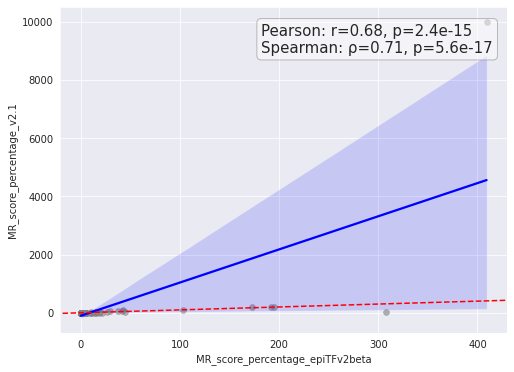

Pearson correlation between TFv2_MR_score and MR_score_percentage: 0.784, p-value: 2.16e-22
Spearman correlation between TFv2_MR_score and MR_score_percentage: 0.698, p-value: 3.38e-16


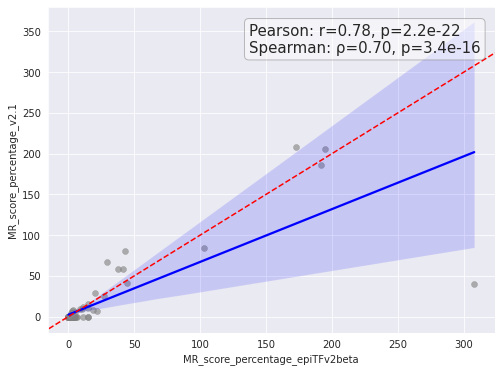

({'TFv2_MR_score': 0.7835748499201078},
 {'TFv2_MR_score': 2.1581893236908667e-22},
 {'TFv2_MR_score': 0.6983459695978145},
 {'TFv2_MR_score': 3.3820744544535526e-16})

In [20]:
# Generate a new column "TFv2_MR_score"
df_mrv2_quantifiable_epiTFbeta["TFv2_MR_score"] = (df_mrv2_quantifiable_epiTFbeta["epiTFv2beta_visit_B"] / df_mrv2_quantifiable_epiTFbeta["epiTFv2beta_visit_A"]) * 100
df_mrv2_quantifiable_epiTFbeta.head()

# Corelation analysis for the new column "TFv2_MR_score" vs "MR_score_percentage_v2"
analyze_and_plot_correlation_general(df_mrv2_quantifiable_epiTFbeta, ["TFv2_MR_score"], 'MR_score_percentage')

# Plot the data by removing the one outlier (i.e. MR_score_percentage = 10000). This is because the rule from Kyle: MR_score_percentage is capped at 10,000% if median molecule is zero in baseline
df_mrv2_quantifiable_epiTFbeta_outlier_removed = df_mrv2_quantifiable_epiTFbeta[df_mrv2_quantifiable_epiTFbeta["MR_score_percentage"] != 10000]
analyze_and_plot_correlation_general(df_mrv2_quantifiable_epiTFbeta_outlier_removed, ["TFv2_MR_score"], 'MR_score_percentage')


In [21]:
from scipy.stats import median_abs_deviation
# Label the outliers in baseline only samples (> 1.5 SD on the mean difference)

def identify_outliers_handle_0s(df, x_col, y_col, threshold, small_value=1e-10):
    ''' Identify outliers based on a certain number of standard deviations away from the mean difference.
        A small value is added to the columns before taking log to handle zero values.'''
    
    # Replace 0 with a small value (to avoid -inf after taking log)
    df[x_col] = df[x_col].replace(0, small_value)
    df[y_col] = df[y_col].replace(0, small_value)
    
    # Calculate the difference in logs
    df['abs_diff'] = abs(np.log(df[x_col]) - np.log(df[y_col]))
    
    # Continue as before
    mean_diff = df['abs_diff'].mean()
    std_diff = df['abs_diff'].std()
    outlier_condition = df['abs_diff'] > (mean_diff + threshold * std_diff)
    df_outliers = df[outlier_condition]
    return df_outliers

# Another way to identify outliers
# The method is the Median Absolute Deviation (MAD), which is less influenced by outliers in the data. We find outliers as points where the absolute difference from the median is greater than a specified number of MAD (A common threshold for MAD is 3)

def identify_outliers_handle_0s_mad(df, x_col, y_col, threshold, small_value=1e-6):
    ''' Identify outliers based on a certain number of median absolute deviations away from the median difference.
        A small value is added to the columns before taking log to handle zero values.'''
    
    # Replace 0 with a small value (to avoid -inf after taking log)
    df[x_col] = df[x_col].replace(0, small_value)
    df[y_col] = df[y_col].replace(0, small_value)
    
    # Calculate the difference in logs
    df['log_diff'] = np.log(df[x_col]) - np.log(df[y_col])
    
    # Calculate the median and MAD of the log difference
    median_diff = df['log_diff'].median()
    mad = median_abs_deviation(df['log_diff'], scale='normal')
    
    # Define the condition for outliers (beyond 'threshold' MADs from the median)
    outlier_condition = np.abs(df['log_diff'] - median_diff) > (threshold * mad)
    df_outliers = df[outlier_condition]
    
    return df_outliers


def analyze_and_plot_correlation_all_outlier_simple(df, x_col, y_col, outliers=None):
    sns.set_style('darkgrid')

    # Plotting
    plt.figure(figsize=(8, 6))

    # Plot all points excluding outliers
    sns.scatterplot(x=x_col, y=y_col, data=df, palette="bright", edgecolor=None)

    # Highlight baseline outliers if provided
    if outliers is not None:
        baseline_df = df
        sns.scatterplot(x=x_col, y=y_col, data=baseline_df.loc[outliers], color="red", edgecolor="black", marker='*', s=150, legend=False)

    # Set the axes limits 
    plt.xlim(-5, 10)
    plt.ylim(-5, 10)

    # Add linear regression fit on the data
    sns.regplot(x=x_col, y=y_col, data=df, scatter=False, color="blue", logistic=False)

    # Set log scale for axes
    # plt.xscale('log')
    # plt.yscale('log')
    plt.xlabel("MR_score_percentage_epiTFv2beta")
    plt.ylabel("MR_score_percentage_v2.1")

    # Calculate Pearson and Spearman correlations for the filtered data
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(df[x_col].dropna(), df[y_col].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(df[x_col].dropna(), df[y_col].dropna())

    # Print the correlation results
    print(f"Pearson correlation: r={pearson_corr:.3f}, p-value={pearson_p_val:.3g}")
    print(f"Spearman correlation: ρ={spearman_corr:.3f}, p-value={spearman_p_val:.3g}")

    # Add text annotation for Pearson and Spearman correlation
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
             ha='left', va='top', transform=plt.gca().transAxes, fontsize=15, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

    # Adding a red dashed line for x=y
    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    min_limit = min(xlim[0], ylim[0])
    max_limit = max(xlim[1], ylim[1])
    plt.plot([min_limit, max_limit], [min_limit, max_limit], 'r--')
    
    
    # Adding a red dashed line for x=y
    plt.plot([-5, 50], [-5, 50], 'r--')

    plt.xlim(xlim)
    plt.ylim(ylim)
    # plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()

    # Return the correlation coefficients
    return pearson_corr, pearson_p_val, spearman_corr, spearman_p_val


Pearson correlation: r=0.784, p-value=2.16e-22
Spearman correlation: ρ=0.698, p-value=3.38e-16


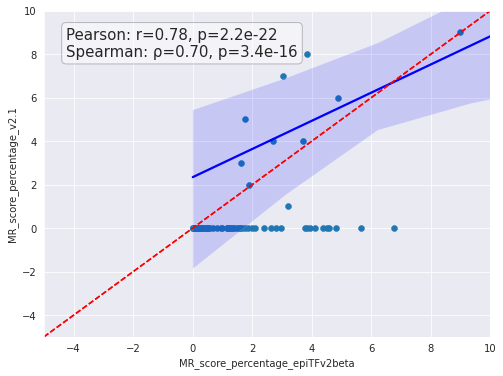

(0, 27)


In [22]:
# Plot the data (the outlier identification does not work because the mean is signficantly affected by outliers)
df_mrv2_quantifiable_epiTFbeta_outliers = identify_outliers_handle_0s(df_mrv2_quantifiable_epiTFbeta_outlier_removed, 'TFv2_MR_score', 'MR_score_percentage', 2, small_value=1e-15)
# df_mrv2_quantifiable_epiTFbeta_outliers = identify_outliers_handle_0s_mad(df_mrv2_quantifiable_epiTFbeta_outlier_removed_test, 'TFv2_MR_score', 'MR_score_percentage', 1.5, small_value=1e-6)

df_mrv2_quantifiable_epiTFbeta_outliers_indices = df_mrv2_quantifiable_epiTFbeta_outliers.index

# Call the plotting function with these outliers
analyze_and_plot_correlation_all_outlier_simple(df_mrv2_quantifiable_epiTFbeta_outlier_removed, 'TFv2_MR_score', 'MR_score_percentage', outliers=df_mrv2_quantifiable_epiTFbeta_outliers_indices)

# analyze_and_plot_correlation_all_outlier_simple(df_mrv2_quantifiable_epiTFbeta_outlier_removed, 'TFv2_MR_score', 'MR_score_percentage', outliers=None)
print(df_mrv2_quantifiable_epiTFbeta_outliers.shape)


In [24]:
df_mrv2_quantifiable_epiTFbeta_outliers_23 = df_mrv2_quantifiable_epiTFbeta[df_mrv2_quantifiable_epiTFbeta["Patient_ID"] == "0135-00450"]
df_mrv2_quantifiable_epiTFbeta_outliers_23

,Study_ID,Patient_ID,Visit_name_A,Customer_SampleID_A,GHSampleID_A,GHRequestID_A,Cancertype_A,Sample_status_A,Sample_comment_A,Visit_name_B,Customer_SampleID_B,GHSampleID_B,GHRequestID_B,Cancertype_B,Sample_status_B,Sample_comment_B,Days_between_samples,MR_panel,MR_QC_status,MR_quantifiable,MR_score_percentage,Ctdna_percentage_change,Ctdna_level_change,epiTFv2beta_visit_A,epiTFv2beta_visit_B,TFv2_MR_score
83,CA209-73L,0135-00450,CCRTC2D1,EP460210F,B00484225,A0820938,NSCLC,SUCCESS,NaN,MAINT C1/8 D1,EP791498F,B00487903,A0820955,NSCLC,SUCCESS,NaN,67,Infinity_methylation,SUCCESS,Quantifiable,58.0,-42.0,Decrease,0.012136,0.005054,41.646144
84,CA209-73L,0135-00450,CCRTC2D1,EP460210F,B00484225,A0820938,NSCLC,SUCCESS,NaN,MAINT C1/8 D1,EP791499F,B00487904,A0820956,NSCLC,SUCCESS,NaN,164,Infinity_methylation,SUCCESS,Quantifiable,80.0,-20.0,Decrease,0.012136,0.005227,43.065453
85,CA209-73L,0135-00450,CCRTC2D1,EP460210F,B00484225,A0820938,NSCLC,SUCCESS,NaN,MAINTC3D1,EP791507F,B00484181,A0820958,NSCLC,SUCCESS,NaN,93,Infinity_methylation,SUCCESS,Quantifiable,59.0,-41.0,Decrease,0.012136,0.004589,37.813615


### Individual MRv2.1 norm mol visualizaiton 

#### R script for heatmap for patient-level

In [ ]:
# Create Patient-level data for heatmap plot using R script that MY shared (Heatmap_individual_final_BMS_SOW33.R)
df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)

# Create a new directory for individual patient files
new_folder = f"{work_dir}/individuals"
os.makedirs(new_folder, exist_ok=True)

# Loop through each unique patient ID
for patient_id in df_consolidated['Patient_ID'].unique():
    # Subset the DataFrame for the current patient
    df_subset = df_consolidated[df_consolidated['Patient_ID'] == patient_id]
    
    # Create the filename based on the patient ID
    filename = f"df_{patient_id.replace('-', '_')}.csv"
    
    # Save the subset DataFrame to a CSV file in the new folder
    df_subset.to_csv(f"{new_folder}/{filename}", index=False)

#### Individual heatmap in python

In [39]:
# There is a file called "20240328_BristolMyersSquibb_SOW33_norm_mols.csv.gz" which contains the normalized mols data for MRv2 calculation (all the quanlified DMRs)
# The file location is "/ghsfa/projects/pharma/customers/BristolMyersSquibb/Infinity/BMS_SOW33_Infinity/BMS_SOW33_Infinity_01/data/molecular_response_HYZ_03192024/mrv2"
df_mrv2_dmr_all = pd.read_csv(f"{work_dir}/20240328_BristolMyersSquibb_SOW33_norm_mols.csv.gz", header=0)
print(df_mrv2_dmr_all.shape)
df_mrv2_dmr_1339 = df_mrv2_dmr_all[df_mrv2_dmr_all["run_sample_id_A"] == "B00484175"]
df_mrv2_dmr_1339.shape

(101802, 14)


(17322, 14)

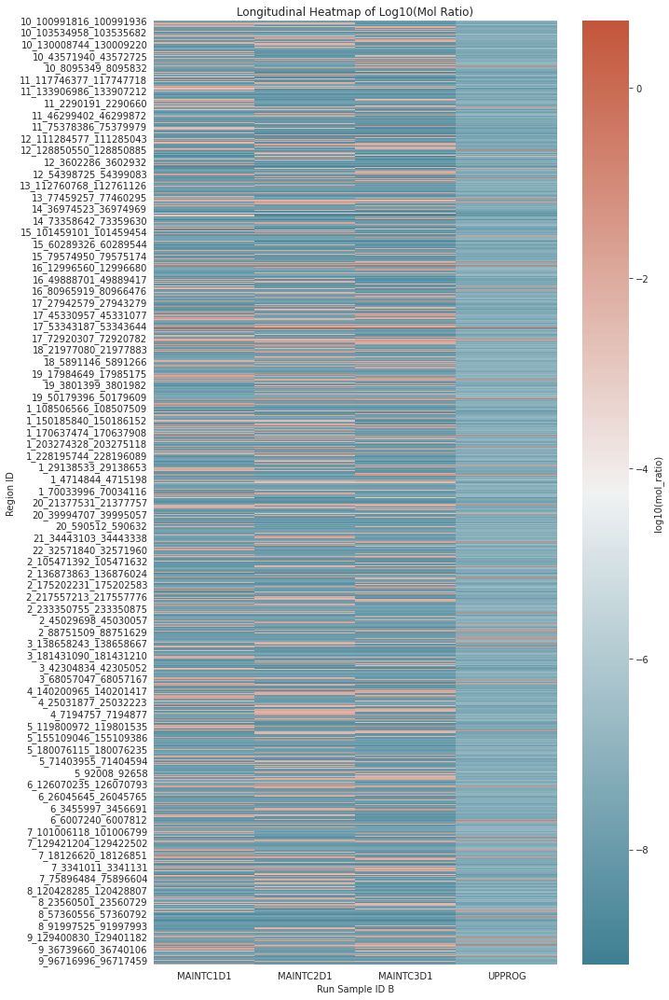

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_mrv2_dmr_1339 is your original dataframe

# Sort and pivot the dataframe as before
desired_order = ['B00484259', 'B00484253', 'B00484227', 'B00484244']
df_sorted = df_mrv2_dmr_1339[df_mrv2_dmr_1339['run_sample_id_B'].isin(desired_order)]

df_pivot = df_sorted.pivot(index='region_id', columns='run_sample_id_B', values='mol_ratio')
df_pivot = df_pivot.reindex(desired_order, axis=1)

# Replace 0 with NaN and apply log scale
df_pivot.replace(0, np.nan, inplace=True)
df_log_scale = np.log10(df_pivot)

# Define a custom colormap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Create the heatmap
plt.figure(figsize=(10, 15))
ax = sns.heatmap(df_log_scale, cmap=cmap, cbar_kws={'label': 'log10(mol_ratio)'})

# Change the x-axis labels
xticklabels = ['MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'UPPROG']
ax.set_xticklabels(xticklabels)

# Get the original Mol Ratio values for highlighting
original_values = df_mrv2_dmr_1339.set_index(['region_id', 'run_sample_id_B']).unstack('run_sample_id_B')['mol_ratio']
highlight = (original_values > 1).any(axis=1)


plt.title('Longitudinal Heatmap of Log10(Mol Ratio)')
plt.xlabel('Run Sample ID B')
plt.ylabel('Region ID')
plt.tight_layout()  # Adjust layout
plt.show()


In [89]:
df_pivot.head()

run_sample_id_B,B00484259,B00484253,B00484227,B00484244
region_id,,,,
10_100991816_100991936,3.623507e-08,3.442016e-08,3.116532e-08,1.893649e-07
10_100992581_100992928,7.208052e-09,6.847022e-09,6.199560e-03,3.766936e-08
10_100993508_100994820,2.433208e-09,2.311338e-03,2.092773e-03,1.271597e-08
10_101089032_101089152,7.840338e-09,7.447637e-09,6.743374e-09,4.097369e-08
10_101292266_101292737,7.705160e-09,7.319230e-09,6.627109e-09,4.026724e-08


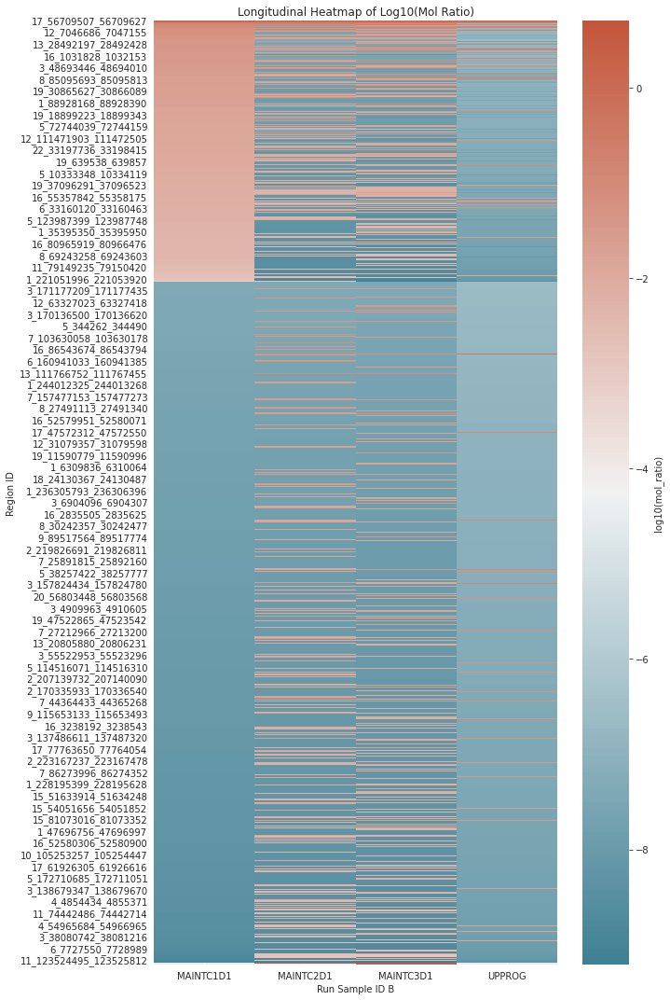

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_mrv2_dmr_1339 is already loaded and prepared

# Sort and pivot the dataframe as before
desired_order = ['B00484259', 'B00484253', 'B00484227', 'B00484244']
df_sorted = df_mrv2_dmr_1339[df_mrv2_dmr_1339['run_sample_id_B'].isin(desired_order)]
df_pivot = df_sorted.pivot(index='region_id', columns='run_sample_id_B', values='mol_ratio')
df_pivot = df_pivot.reindex(desired_order, axis=1)

# Replace 0 with NaN and apply log scale
df_pivot.replace(0, np.nan, inplace=True)
df_log_scale = np.log10(df_pivot)

# Sort the rows (regions) based on the 'MAINTC1D1' (the first column after reindexing)
df_log_scale_sorted = df_log_scale.sort_values(by=desired_order[0], ascending=False)

# Define a custom colormap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Create the heatmap with the sorted DataFrame
plt.figure(figsize=(10, 15))
ax = sns.heatmap(df_log_scale_sorted, cmap=cmap, cbar_kws={'label': 'log10(mol_ratio)'})

# Change the x-axis labels to the custom names
custom_labels = ['MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'UPPROG']
ax.set_xticklabels(custom_labels)

plt.title('Longitudinal Heatmap of Log10(Mol Ratio)')
plt.xlabel('Run Sample ID B')
plt.ylabel('Region ID')
plt.tight_layout()  # Adjust layout
plt.show()


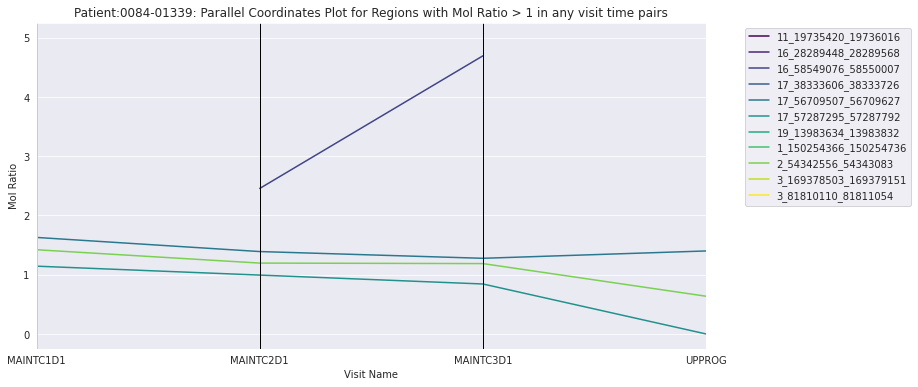

region_id    0
MAINTC1D1    7
MAINTC2D1    5
MAINTC3D1    4
UPPROG       6
dtype: int64


In [43]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates
import seaborn as sns

# Create a pivot table with 'region_id' as the index and the 'run_sample_id_B' as the columns
df_pivot = df_mrv2_dmr_1339.pivot(index='region_id', columns='run_sample_id_B', values='mol_ratio')

# Filter regions where 'Mol Ratio' > 1 in any of the desired columns
mask = (df_pivot[desired_order] > 1).any(axis=1)
df_filtered = df_pivot[mask]

# Ensure the columns are in the desired order
desired_order = ['B00484259', 'B00484253', 'B00484227', 'B00484244']
df_filtered = df_filtered[desired_order]

# Replace column names with the visit names
df_filtered.columns = ['MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'UPPROG']

# Reset index so that 'region_id' becomes a column again
df_filtered.reset_index(inplace=True)

# Create the parallel coordinates plot
plt.figure(figsize=(12, 6))
parallel_coordinates(df_filtered, 'region_id', colormap='viridis')

plt.title('Patient:0084-01339: Parallel Coordinates Plot for Regions with Mol Ratio > 1 in any visit time pairs')
plt.xlabel('Visit Name')
plt.ylabel('Mol Ratio')
plt.xticks(ticks=range(len(df_filtered.columns[1:])), labels=df_filtered.columns[1:])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
plt.grid(True)

plt.show()

# Check for NaNs in the filtered DataFrame
print(df_filtered.isna().sum())

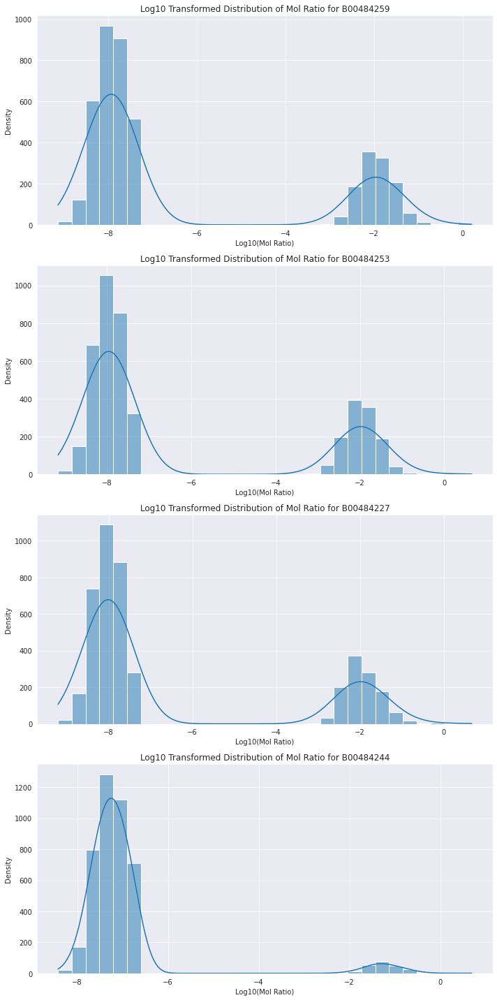

In [44]:


# Define the combinations of 'run_sample_id_B' you are interested in
sample_ids_B = ['B00484259', 'B00484253', 'B00484227', 'B00484244']

# Create a figure with subplots
fig, axes = plt.subplots(len(sample_ids_B), 1, figsize=(10, 20))

# Loop through the list of 'run_sample_id_B' and create a plot for each
for i, sample_id in enumerate(sample_ids_B):
    # Filter the dataframe for each 'run_sample_id_B' and remove non-positive values
    data = df_mrv2_dmr_1339[df_mrv2_dmr_1339['run_sample_id_B'] == sample_id]['mol_ratio']
    data = data[data > 0]  # Ensure there are no non-positive values before log transform
    
    # Apply log10 transformation
    data_log_transformed = np.log10(data)
    
    # Plot the distribution using seaborn's histplot
    sns.histplot(data_log_transformed, kde=True, bins=30, ax=axes[i])  # Use kde for smooth distribution curve
    
    # Set the title for each subplot
    axes[i].set_title(f'Log10 Transformed Distribution of Mol Ratio for {sample_id}')
    axes[i].set_xlabel('Log10(Mol Ratio)')
    axes[i].set_ylabel('Density')

# Adjust the layout so that titles and labels do not overlap
plt.tight_layout()

# Show the plots
plt.show()


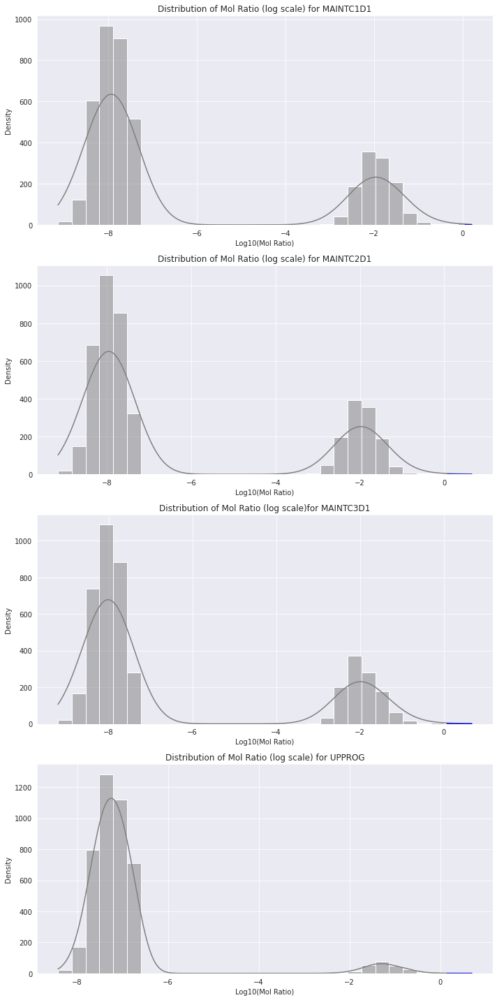

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the desired order and the corresponding titles for the plots
desired_order = ['B00484259', 'B00484253', 'B00484227', 'B00484244']
titles = ['Distribution of Mol Ratio (log scale) for MAINTC1D1',
          'Distribution of Mol Ratio (log scale) for MAINTC2D1',
          'Distribution of Mol Ratio (log scale)for MAINTC3D1',
          'Distribution of Mol Ratio (log scale) for UPPROG']

# Create a figure with subplots
fig, axes = plt.subplots(len(desired_order), 1, figsize=(10, 20))

# Loop through the list of 'run_sample_id_B' and create a plot for each
for i, sample_id in enumerate(desired_order):
    # Filter the dataframe for each 'run_sample_id_B' and remove non-positive values
    data = df_mrv2_dmr_1339[df_mrv2_dmr_1339['run_sample_id_B'] == sample_id]['mol_ratio']
    data = data[data > 0]  # Ensure there are no non-positive values before log transform
    
    # Apply log10 transformation
    data_log_transformed = np.log10(data)
    
    # Highlight the data where Log10(Mol Ratio) is greater than 0
    sns.histplot(data_log_transformed, kde=True, bins=30, ax=axes[i],
                 color='grey')  # Default color for all
    sns.histplot(data_log_transformed[data_log_transformed > 0], kde=True, bins=30, ax=axes[i],
                 color='blue')  # Color for values where Log10(Mol Ratio) > 0
    
    # Set the title for each subplot
    axes[i].set_title(titles[i])
    axes[i].set_xlabel('Log10(Mol Ratio)')
    axes[i].set_ylabel('Density')

# Adjust the layout so that titles and labels do not overlap
plt.tight_layout()

# Show the plots
plt.show()


# DMRs analysis

## Treatment-induced DMRs (selected by Andy based on Pfizer Crown outliers) on BMS SOW33 outliers

### Patient (0210-01563) paired samples (baseline: B00484272 and Treatment: B00484308)

In [11]:
# Readin files
df_patient_021091563_epiTFv2_all_base = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484272.epiTF_dmr_data.csv", header = 0) 
df_patient_021091563_epiTFv2_all_treat = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484308.epiTF_dmr_data.csv", header = 0) 

df_patient_021091563_prediction_base = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484272.epiTF_model_predictions.csv", header = 0) 
df_patient_021091563_prediction_treat = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484308.epiTF_model_predictions.csv", header = 0) 

df_treatmemt_DMRs_pfizer_crown = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/df_treatment_DMRs_pfizer_crown.csv", header = 0) 

df_treatmemt_DMRs_pfizer_crown.head()
# #Readin samples from MRD all col csv file of BMS_SOW33_Infinity_01 batch
# #Note that there are 237 samples in total and one sample failed enrichment therefore not sequenced B00484294. Need to manually add it back to the final report.

# df_BMS_MRD_all = pd.read_csv(f"{work_dir}/20230919_BMS_SOW33_Infinity_01_post_tb_tb_changed_all_cols_MRD.csv", header = 0) 

# print("Total sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_all.shape[0]) + "\n") 
# print("Total unique sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_all.GHSampleID.nunique()) + "\n")
# print("Total unique patient sample size of BMS_SOW33_Infinity_01 batch is " + str(df_BMS_MRD_all.Patient_ID.nunique()) + "\n")

# #drop duplicates 
# df_BMS_MRD_all_1 = df_BMS_MRD_all.drop_duplicates(subset=["GHSampleID"])
# print("Total sample size of BMS_SOW33_Infinity_01 batch after removing duplications is " + str(df_BMS_MRD_all_1.shape[0]) + "\n") 
# df_BMS_MRD_all_1.head()

,Treatment_DMRs
0,1_156612009_156612237
1,4_94755883_94756003
2,12_54424811_54424931
3,12_54440891_54441344
4,19_58220179_58220838


In [15]:
df_patient_021091563_epiTFv2_all_base.head()

,rank,region_id,molecule_count,norm_peak_count,inflation_multiplier,null_count,cpg_ctrl
0,1.0,8_97165566_97166211,7.0,0.009356,3.838941,0.776704,429.476644
1,2.0,1_214158801_214159134,8.0,0.009279,4.331531,0.807988,485.000906
2,3.0,2_71134461_71134937,7.0,0.008727,4.034902,0.746483,456.964831
3,4.0,11_10472056_10472744,7.0,0.008483,3.430445,0.852220,480.537326
4,5.0,19_58446370_58446701,6.0,0.007245,4.665243,0.539802,480.537326


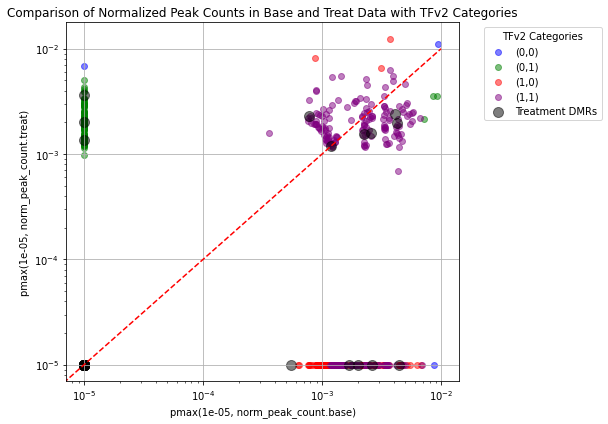

In [4]:

df_base = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484272.epiTF_dmr_data.csv", header=0)
df_treat = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484308.epiTF_dmr_data.csv", header=0)
df_treatment_DMRs = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/df_treatment_DMRs_pfizer_crown.csv", header=0)

# Correcting prediction data read-in
df_prediction_base = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484272.epiTF_model_predictions.csv", skiprows=1, header=None, names=['Variable', 'Value'])
df_prediction_treat = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/B00484308.epiTF_model_predictions.csv", skiprows=1, header=None, names=['Variable', 'Value'])

# Calculate pmax values
df_base['pmax_base'] = np.maximum(1e-05, df_base['norm_peak_count'])
df_treat['pmax_treat'] = np.maximum(1e-05, df_treat['norm_peak_count'])

# Reshape the prediction dataframes and convert to float
df_prediction_base.set_index('Variable', inplace=True)
df_prediction_treat.set_index('Variable', inplace=True)
df_prediction_base['Value'] = df_prediction_base['Value'].astype(float)
df_prediction_treat['Value'] = df_prediction_treat['Value'].astype(float)

# Extract values for tfv2_regions calculation
n_region3_pan_base = df_prediction_base.at['n_region3_pan', 'Value']
n_regions_tail_trim_base = df_prediction_base.at['n_regions_tail_trim', 'Value']
neat_ratio_base = df_prediction_base.at['neat_ratio_newfit3_pan', 'Value']

n_region3_pan_treat = df_prediction_treat.at['n_region3_pan', 'Value']
n_regions_tail_trim_treat = df_prediction_treat.at['n_regions_tail_trim', 'Value']
neat_ratio_treat = df_prediction_treat.at['neat_ratio_newfit3_pan', 'Value']

# Ensure that the rank is numeric
df_base['rank'] = pd.to_numeric(df_base['rank'], errors='coerce')
df_treat['rank'] = pd.to_numeric(df_treat['rank'], errors='coerce')

# Determine tfv2_regions
df_base['tfv2_regions'] = df_base['rank'].apply(lambda x: 1 if x >= n_regions_tail_trim_base and x <= n_region3_pan_base / neat_ratio_base + n_regions_tail_trim_base else 0)
df_treat['tfv2_regions'] = df_treat['rank'].apply(lambda x: 1 if x >= n_regions_tail_trim_treat and x <= n_region3_pan_treat / neat_ratio_treat + n_regions_tail_trim_treat else 0)

# Merge and create the category column
df_merged = pd.merge(df_base[['region_id', 'pmax_base', 'tfv2_regions']], df_treat[['region_id', 'pmax_treat', 'tfv2_regions']], on='region_id', suffixes=('_base', '_treat'))
df_merged['category'] = df_merged.apply(lambda row: f"({row['tfv2_regions_base']},{row['tfv2_regions_treat']})", axis=1)
df_merged['is_treatment'] = df_merged['region_id'].isin(df_treatment_DMRs['Treatment_DMRs'])

# Plotting
plt.figure(figsize=(10, 6))
categories = ['(0,0)', '(0,1)', '(1,0)', '(1,1)']
colors = ['blue', 'green', 'red', 'purple']  # Different color for each category

for category, color in zip(categories, colors):
    subset = df_merged[(df_merged['category'] == category) & (~df_merged['is_treatment'])]
    plt.scatter(subset['pmax_base'], subset['pmax_treat'], color=color, label=category, alpha=0.5)

# Highlight Treatment DMRs
subset = df_merged[df_merged['is_treatment']]
plt.scatter(subset['pmax_base'], subset['pmax_treat'], color='black', label='Treatment DMRs', alpha=0.5, s = 100)

# Adding a red dashed line for x=y
plt.plot([0, 0.01], [0, 0.01], 'r--')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('pmax(1e-05, norm_peak_count.base)')
plt.ylabel('pmax(1e-05, norm_peak_count.treat)')
plt.title('Comparison of Normalized Peak Counts in Base and Treat Data with TFv2 Categories')
plt.legend(title='TFv2 Categories', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.grid(True)
plt.tight_layout(rect=[0,0,0.85,1])  # Adjust plot area to fit legend outside
plt.show()


In [32]:
import pandas as pd

# Assuming df_treat and df_treatment_DMRs are already loaded and processed as in previous steps

# Filter df_treat for entries where 'tfv2_regions' is 1
tfv2_used_in_treat = df_treat[df_treat['tfv2_regions'] == 1]

# Get the set of region_ids from df_treatment_DMRs
treatment_dmrs_set = set(df_treatment_DMRs['Treatment_DMRs'])

# Find the intersection of region_ids in tfv2_used_in_treat and treatment_dmrs_set
overlapping_region_ids = tfv2_used_in_treat[tfv2_used_in_treat['region_id'].isin(treatment_dmrs_set)]['region_id'].tolist()

# Print or return the overlapping region_ids
len(overlapping_region_ids)


29

## ARM C Durva treatment is found to be potential liver toxicity and analysis

In [6]:
#This step need to be mannually checked!
df_BMS_MRD_all_5 = pd.read_csv(f"{work_dir}/df_BMS_MRD_all_5.csv", header = 0) 

#Found the column "Visit_name" has difference values compared to the e-manifest.csv file, so replace the original value in df_BMS_MRD_all_6 with the value in e-manifest.csv.
df_BMS_MRD_all_6 = df_BMS_MRD_all_5.copy()

#read in e-manifest.csv file
df_manifest = pd.read_csv(f"{work_dir}/emanifest_copy.csv", header = 0) 

# Step 1: Deduplicate df_manifest with corrected column names
unique_manifest = df_manifest.drop_duplicates(subset=['Customer Sample ID', 'Patient ID'], keep='first')
unique_manifest_renamed = unique_manifest.rename(columns={"Customer Sample ID": "Customer_SampleID", "Sample Time point": "Visit_name", "Patient ID": "Patient_ID"})

# Step 2: Perform the merge
merged_df = pd.merge(df_BMS_MRD_all_6, unique_manifest_renamed[['Customer_SampleID', 'Patient_ID', 'Visit_name']], on=['Customer_SampleID', 'Patient_ID'], how='left', suffixes=('', '_new'))

# Step 3: Replace 'Visit_name' with 'Visit_name_new', handling NaNs
merged_df['Visit_name'] = merged_df['Visit_name_new'].fillna(merged_df['Visit_name'])

# Step 4: Drop the '_new' column
merged_df.drop(columns=['Visit_name_new'], inplace=True)

# Resulting dataframe
df_BMS_MRD_all_6 = merged_df

#save the dataframe
df_BMS_MRD_all_6.to_csv(f"{work_dir}/df_BMS_MRD_all_6.csv", index=False)
df_BMS_MRD_all_6.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected,MB_Lung_v4_call,MB_Lung_v4_score,epiTF_TFv2beta
0,CA209-73L,AP948176G,A0820917,B00484176,0027-01736,NSCLC,NaN,CCRTC2D1,SUCCESS,NaN,Detected,0.002372,4.914,2.0,0,06/29/2023,10/17/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484176,0.006834,TP53,R267P,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577138.0,8.0,R267P,C>G,c.800G>C,NM_000546.6,0.006834,NaN,COSV52691512,rs587780075,462.0,B00484176,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""uncommon TP53 SNV"",""OVARIAN"":""uncommon TP53 SNV"",""HN"":""uncommon TP53 SNV"",""GASTRIC"":""uncommon TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""uncommon TP53 SNV"",""PROSTATE"":""uncommon TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484176,LUNG,2.128147,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.683371,Yes,Detected,Detected,Detected,-17.701394,0.000412
1,CA209-73L,LP044532B,A0820973,B00484236,0041-01812,NSCLC,NaN,CCRTC1D1,SUCCESS,NaN,Detected,0.008647,7.800,2.0,0,06/29/2023,11/23/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484236,0.010574,TP53,E286K,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577082.0,8.0,E286K,C>T,c.856G>A,NM_000546.6,0.010574,NaN,COSV52664318,rs786201059,1349.0,B00484236,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484236,LUNG,1.858175,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",1.057400,Yes,Detected,Detected,Detected,-10.723566,0.009095
2,CA209-73L,LP044549B,A0820974,B00484238,0041-01812,NSCLC,NaN,CCRTC3D1,SUCCESS,NaN,Not Detected,0.000000,7.800,2.0,0,06/29/2023,01/10/2023,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1

In [7]:
# Define ARM C
# Filter the dataframe for the specific condition in the 'Visit_name' column
filtered_df = df_BMS_MRD_all_5[df_BMS_MRD_all_5["Visit_name"] == "ARM C MAINT C1/8 D1"]

# Retrieve the list of 'GHSampleID' from the filtered dataframe
gh_sample_ids = filtered_df["GHSampleID"].tolist()

# Print or return the list of GHSampleID
gh_sample_ids
# Create the new column 'treatment_armC' based on whether 'GHSampleID' is in the list gh_sample_ids
df_BMS_MRD_all_6['treatment_armC'] = df_BMS_MRD_all_6['GHSampleID'].isin(gh_sample_ids)

# Filtering the dataframe to show only rows where 'treatment_armC' is True
df_BMS_MRD_all_6.treatment_armC.value_counts()

df_BMS_MRD_all_7 = df_BMS_MRD_all_6.copy()
# Define "on-treatment" visit names
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ["MAINTC1D1", "MAINTC3D1", "MAINTC2D1", "CCRTC3D1", "MAINTC8D1"]

# Categorize samples based on specified conditions
def categorize_row_new(row):
    if row['treatment_armC'] is True:
        return "ARM C"
    elif row['Visit_name'] in on_treatment_visits:
        return "other treatment ARMs"
    elif row['Visit_name'] in baseline_visits:
        return "Baseline"
    else:
        return "Progression"

df_BMS_MRD_all_7['Category'] = df_BMS_MRD_all_7.apply(categorize_row_new, axis=1)
df_BMS_MRD_all_7.Category.value_counts()

other treatment ARMs    142
Baseline                 58
ARM C                    22
Progression              14
Name: Category, dtype: int64

File not found: /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/On_treatment_effect_on_methylation_03172024/TFv2_BMS_SOW33_beta_with_plot_ouput/B00484293.epiTF_dmr_data.csv


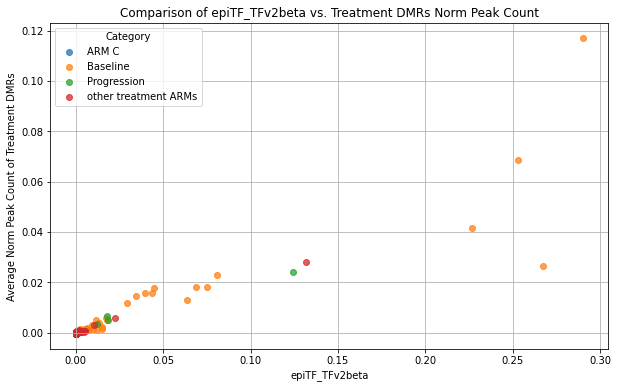

In [8]:
# Load treatment DMRs
df_treatment_DMRs = pd.read_csv(f"{work_dir}/pfizer_crown_treatment_DMRs/df_treatment_DMRs_pfizer_crown.csv", header=0)


# Prepare a container for the average norm_peak_count of treatment DMRs for each sample
averages = []

for sample_id in df_BMS_MRD_all_7['GHSampleID']:
    file_path = f"{work_dir}/TFv2_BMS_SOW33_beta_with_plot_ouput/{sample_id}.epiTF_dmr_data.csv"
    # Check if the file exists before trying to read it
    if os.path.exists(file_path):
        try:
            # Load each sample's DMR data
            df_sample = pd.read_csv(file_path, header=0)
            # print(sample_id)
            # Mark the treatment DMRs
            df_sample['is_treatment'] = df_sample['region_id'].isin(df_treatment_DMRs['Treatment_DMRs'])
            # Calculate the average norm_peak_count for treatment DMRs
            average_norm_peak = df_sample[df_sample['is_treatment']]['norm_peak_count'].mean()
            # print(average_norm_peak)
            averages.append(average_norm_peak)
        except Exception as e:
            print(f"Error processing file {file_path}: {e}")
            averages.append(None)  # Append None or a default value if there's an error
    else:
        print(f"File not found: {file_path}")
        averages.append(None)  # Append None for missing files

# Add this data to df_BMS_MRD_all_7
df_BMS_MRD_all_7['average_norm_peak_count'] = averages

# Plotting
plt.figure(figsize=(10, 6))
for category, group in df_BMS_MRD_all_7.groupby('Category'):
    plt.scatter(group['epiTF_TFv2beta'], group['average_norm_peak_count'], label=category, alpha=0.75)

# # Adding a red dashed line for x=y
# plt.plot([-0.0005, 0.00252], [-0.0005, 0.00252], 'r--')

plt.xlabel('epiTF_TFv2beta')
plt.ylabel('Average Norm Peak Count of Treatment DMRs')
plt.title('Comparison of epiTF_TFv2beta vs. Treatment DMRs Norm Peak Count')
plt.legend(title='Category')
plt.grid(True)
plt.show()


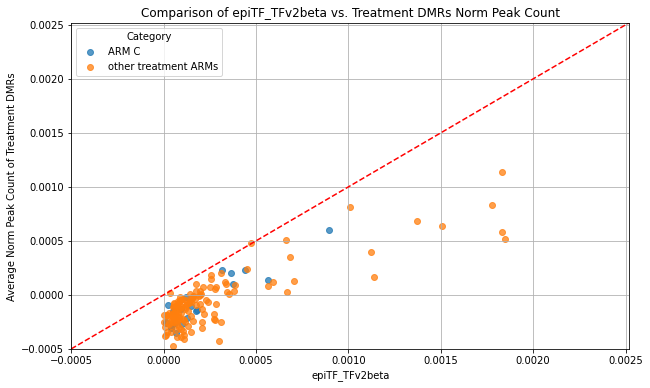

In [9]:
df_BMS_MRD_all_8 = df_BMS_MRD_all_7[(df_BMS_MRD_all_7["Category"] == "ARM C") | (df_BMS_MRD_all_7["Category"] == "other treatment ARMs")]
# Plotting
plt.figure(figsize=(10, 6))
for category, group in df_BMS_MRD_all_8.groupby('Category'):
    plt.scatter(group['epiTF_TFv2beta'], group['average_norm_peak_count'], label=category, alpha=0.75)

plt.xlabel('epiTF_TFv2beta')
plt.ylim(-0.0005, 0.00252)
plt.xlim(-0.0005, 0.00252)

# Adding a red dashed line for x=y
plt.plot([-0.0005, 0.00252], [-0.0005, 0.00252], 'r--')

plt.ylabel('Average Norm Peak Count of Treatment DMRs')
plt.title('Comparison of epiTF_TFv2beta vs. Treatment DMRs Norm Peak Count')
plt.legend(title='Category')
plt.grid(True)
plt.show()

### Generate Treatment-signature of ARMC and other treatment arms

In [12]:
# Perform independent t-test of each of 1253 TFv2 DMR between (baseline samples and ARM C samples) and (baseline samples and ARM C samples)
# DMR with signficant p-value will be treatment DMRs
# The treament signature arg (norm_peak_count) of significantly increased DMRs /arg (norm_peak_count) of significantly decreased DMRs
# Significant changed DMRs were identified by paired baseline and corresponding treatment arm samples.


# Define the working directory and initialize lists to store results
baseline_data = []
other_arms_data = []

# Load all samples
for sample_id in df_BMS_MRD_all_7['GHSampleID']:
    file_path = f"{work_dir}/TFv2_BMS_SOW33_beta_with_plot_ouput/{sample_id}.epiTF_dmr_data.csv"
    if os.path.exists(file_path):
        try:
            df_sample = pd.read_csv(file_path)
            category = df_BMS_MRD_all_7.loc[df_BMS_MRD_all_7['GHSampleID'] == sample_id, 'Category'].iloc[0]
            if category == 'Baseline':
                baseline_data.append(df_sample[['region_id', 'norm_peak_count']])
            elif category == 'other treatment ARMs':
                other_arms_data.append(df_sample[['region_id', 'norm_peak_count']])
        except Exception as e:
            print(f"Error processing file {file_path}: {e}")
    else:
        print(f"File not found: {file_path}")

# Combine all baseline and other treatment arms data into single dataframes
df_baseline = pd.concat(baseline_data).groupby('region_id').agg(list).reset_index()
df_other_arms = pd.concat(other_arms_data).groupby('region_id').agg(list).reset_index()

# Perform t-tests and collect results
dmr_results = {'region_id': [], 'p_value': [], 'avg_increase': [], 'avg_decrease': []}
for region in df_baseline['region_id'].unique():
    baseline_counts = df_baseline[df_baseline['region_id'] == region]['norm_peak_count'].iloc[0]
    other_arms_counts = df_other_arms[df_other_arms['region_id'] == region]['norm_peak_count'].iloc[0]

    # Ensure both groups have data to test
    if len(baseline_counts) > 0 and len(other_arms_counts) > 0:
        t_stat, p_value = stats.ttest_ind(baseline_counts, other_arms_counts, equal_var=False)  # Welch's t-test
        dmr_results['region_id'].append(region)
        dmr_results['p_value'].append(p_value)
        if np.mean(other_arms_counts) > np.mean(baseline_counts):
            dmr_results['avg_increase'].append(np.mean(other_arms_counts))
            dmr_results['avg_decrease'].append(np.mean(baseline_counts))
        else:
            dmr_results['avg_increase'].append(np.mean(baseline_counts))
            dmr_results['avg_decrease'].append(np.mean(other_arms_counts))

df_dmr_results = pd.DataFrame(dmr_results)

# Filtering df_dmr_results for significant DMRs
significant_dmrs = df_dmr_results[df_dmr_results['p_value'] < 0.01]

# Iterate over each "other treatment ARMs" sample, find its corresponding baseline, and compute y-values
y_values = []

for _, row in df_BMS_MRD_all_7[df_BMS_MRD_all_7['Category'] == 'other treatment ARMs'].iterrows():
    patient_id = row['Patient_ID']
    sample_id = row['GHSampleID']
    baseline_row = df_BMS_MRD_all_7[(df_BMS_MRD_all_7['Patient_ID'] == patient_id) & (df_BMS_MRD_all_7['Category'] == 'Baseline')]

    if not baseline_row.empty:
        baseline_sample_id = baseline_row.iloc[0]['GHSampleID']
        # Load DMR data for "other treatment ARMs" and baseline samples
        treatment_file_path = f"{work_dir}/TFv2_BMS_SOW33_beta_with_plot_ouput/{sample_id}.epiTF_dmr_data.csv"
        baseline_file_path = f"{work_dir}/TFv2_BMS_SOW33_beta_with_plot_ouput/{baseline_sample_id}.epiTF_dmr_data.csv"

        if os.path.exists(treatment_file_path) and os.path.exists(baseline_file_path):
            df_treatment = pd.read_csv(treatment_file_path)
            df_baseline = pd.read_csv(baseline_file_path)

            # Merge significant DMRs with "other treatment ARMs" and baseline data
            merged_data = pd.merge(significant_dmrs, df_treatment[['region_id', 'norm_peak_count']], on='region_id')
            merged_data = pd.merge(merged_data, df_baseline[['region_id', 'norm_peak_count']], on='region_id', suffixes=('_treatment', '_baseline'))

            # Calculate increased and decreased masks
            increased_mask = merged_data['norm_peak_count_treatment'] > merged_data['norm_peak_count_baseline']
            decreased_mask = merged_data['norm_peak_count_treatment'] < merged_data['norm_peak_count_baseline']

            # Compute average increases and decreases
            if increased_mask.any() and decreased_mask.any():
                avg_increase = merged_data.loc[increased_mask, 'norm_peak_count_treatment'].mean()
                avg_decrease = merged_data.loc[decreased_mask, 'norm_peak_count_baseline'].mean()

                # Calculate the y-value
                y_value = avg_increase / avg_decrease if avg_decrease > 0 else float('inf')
                y_values.append((sample_id, y_value))
        else:
            print(f"File not found for one of the samples: {sample_id} or {baseline_sample_id}")

# Output or save the y-values
for sample_id, y in y_values:
    print(f"Sample ID: {sample_id}, Y-value: {y}")


File not found: /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/On_treatment_effect_on_methylation_03172024/TFv2_BMS_SOW33_beta_with_plot_ouput/B00484293.epiTF_dmr_data.csv
File not found for one of the samples: B00484293 or B00484330
Sample ID: B00484238, Y-value: 0.0001848695010463938
Sample ID: B00484232, Y-value: 0.05905800286185882
Sample ID: B00484201, Y-value: -0.2010689919622152
Sample ID: B00484202, Y-value: -0.015813052220093247
Sample ID: B00484200, Y-value: -0.11828438901324716
Sample ID: B00484189, Y-value: 0.18637385293606645
Sample ID: B00484234, Y-value: -0.004640567029143866
Sample ID: B00484213, Y-value: -0.09778480420186715
Sample ID: B00484179, Y-value: 0.014276758141049652
Sample ID: B00484215, Y-value: 0.07953148236471409
Sample ID: B00484208, Y-value: 0.2533749047550969
Sample ID: B00484263, Y-value: -0.004056608670641821
Sample ID: B00484260, Y-value: -0.0024228624036260033
Sample ID: B00484209, Y-value: 0.8344363469787328
Sample ID: B00484241, Y-

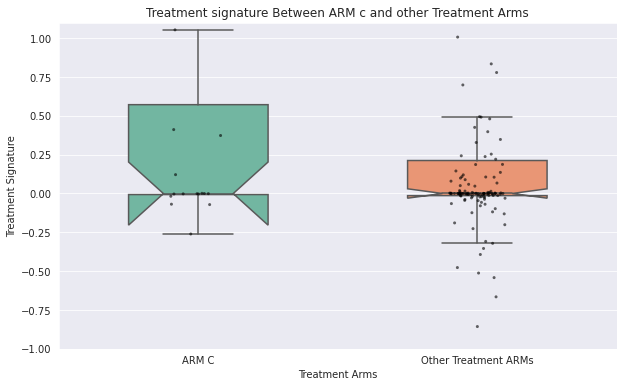

In [16]:
# Plot the result

# Set the style of the visualization
sns.set_style("darkgrid")

# Prepare the data for plotting
y_values_combined = [y_values_armC_only, y_values_other_arms_only]
labels = ['ARM C', 'Other Treatment ARMs']

# Create a larger figure to plot
plt.figure(figsize=(10, 6))

# Generate the box plot
ax = sns.boxplot(data=y_values_combined, notch=True, showfliers=False, showmeans=True, 
                 meanline=True, width=0.5, palette="Set2")
# Add stripplot to show the points on top of the box plot
sns.stripplot(data=y_values_combined, color='black', size=3, jitter=True, alpha=0.6)

# Set the labels and titles
ax.set_xticklabels(labels)
ax.set_title('Treatment signature Between ARM c and other Treatment Arms')
ax.set_ylabel('Treatment Signature')
ax.set_xlabel('Treatment Arms')

# Set the y-axis to log scale
# ax.set_yscale('log')
ax.set_ylim(-1, 1.1)

# Show the plot
plt.show()


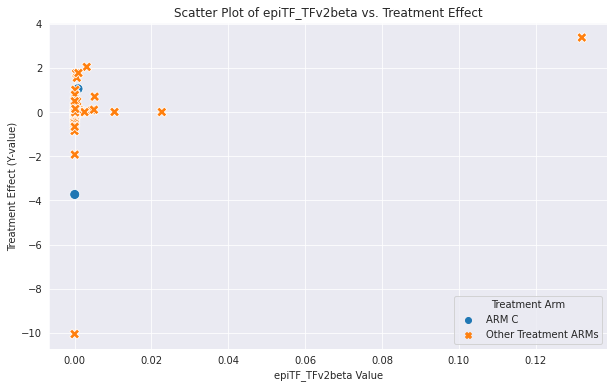

In [88]:

# Extract epiTF_TFv2beta values and create a DataFrame for visualization
# y_values_armC and y_values should be list of tuples (sample_id, y_value)
df_armC = pd.DataFrame(y_values_armC, columns=['GHSampleID', 'y_value'])
df_other_arms = pd.DataFrame(y_values, columns=['GHSampleID', 'y_value'])

# Add treatment arm information
df_armC['Treatment'] = 'ARM C'
df_other_arms['Treatment'] = 'Other Treatment ARMs'

# Combine the data
df_combined = pd.concat([df_armC, df_other_arms], ignore_index=True)

# Merge with the main DataFrame to get the epiTF_TFv2beta values
df_combined = df_combined.merge(df_BMS_MRD_all_7[['GHSampleID', 'epiTF_TFv2beta']], on='GHSampleID', how='left')

# Generate the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_combined, x='epiTF_TFv2beta', y='y_value', hue='Treatment', style='Treatment', s=100)
plt.title('Scatter Plot of epiTF_TFv2beta vs. Treatment Effect')
plt.xlabel('epiTF_TFv2beta Value')
plt.ylabel('Treatment Effect (Y-value)')
plt.grid(True)
plt.legend(title='Treatment Arm')
plt.show()


# Treatment Induced DMR identification based on BMS SOW33 with my own method and (Annotation of all regions are useful)

## Annotate all 24865 DMRs in LR caller (epiTFv2 started with these regions before counting/normalization/aggregation)

In [20]:
# Read in the annotation file of MB caller DMR from screening team
df_DMR_annotation_v6 = pd.read_table(f"/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/v05_classification_space.tsv")
df_DMR_annotation_v6.head()

# Read in the annotation file of epiTFv2 pre-defined DMR set from Jun Zhao
df_DMR_annotation_pre_defined_set_epiTFv2 = pd.read_table(f"/ghdevhome/home/agross/code/epiTFv2/methylation_classification/config/new_DMRs.regions.tsv") 
df_DMR_annotation_pre_defined_set_epiTFv2.head()

# Read in the BMS data
df_BMS_MRD_all_6 = pd.read_csv(f"{work_dir}/df_BMS_MRD_all_6.csv", header=0)

In [21]:
# Adding the new column "annotation" based on MB caller annotation
df_DMR_annotation_v6_1 = df_DMR_annotation_v6.copy()

df_DMR_annotation_v6_1["region_id_combined"] = df_DMR_annotation_v6_1["chrom"].astype(str) + "_" + df_DMR_annotation_v6_1["start"].astype(str) + "_" + df_DMR_annotation_v6_1["end"].astype(str)
df_DMR_annotation_v6_1['annotation'] = df_DMR_annotation_v6_1['merged_region_type'].apply(lambda x: 'MB_caller_CONTROL_DMR' if 'CONTROL' in x else 'MB_caller_DMR')

# MB v6 DMR summary
print("Total size of MB DMR in v6 panel is " + str(df_DMR_annotation_v6_1.region_id_combined.unique().size) + "\n") 

df_DMR_annotation_v6_ctrl = df_DMR_annotation_v6_1[df_DMR_annotation_v6_1['annotation'].str.contains('CONTROL')]
print("Total size of the control regions in MB DMR in v6 panel is " + str(df_DMR_annotation_v6_ctrl.region_id_combined.unique().size) + "\n") 

# Adding the new column "annotation" based on epiTFv2 pre-defined DMR set
df_DMR_annotation_pre_defined_set_epiTFv2_1 = df_DMR_annotation_pre_defined_set_epiTFv2.copy()
df_DMR_annotation_pre_defined_set_epiTFv2_1["annotation"] = "epiTFv2_pre_defined_DMR"
print("Total size of pre-defined DMR for epiTFv2 is " + str(df_DMR_annotation_pre_defined_set_epiTFv2_1.v6_regions.unique().size)) 


Total size of MB DMR in v6 panel is 2715

Total size of the control regions in MB DMR in v6 panel is 560

Total size of pre-defined DMR for epiTFv2 is 1318


In [43]:
df_DMR_annotation_v6_ctrl.merged_region_type.value_counts()

V5_HYPO_CONTROL                 431
HYPO_CONTROL                     72
HYPER_CONTROL                    51
V5_HYPO_CONTROL,V5_TFBS           3
HYPO_CONTROL,V6_CTCF_CONST        1
HYPO_CONTROL,V5_HYPO_CONTROL      1
HYPO_CONTROL,V5_TFBS              1
Name: merged_region_type, dtype: int64

In [50]:
# NO NEED TO RUN THIS CELL AGAIN!

# Add the addnotation to the epiTFv2 output file "{sample_id}.msre_region_stats.tsv" based on MB caller DMR annotation, epiTFv2 pre-defined set annotation, and LR caller DMR annotation.
df_BMS_MRD_all_7 = df_BMS_MRD_all_6.copy()
epiTFv2_out_path = f"{work_dir}/TFv2beta_BMS_SOW33_04082024_ouput"

# Create dictionaries for fast lookup
annotation_dict_v6_1 = pd.Series(df_DMR_annotation_v6_1.annotation.values, index=df_DMR_annotation_v6_1.region_id_combined).to_dict()
annotation_dict_pre_defined = pd.Series(df_DMR_annotation_pre_defined_set_epiTFv2_1.annotation.values, index=df_DMR_annotation_pre_defined_set_epiTFv2_1.v6_regions).to_dict()

def assign_annotation(row, annotation_dict_v6_1, annotation_dict_pre_defined):
    region_id = row['region_id']
    if region_id in annotation_dict_v6_1:
        return annotation_dict_v6_1[region_id]
    elif region_id in annotation_dict_pre_defined:
        return annotation_dict_pre_defined[region_id]
    else:
        return 'LR_caller_DMR'

for index, row in df_BMS_MRD_all_7.iterrows():
    sample_id = row['run_sample_id']
    file_path = f"{epiTFv2_out_path}/{sample_id}.msre_region_stats.tsv"
    
    try:
        df_temp = pd.read_csv(file_path, sep='\t', index_col=0)
        df_temp['annotation'] = df_temp.apply(assign_annotation, axis=1, args=(annotation_dict_v6_1, annotation_dict_pre_defined))
        # Save the modified DataFrame
        df_temp.to_csv(f"{epiTFv2_out_path}/{sample_id}.msre_region_stats_annotated.csv", index=False)

    except Exception as e:
        print(f"An error occurred with {sample_id}: {str(e)}")
        continue 


An error occurred with nan: [Errno 2] No such file or directory: '/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/On_treatment_effect_on_methylation_03172024/TFv2beta_BMS_SOW33_04082024_ouput/nan.msre_region_stats.tsv'


## Visualize individual patient longitudinal heatmap

In [13]:
# Select specific patient for longitudinal DMR signal plot (epiTFv2 DMRs only)
df_BMS_MRD_all_7 = df_BMS_MRD_all_6.copy()

# Choose patient "0171-01551" as an example
df_patient_1339 = df_BMS_MRD_all_7[df_BMS_MRD_all_7['Patient_ID'] == '0198-01406']
df_patient_1339.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected,MB_Lung_v4_call,MB_Lung_v4_score,epiTF_TFv2beta
83,CA209-73L,SP092670D,A0820987,B00484216,0198-01406,NSCLC,NaN,CCRTC2D1,SUCCESS,NaN,Detected,0.002002,7.1240,2.0,0,08/03/2023,04/12/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A02056_0034_BHCCK7DSX7_PS3C134_AP3.Sirius-1.1.1-RLS,230909_A02056_0034_BHCCK7DSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484216,0.005736,KRAS,A11A,"{""LUNG"":""common clonal SNV"",""BREAST"":""uncommon SNV"",""BLADDER"":""uncommon SNV"",""CRC"":""uncommon SNV"",""OVARIAN"":""uncommon SNV"",""HN"":""uncommon SNV"",""GASTRIC"":""uncommon SNV"",""LIVER"":""uncommon SNV"",""MELANOMA"":""uncommon SNV"",""PANCREATIC"":""uncommon SNV"",""PROSTATE"":""uncommon SNV"",""RCC"":""uncommon SNV""}",1,SNV,NaN,MET,7.0,116412043.0,14.0,NaN,G>A,c.3028G>A,NM_000245.4,0.003880,splice_region_variant,COSV59259218,NaN,1085.0,B00484216,"{""LUNG"":""common clonal SNV"",""BREAST"":""uncommon SNV"",""BLADDER"":""uncommon SNV"",""CRC"":""not CRC driver gene"",""OVARIAN"":""uncommon SNV"",""HN"":""uncommon SNV"",""GASTRIC"":""uncommon SNV"",""LIVER"":""uncommon SNV"",""MELANOMA"":""uncommon SNV"",""PANCREATIC"":""uncommon SNV"",""PROSTATE"":""uncommon SNV"",""RCC"":""uncommon SNV""}",B00484216,LUNG,6.830996,5.73,1.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.387973,Yes,Detected,Detected,Detected,-8.471015,0.003541
84,CA209-73L,SP092674D,A0820988,B00484211,0198-01406,NSCLC,NaN,CCRTC3D1,SUCCESS,NaN,Not Detected,0.000000,14.6120,2.0,0,08/03/2023,05/06/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A02056_0034_BHCCK7DSX7_PS3C134_AP3.Sirius-1.1.1-RLS,230909_A02056_0034_BHCCK7DSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484211,0.004400,MET,NaN,"{""LUNG"":""common clonal SNV"",""BREAST"":""uncommon SNV"",""BLADDER"":""uncommon SNV"",""CRC"":""not CRC driver gene"",""OVARIAN"":""uncommon SNV"",""HN"":""uncommon SNV"",""GASTRIC"":""uncommon SNV"",""LIVER"":""uncommon SNV"",""MELANOMA"":""uncommon SNV"",""PANCREATIC"":""uncommon SNV"",""PROSTATE"":""uncommon SNV"",""RCC"":""uncommon SNV""}",1,SNV,NaN,MET,7.0,116412043.0,14.0,NaN,G>A,c.3028G>A,NM_000245.4,0.004400,splice_region_variant,COSV59259218,NaN,1666.0,B00484211,"{""LUNG"":""common clonal SNV"",""BREAST"":""uncommon SNV"",""BLADDER"":""uncommon SNV"",""CRC"":""not CRC driver gene"",""OVARIAN"":""uncommon SNV"",""HN"":""uncommon SNV"",""GASTRIC"":""uncommon SNV"",""LIVER"":""uncommon SNV"",""MELANOMA"":""uncommon SNV"",""PANCREATIC"":""uncommon SNV"",""PROSTATE"":""uncommon SNV"",""RCC"":""uncommon SNV""}",B00484211,LUNG,3.114335,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",0.439975,No,Not Detected,Not Detected,Not Detected,-21.794633,0.000056
85,CA209-73L,SP216878D,A0821048,B00484193,0198-01406,NSCLC,NaN,MAINTC2D1,SUCCESS,NaN,Not Detected,0.000000,4.0768,2.0,0,08/03/2023,09/20/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A02056_0034_BHCCK7DSX7_PS3C134_AP3.Sirius-1.1.1-RLS,230909_A02056_0034_BHCCK7DSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,NaN,0.000000,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B00484193,LUNG,0.938573,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 0}",NaN

In [15]:
# Choose patient "0171-01551" as an example
df_patient_1339 = df_BMS_MRD_all_7[df_BMS_MRD_all_7['Patient_ID'] == '0041-01812']
df_patient_1339

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Cancertype,Tumor_stage,Visit_name,Sample_status,Sample_comment,Tumor_methylation_status,Tumor_methylation_score,cfDNA_ng_yield,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,fc_dir,runid,new_Cancertype,Cancer_Type_in_Cohort,Cancer_Type_Standardized,new_Cancer_Type_in_Cohort,new_Cancer_Type_Standardized,sample_id_x,max_maf,max_maf_gene,max_maf_mut_aa,max_maf_tvf_comment_multitumor,tvf_call,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,maf,Splice_effect,COSMIC,dbSNP,Mol_count,sample_id_y,tvf_comment_multitumor,run_sample_id,tumor_type,genomic_risk_score,grs_threshold,grs_call,bi_details,Percentage,Somatic_variant_reportable,Tumor_genomic_status,ctDNA_detected,MB_Lung_v4_call,MB_Lung_v4_score,epiTF_TFv2beta
1,CA209-73L,LP044532B,A0820973,B00484236,0041-01812,NSCLC,NaN,CCRTC1D1,SUCCESS,NaN,Detected,0.008647,7.800,2.0,0,06/29/2023,11/23/2022,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484236,0.010574,TP53,E286K,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",1,SNV,NaN,TP53,17.0,7577082.0,8.0,E286K,C>T,c.856G>A,NM_000546.6,0.010574,NaN,COSV52664318,rs786201059,1349.0,B00484236,"{""LUNG"":""common clonal TP53 SNV"",""BREAST"":""uncommon TP53 SNV"",""BLADDER"":""uncommon TP53 SNV"",""CRC"":""common subclonal TP53 SNV"",""OVARIAN"":""common clonal TP53 SNV"",""HN"":""common clonal TP53 SNV"",""GASTRIC"":""common clonal TP53 SNV"",""LIVER"":""uncommon TP53 SNV"",""MELANOMA"":""uncommon TP53 SNV"",""PANCREATIC"":""common clonal TP53 SNV"",""PROSTATE"":""common clonal TP53 SNV"",""RCC"":""uncommon TP53 SNV""}",B00484236,LUNG,1.858175,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 1}",1.05740,Yes,Detected,Detected,Detected,-10.723566,0.009095
2,CA209-73L,LP044549B,A0820974,B00484238,0041-01812,NSCLC,NaN,CCRTC3D1,SUCCESS,NaN,Not Detected,0.000000,7.800,2.0,0,06/29/2023,01/10/2023,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,NaN,0.000000,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B00484238,LUNG,1.967983,5.73,0.0,"{""grs_super_whitelist"": 0, ""tvf_call"": 0}",NaN,No,Not Detected,Not Detected,Not Detected,-20.855409,0.000276
3,CA209-73L,LP044579B,A0820975,B00484232,0041-01812,NSCLC,NaN,MAINTC1D1,SUCCESS,NaN,Detected,0.002139,13.572,2.0,0,06/29/2023,02/24/2023,09/19/2023,/ghess/pharma/to_move/Sirius_REPORTING/fc_dir_softlink/230909_A01835_0122_BHC7VLDSX7_PS3C134_AP1.Sirius-1.1.1-RLS,230909_A01835_0122_BHC7VLDSX7,NSCLC,NSCLC,LUNG,NSCLC,LUNG,B00484232,0.014882,ATM,R3008C,"{""LUNG"":""common clonal SNV"",""BREAST"":""common subclonal SNV"",""BLADDER"":""uncommon SNV"",""CRC"":""not CRC driver gene"",""OVARIAN"":""common clonal SNV"",""HN"":""common clonal SNV"",""GASTRIC"":""common subclonal SNV"",""LIVER"":""common subclonal SNV"",""MELANOMA"":""uncommon SNV"",""PANCREATIC"":""common subclonal SNV"",""PROSTATE"":""common subclonal SNV"",""RCC"":""common clonal SNV""}",1,SNV,NaN,ATM,11.0,108236086.0,63.0,R3008C,C>T,c.9022C>T,NM_000051.4,0.014882,NaN,COSV53730980,rs587782292,2470.0,B00484232,"{""LUNG"":""common clonal SNV"",""BREAST"":""common subclonal SNV"",""BLADDER"":""uncommon SNV"",""CRC"":""not CRC driver gene"",""OVARIAN"":""common clonal SNV"",""HN"":""common clonal SNV"",""GASTRIC"":""common subclonal SNV

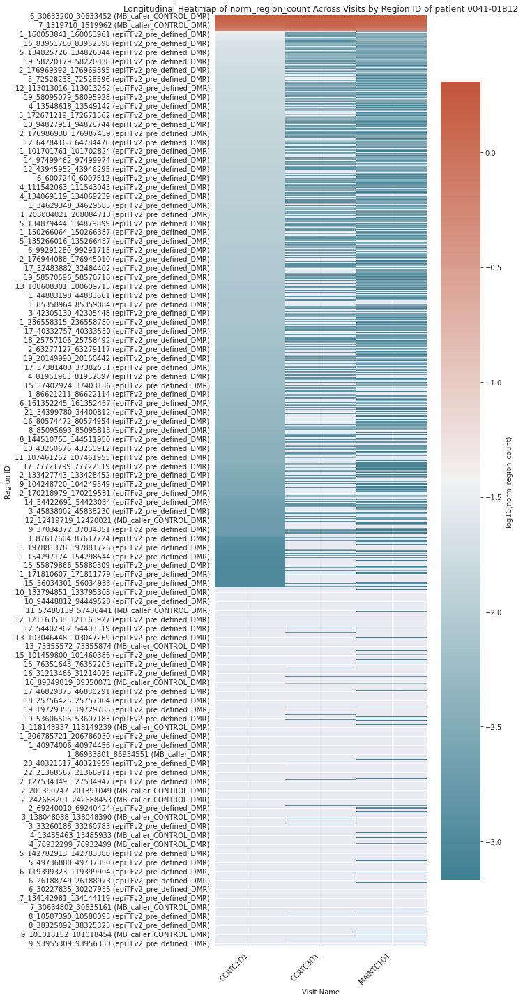

In [17]:
df_patient_1339 = df_BMS_MRD_all_7[df_BMS_MRD_all_7['Patient_ID'] == '0041-01812']
# heatmap plot for the longitudinal DMR signal (epiTFv2 DMR only)

# Assuming df_patient_1339 is defined and contains 'run_sample_id' and 'Visit_name'
epiTFv2_out_path = f"{work_dir}/TFv2beta_BMS_SOW33_04082024_ouput"

# Map sample_id to Visit_name
visit_name_mapping = df_patient_1339.set_index('run_sample_id')['Visit_name'].to_dict()

# Initialize an empty DataFrame for consolidated data
df_consolidated = pd.DataFrame()

# Desired order of Visit_names, ensuring it matches the Visit_name column after mapping
desired_order_visit_names = ['CCRTC1D1', 'CCRTC3D1', 'MAINTC1D1']

# Iterate over each sample_id to load its corresponding file
for sample_id, visit_name in visit_name_mapping.items():
    file_path = f"{epiTFv2_out_path}/{sample_id}.msre_region_stats_annotated.csv"
    try:
        # Load the data file
        df_temp = pd.read_csv(file_path)

        # Only filter for non-LR_caller_DMR annotations
        df_temp = df_temp[df_temp["annotation"] != "LR_caller_DMR"]

        # Add 'sample_id' and 'Visit_name' to the DataFrame
        df_temp['sample_id'] = sample_id
        df_temp['Visit_name'] = visit_name
        # Append to the consolidated DataFrame
        df_consolidated = pd.concat([df_consolidated, df_temp], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {sample_id}: {file_path}")
        continue


# Create a new index by combining 'region_id' and 'annotation'
df_consolidated['region_annotation'] = df_consolidated['region_id'] + " (" + df_consolidated['annotation'] + ")"

# Pivot the DataFrame to have 'region_annotation' as rows, 'Visit_name' as columns, and 'norm_region_count' as values
df_pivot = df_consolidated.pivot(index='region_annotation', columns='Visit_name', values='norm_region_count')

# # Pivot the DataFrame to have 'region_id' as rows, 'Visit_name' as columns, and 'norm_region_count' as values
# df_pivot = df_consolidated.pivot(index='region_id', columns='Visit_name', values='norm_region_count')

# Ensure columns are in the desired order, filling missing with 0
df_pivot = df_pivot.reindex(columns=desired_order_visit_names, fill_value=0)

# Replace 0 with NaN and apply log scale
df_pivot.replace(0, np.nan, inplace=True)
df_log_scale = np.log10(df_pivot)

# Sort the rows (regions) based on the 'CCRTC1D1'
df_log_scale_sorted = df_log_scale.sort_values(by=desired_order_visit_names[0], ascending=False)

# Plotting the heatmap
plt.figure(figsize=(10, 20))  # Adjust the figure size as needed
cmap = sns.diverging_palette(220, 20, as_cmap=True)

ax = sns.heatmap(df_log_scale_sorted, cmap=cmap, cbar_kws={'label': 'log10(norm_region_count)'})

# Make sure to use desired_order_visit_names since it matches the columns in df_pivot
ax.set_xticklabels(desired_order_visit_names, rotation=45, ha="right")

plt.title('Longitudinal Heatmap of norm_region_count Across Visits by Region ID of patient 0041-01812')
plt.xlabel('Visit Name')
plt.ylabel('Region ID')
plt.tight_layout()
plt.show()




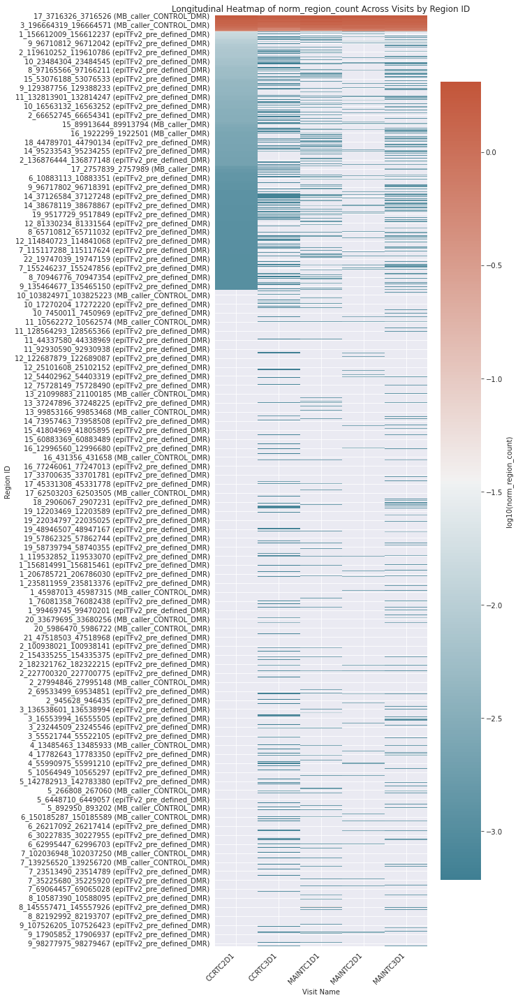

In [25]:
# heatmap plot for the longitudinal DMR signal (epiTFv2 DMR only)

# Assuming df_patient_1339 is defined and contains 'run_sample_id' and 'Visit_name'
epiTFv2_out_path = f"{work_dir}/TFv2beta_BMS_SOW33_04082024_ouput"

# Map sample_id to Visit_name
visit_name_mapping = df_patient_1339.set_index('run_sample_id')['Visit_name'].to_dict()

# Initialize an empty DataFrame for consolidated data
df_consolidated = pd.DataFrame()

# Desired order of Visit_names, ensuring it matches the Visit_name column after mapping
desired_order_visit_names = ['CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1']

# Iterate over each sample_id to load its corresponding file
for sample_id, visit_name in visit_name_mapping.items():
    file_path = f"{epiTFv2_out_path}/{sample_id}.msre_region_stats_annotated.csv"
    try:
        # Load the data file
        df_temp = pd.read_csv(file_path)

        # Only filter for non-LR_caller_DMR annotations
        df_temp = df_temp[df_temp["annotation"] != "LR_caller_DMR"]

        # Add 'sample_id' and 'Visit_name' to the DataFrame
        df_temp['sample_id'] = sample_id
        df_temp['Visit_name'] = visit_name
        # Append to the consolidated DataFrame
        df_consolidated = pd.concat([df_consolidated, df_temp], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {sample_id}: {file_path}")
        continue


# Create a new index by combining 'region_id' and 'annotation'
df_consolidated['region_annotation'] = df_consolidated['region_id'] + " (" + df_consolidated['annotation'] + ")"

# Pivot the DataFrame to have 'region_annotation' as rows, 'Visit_name' as columns, and 'norm_region_count' as values
df_pivot = df_consolidated.pivot(index='region_annotation', columns='Visit_name', values='norm_region_count')

# # Pivot the DataFrame to have 'region_id' as rows, 'Visit_name' as columns, and 'norm_region_count' as values
# df_pivot = df_consolidated.pivot(index='region_id', columns='Visit_name', values='norm_region_count')

# Ensure columns are in the desired order, filling missing with 0
df_pivot = df_pivot.reindex(columns=desired_order_visit_names, fill_value=0)

# Replace 0 with NaN and apply log scale
df_pivot.replace(0, np.nan, inplace=True)
df_log_scale = np.log10(df_pivot)

# Sort the rows (regions) based on the 'CCRTC1D1'
df_log_scale_sorted = df_log_scale.sort_values(by=desired_order_visit_names[0], ascending=False)

# Plotting the heatmap
plt.figure(figsize=(10, 20))  # Adjust the figure size as needed
cmap = sns.diverging_palette(220, 20, as_cmap=True)

ax = sns.heatmap(df_log_scale_sorted, cmap=cmap, cbar_kws={'label': 'log10(norm_region_count)'})

# Make sure to use desired_order_visit_names since it matches the columns in df_pivot
ax.set_xticklabels(desired_order_visit_names, rotation=45, ha="right")

plt.title('Longitudinal Heatmap of norm_region_count Across Visits by Region ID')
plt.xlabel('Visit Name')
plt.ylabel('Region ID')
plt.tight_layout()
plt.show()



## Select treatment-induced candidate DMRs based on BMS cohort

### First filter (Identify the treatment-specific DMRs for each patient whose norm_region_count in any of the on-treatment points >= the value of norm_region_count of in any of the baseline points; except the on-treatment points are convincing recurrence case)


In [48]:
# Select the eligible patients for the analysis (with both baseline datapoint and at least one on-treatment datapoint)

# Define the baseline and on-treatment 'Visit_name' categories
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']

# Filter the DataFrame for patients with baseline visits
baseline_patients = df_BMS_MRD_all_6[df_BMS_MRD_all_6['Visit_name'].isin(baseline_visits)]

# Filter the DataFrame for patients with on-treatment visits
on_treatment_patients = df_BMS_MRD_all_6[df_BMS_MRD_all_6['Visit_name'].isin(on_treatment_visits)]

# Find the intersection of patient IDs between the two groups
candidate_patient_ids = set(baseline_patients['Patient_ID']).intersection(set(on_treatment_patients['Patient_ID']))

# Convert the set to a list
candidate_patient_list = list(candidate_patient_ids)
print("Total patient size of BMS_SOW33_Infinity_01 batch for on-treatment analysis is " + str(len(candidate_patient_list))) 


Total patient size of BMS_SOW33_Infinity_01 batch for on-treatment analysis is 50


In [54]:
# Identify the treatment-specific DMRs for each patient (the value (norm_region_count) of this "region_annotation" in any of the on-treatment points (i.e. ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']) >= the value of (norm_region_count) of this "region_annotation" in any of the baseline points (i.e. ['CCRTC1D1', 'CCRTC2D1']))
# Note that the df_consolidated.csv include all the LR caller DMRs, MB caller DMRs, and epiTFv2 pre-defined DMRs.

# Initialize the DataFrame to hold treatment-specific DMRs
df_treatment_specific_DMRs = pd.DataFrame(columns=['Patient_ID', 'treatment_increased_DMR'])

# Initialize an empty DataFrame for consolidated data
df_consolidated = pd.DataFrame()

for patient_id in candidate_patient_list:
    # Extract data for the current patient
    df_patient = df_BMS_MRD_all_7[df_BMS_MRD_all_7['Patient_ID'] == patient_id]

    # Map sample_id to Visit_name
    visit_name_mapping = df_patient.set_index('run_sample_id')['Visit_name'].to_dict()

    # Desired order of Visit_names, ensuring it matches the Visit_name column after mapping
    desired_order_visit_names = ['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG']

    # Iterate over each sample_id to load its corresponding file
    for sample_id, visit_name in visit_name_mapping.items():
        file_path = f"{epiTFv2_out_path}/{sample_id}.msre_region_stats_annotated.csv"
        try:
            # Load the data file
            df_temp = pd.read_csv(file_path)
            # Add 'sample_id' and 'Visit_name' to the DataFrame
            df_temp['sample_id'] = sample_id
            df_temp['Visit_name'] = visit_name
            df_temp['Patient_ID'] = patient_id
            df_temp['MB_Lung_v4_call'] = df_patient[df_patient['run_sample_id'] == sample_id]['MB_Lung_v4_call'].values[0]
            df_temp['epiTF_TFv2beta'] = df_patient[df_patient['run_sample_id'] == sample_id]['epiTF_TFv2beta'].values[0]
            # Append to the consolidated DataFrame
            df_consolidated = pd.concat([df_consolidated, df_temp], ignore_index=True)
            # Create a new index by combining 'region_id' and 'annotation'
            df_consolidated['region_annotation'] = df_consolidated['region_id'] + " (" + df_consolidated['annotation'] + ")"
        except FileNotFoundError:
            print(f"File not found for sample_id {sample_id}: {file_path}")
            continue

# Save the intermediate data as the processing time is very long
df_consolidated.to_csv(f"{work_dir}/df_consolidated.csv", index=False)
df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)

File not found for sample_id nan: /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/On_treatment_effect_on_methylation_03172024/TFv2beta_BMS_SOW33_04082024_ouput/nan.msre_region_stats_annotated.csv


In [58]:
# Pivot the DataFrame
df_pivot = df_consolidated.pivot_table(index=['Patient_ID', 'region_annotation'], columns='Visit_name', values='norm_region_count', aggfunc='max').reset_index()

# Ensure columns are in the correct order, adjusting as necessary for the patient
visit_order = ['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG']
df_pivot = df_pivot.reindex(columns=['Patient_ID', 'region_annotation'] + [v for v in visit_order if v in df_pivot.columns])

# Save the intermediate data as the processing time is very long
df_pivot.to_csv(f"{work_dir}/df_pivot_candidate_patient.csv", index=False)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

In [2]:
# Generate the df_pivot_all which include all the columns from df_pivot plus the 'Stratification' and 'sample_id' column
# 'MB_Lung_v4_call' is "Detected" OR 'epiTF_TFv2beta' is > 0.0005 is used as the criteria for a "cancer-positive" sample
# 'epiTF_TFv2beta' is > 0.0005 is an arbitrary threshold


# Read in the data
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)
df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)

# Filter out the rows where 'region_annotation' ends with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch is " + str(df_pivot.region_annotation.unique().size) + "\n") 

# Define the baseline and on-treatment 'Visit_name' categories
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']

# Stratify at the sample level in df_consolidated
df_consolidated['Stratification'] = np.where(
    (df_consolidated['MB_Lung_v4_call'] == 'Detected') | (df_consolidated['epiTF_TFv2beta'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# # Stratify at the sample level in df_consolidated
# df_consolidated['Stratification'] = np.where(
#     (df_consolidated['MB_Lung_v4_call'] == 'Detected'),
#     'Cancer',
#     'No Cancer'
# )


# Merge this stratification information back into df_pivot at the sample level
df_pivot_all = pd.merge(
    df_pivot,
    df_consolidated[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)

# Save the df_pivot_all with complete information
df_pivot_all.to_csv(f"{work_dir}/df_pivot_all_complete_columns.csv", index=False)

print("Total eligible sample size (with both baseline and treatment) of BMS_SOW33_Infinity_01 batch is " + str(df_pivot_all.sample_id.unique().size) + "\n") 

df_pivot_all.head()

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch is 1355

Total eligible sample size (with both baseline and treatment) of BMS_SOW33_Infinity_01 batch is 222



,Patient_ID,region_annotation,CCRTC1D1,CCRTC2D1,CCRTC3D1,MAINTC1D1,MAINTC2D1,MAINTC3D1,MAINTC8D1,UPPROG,sample_id,Stratification
0,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.000000,NaN,0.00000,NaN,NaN,B00484246,Cancer
1,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.000000,NaN,0.00000,NaN,NaN,B00484263,No Cancer
2,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.000000,NaN,0.00000,NaN,NaN,B00484260,No Cancer
3,0019-01615,10_101279861_101280585 (epiTFv2_pre_defined_DMR),0.014148,NaN,NaN,0.001414,NaN,0.00131,NaN,NaN,B00484246,Cancer
4,0019-01615,10_101279861_101280585 (epiTFv2_pre_defined_DMR),0.014148,NaN,NaN,0.001414,NaN,0.00131,NaN,NaN,B00484263,No Cancer


In [6]:
df_consolidated.head()

,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,annotation,sample_id,Visit_name,Patient_ID,MB_Lung_v4_call,epiTF_TFv2beta,region_annotation,Stratification
0,XXX,fixed_count_demo,1_10002945_10003541,0,-1,0,0.000000,0.000000,0.000000,LR_caller_DMR,B00484175,CCRTC1D1,0084-01339,Detected,0.043481,1_10002945_10003541 (LR_caller_DMR),Cancer
1,XXX,fixed_count_demo,1_100315437_100316120,0,26,0,0.000000,0.000000,0.000000,LR_caller_DMR,B00484175,CCRTC1D1,0084-01339,Detected,0.043481,1_100315437_100316120 (LR_caller_DMR),Cancer
2,XXX,fixed_count_demo,1_1003813_1003933,3,10,3,1663.478652,0.001803,0.001803,LR_caller_DMR,B00484175,CCRTC1D1,0084-01339,Detected,0.043481,1_1003813_1003933 (LR_caller_DMR),Cancer
3,XXX,fixed_count_demo,1_1004162_1004865,0,24,0,0.000000,0.000000,0.000000,LR_caller_DMR,B00484175,CCRTC1D1,0084-01339,Detected,0.043481,1_1004162_1004865 (LR_caller_DMR),Cancer
4,XXX,fixed_count_demo,1_100435187_100435737,0,-1,0,0.000000,0.000000,0.000000,LR_caller_DMR,B00484175,CCRTC1D1,0084-01339,Detected,0.043481,1_100435187_100435737 (LR_caller_DMR),Cancer


In [4]:
# Generate the df_pivot_all which include all the columns from df_pivot plus the 'Stratification' and 'sample_id' column
# 'MB_Lung_v4_call' is "Detected" OR 'epiTF_TFv2beta' is > 0.0005 is used as the criteria for a "cancer-positive" sample
# 'epiTF_TFv2beta' is > 0.0005 is an arbitrary threshold


# Read in the data
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)
df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)

# Filter out the rows where 'region_annotation' ends with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch is " + str(df_pivot.region_annotation.unique().size) + "\n") 

# Define the baseline and on-treatment 'Visit_name' categories
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']
progression_visits = ['UPPROG']

# Merge this stratification information back into df_pivot at the sample level
df_pivot_all = pd.merge(
    df_pivot,
    df_consolidated[['sample_id', 'Patient_ID', 'region_annotation', 'MB_Lung_v4_call', 'epiTF_TFv2beta', 'Visit_name']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)


print("Total eligible sample size (with both baseline and treatment) of BMS_SOW33_Infinity_01 batch is " + str(df_pivot_all.sample_id.unique().size) + "\n") 

df_pivot_all_1 = df_pivot_all.copy()

df_pivot_all_1.head()

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch is 1355

Total eligible sample size (with both baseline and treatment) of BMS_SOW33_Infinity_01 batch is 222



,Patient_ID,region_annotation,CCRTC1D1,CCRTC2D1,CCRTC3D1,MAINTC1D1,MAINTC2D1,MAINTC3D1,MAINTC8D1,UPPROG,sample_id,MB_Lung_v4_call,epiTF_TFv2beta,Visit_name
0,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.000000,NaN,0.00000,NaN,NaN,B00484246,Detected,0.034523,CCRTC1D1
1,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.000000,NaN,0.00000,NaN,NaN,B00484263,Not Detected,0.000018,MAINTC1D1
2,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.000000,NaN,0.00000,NaN,NaN,B00484260,Not Detected,0.000073,MAINTC3D1
3,0019-01615,10_101279861_101280585 (epiTFv2_pre_defined_DMR),0.014148,NaN,NaN,0.001414,NaN,0.00131,NaN,NaN,B00484246,Detected,0.034523,CCRTC1D1
4,0019-01615,10_101279861_101280585 (epiTFv2_pre_defined_DMR),0.014148,NaN,NaN,0.001414,NaN,0.00131,NaN,NaN,B00484263,Not Detected,0.000018,MAINTC1D1


In [79]:
print(df_consolidated.region_annotation.unique().size)

# Filter out the rows where 'region_annotation' ends with '(LR_caller_DMR)'
df_consolidated_filtered = df_consolidated[~df_consolidated['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_consolidated_filtered = df_consolidated_filtered[~df_consolidated_filtered['region_annotation'].str.contains('CONTROL')]

print(df_consolidated_filtered.region_annotation.unique().size)


36807
1355


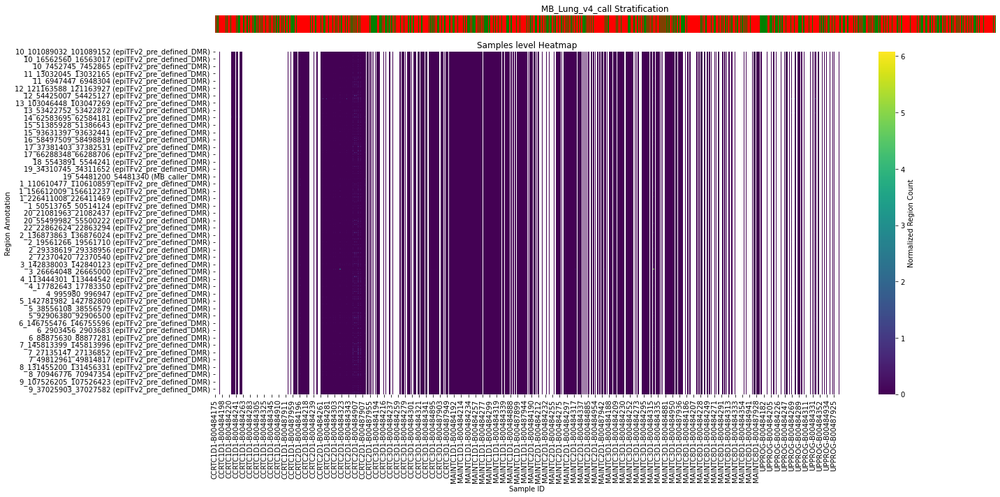

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_pivot_all is loaded with the appropriate data
# Make sure to keep NaN values as they are and do not fill them.
df_pivot_all = df_pivot_all_1.copy()

# Let's prepare the heatmap data, keeping NaN values intact.
heatmap_data = df_pivot_all.set_index(['region_annotation', 'sample_id']).unstack(level=-1)

# The 'sample_id' will be columns and 'region_annotation' will be the index.
# The actual values will be the normalized region count values, which we do not want to fill with zeros.
# We only want to pivot the columns that contain the normalized region count data:
numeric_columns = ['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG']
heatmap_data = heatmap_data[numeric_columns]

# Prepare the stratification data
# We create a series with 'sample_id' as index and map 'Detected' to 1 and 'Not Detected' to 0
stratification_data = df_pivot_all.drop_duplicates(subset='sample_id').set_index('sample_id')['MB_Lung_v4_call']
stratification_data = stratification_data.map({'Detected': 1, 'Not Detected': 0}).reindex(heatmap_data.columns, level='sample_id')

# Plot the heatmap and the stratification bar
fig, (ax_strat, ax_heatmap) = plt.subplots(2, 1, figsize=(20, 10), gridspec_kw={'height_ratios': [1, 20]})

# Plotting the stratification bar
sns.heatmap(stratification_data.values[np.newaxis], cmap=['red', 'green'], cbar=False, ax=ax_strat, xticklabels=False, yticklabels=False)
ax_strat.set_title('MB_Lung_v4_call Stratification')
ax_strat.set_xticks([])

# Plotting the heatmap
# We use mask to not color NaN values, ensuring they are left as blank (white) on the heatmap
sns.heatmap(heatmap_data, cmap='viridis', ax=ax_heatmap, mask=heatmap_data.isnull(), cbar_kws={'label': 'Normalized Region Count'})
ax_heatmap.set_title('Samples level Heatmap')
ax_heatmap.set_xlabel('Sample ID')
ax_heatmap.set_ylabel('Region Annotation')
plt.setp(ax_heatmap.get_xticklabels(), rotation=90)

plt.tight_layout()
plt.show()


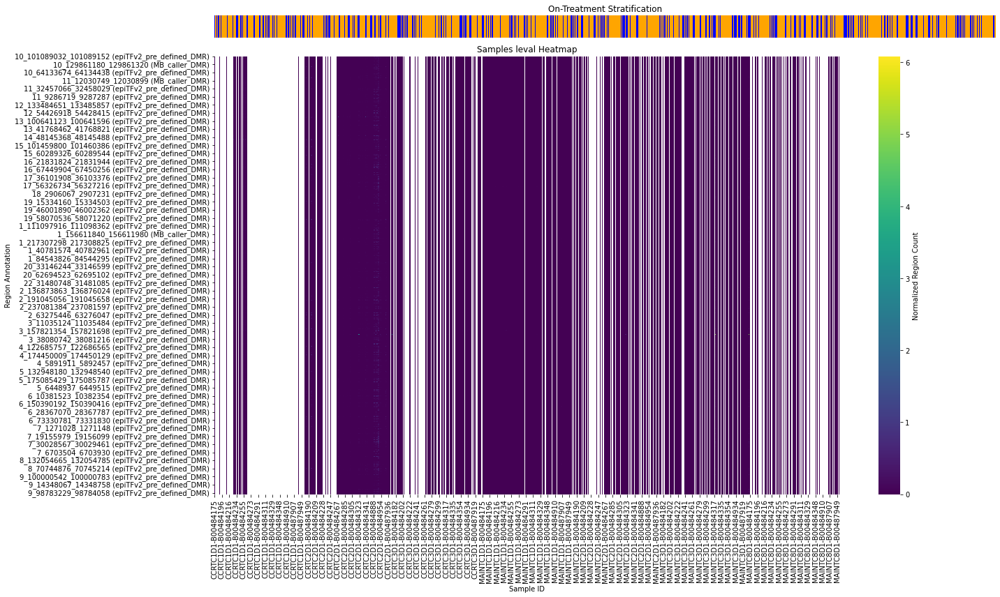

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your data into df_pivot_all
df_pivot_all = df_pivot_all_1.copy()

# Define your visits
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']

# Create a binary column for on-treatment status based on Visit_name
df_pivot_all['On_Treatment'] = df_pivot_all['Visit_name'].apply(lambda x: 1 if x in on_treatment_visits else 0)

# Keep only the necessary numeric columns for the heatmap
numeric_columns = baseline_visits + on_treatment_visits
heatmap_data = df_pivot_all.set_index(['region_annotation', 'sample_id'])[numeric_columns].unstack(level=-1)

# Prepare stratification data for on-treatment status
stratification_data = df_pivot_all[['sample_id', 'On_Treatment']].drop_duplicates().set_index('sample_id')['On_Treatment']

# Plot the heatmap and the stratification bar
fig, (ax_strat, ax_heatmap) = plt.subplots(2, 1, figsize=(20, 12), gridspec_kw={'height_ratios': [1, 20]})

# Plotting the stratification bar
# Reindex stratification_data to match the heatmap_data column order
stratification_data = stratification_data.reindex(heatmap_data.columns.get_level_values(1))
sns.heatmap(stratification_data.values[np.newaxis], cmap=['blue', 'orange'], cbar=False, ax=ax_strat, xticklabels=False, yticklabels=False)
ax_strat.set_title('On-Treatment Stratification')
ax_strat.set_xticks([])

# Plotting the heatmap
# Create mask for NaN values
mask = heatmap_data.isnull()
sns.heatmap(heatmap_data, cmap='viridis', ax=ax_heatmap, mask=mask, cbar_kws={'label': 'Normalized Region Count'})
ax_heatmap.set_title('Samples leval Heatmap')
ax_heatmap.set_xlabel('Sample ID')
ax_heatmap.set_ylabel('Region Annotation')

# Rotate x-axis labels for better readability
plt.setp(ax_heatmap.get_xticklabels(), rotation=90)

plt.tight_layout()
plt.show()


In [11]:
# Remove all the DMRs from the on-treatment samples if this sample is a "cancer-positive" sample

# Read in the data
df_pivot_all = pd.read_csv(f"{work_dir}/df_pivot_all_complete_columns.csv", header=0)

# Identify on-treatment samples with "Cancer" stratification in df_consolidated
on_treatment_samples_cancer = df_consolidated[
    (df_consolidated['Visit_name'].isin(on_treatment_visits)) & 
    (df_consolidated['Stratification'] == 'Cancer')
]['sample_id'].unique()

# Remove these rows from df_pivot
df_pivot_no_treatment_positive = df_pivot_all[~df_pivot_all['sample_id'].isin(on_treatment_samples_cancer)]
print('Total eligible sample size after removing "cancer-positive" on-treatment sample is ' + str(df_pivot_no_treatment_positive.sample_id.unique().size) + "\n") 

df_pivot_no_treatment_positive.head()

Total eligible sample size after removing "cancer-positive" on-treatment sample is 184



,Patient_ID,region_annotation,CCRTC1D1,CCRTC2D1,CCRTC3D1,MAINTC1D1,MAINTC2D1,MAINTC3D1,MAINTC8D1,UPPROG,sample_id,Stratification
0,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.00000,NaN,0.000000,NaN,NaN,B00484246,Cancer
1,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.00000,NaN,0.000000,NaN,NaN,B00484263,No Cancer
2,0019-01615,10_101089032_101089152 (epiTFv2_pre_defined_DMR),0.000000,NaN,NaN,0.00000,NaN,0.000000,NaN,NaN,B00484260,No Cancer
3,0019-01615,10_101279861_101280585 (epiTFv2_pre_defined_DMR),0.013706,NaN,NaN,0.00135,NaN,0.001255,NaN,NaN,B00484246,Cancer
4,0019-01615,10_101279861_101280585 (epiTFv2_pre_defined_DMR),0.013706,NaN,NaN,0.00135,NaN,0.001255,NaN,NaN,B00484263,No Cancer


In [12]:
# Identify the treatment-specific DMRs for each patient (the value (norm_region_count) of this "region_annotation" in any of the on-treatment points (i.e. ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']) >= the value of (norm_region_count) of this "region_annotation" in any of the baseline points (i.e. ['CCRTC1D1', 'CCRTC2D1']))


# Replace NaN with -inf to properly handle comparisons (NaN comparisons are problematic)
df_pivot_no_treatment_positive[baseline_visits + on_treatment_visits] = df_pivot_no_treatment_positive[baseline_visits + on_treatment_visits].fillna(-np.inf)

# Create masks for baseline and on-treatment values
baseline_mask = df_pivot_no_treatment_positive[baseline_visits].max(axis=1)
on_treatment_mask = df_pivot_no_treatment_positive[on_treatment_visits].max(axis=1)

# Identify rows where any on-treatment value is > any baseline value (can't be >= becuase many columns are 0 which also meet the requirement)
eligible = on_treatment_mask > baseline_mask

# Filter the DataFrame based on the eligibility criterion
df_eligible_dmr = df_pivot_no_treatment_positive[eligible]

# Extract the relevant 'Patient_ID' and 'region_annotation' into a new DataFrame
df_treatment_specific_DMRs = df_eligible_dmr[['Patient_ID', 'region_annotation', 'sample_id', 'Stratification']].copy()

# Merge to bring in 'Visit_name' from df_consolidated
df_treatment_specific_DMRs = pd.merge(
    df_treatment_specific_DMRs,
    df_consolidated[['Patient_ID', 'region_annotation', 'sample_id', 'Visit_name']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation', 'sample_id'],
    how='left'
)

# Reset index to clean up the DataFrame 
df_treatment_specific_DMRs.reset_index(drop=True, inplace=True)

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after initial filtering is " + str(df_treatment_specific_DMRs.region_annotation.unique().size) + "\n") 
df_treatment_specific_DMRs.head()

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after initial filtering is 972



,Patient_ID,region_annotation,sample_id,Stratification,Visit_name
0,0019-01615,10_128076966_128077324 (epiTFv2_pre_defined_DMR),B00484246,Cancer,CCRTC1D1
1,0019-01615,10_128076966_128077324 (epiTFv2_pre_defined_DMR),B00484263,No Cancer,MAINTC1D1
2,0019-01615,10_128076966_128077324 (epiTFv2_pre_defined_DMR),B00484260,No Cancer,MAINTC3D1
3,0019-01615,10_128993520_128994456 (epiTFv2_pre_defined_DMR),B00484246,Cancer,CCRTC1D1
4,0019-01615,10_128993520_128994456 (epiTFv2_pre_defined_DMR),B00484263,No Cancer,MAINTC1D1


### Second Filter for treatment-induced DMRs from the candidate list (df_treatment_specific_DMRs) based (MB caller & epiTFv2) 2x2 table statistical test

In [15]:
from scipy.stats import chi2_contingency, fisher_exact
import statsmodels.stats.multitest as smm

# 2. fisher exact test of each candidate DMRs based on the 2x2 contengency table (frequency of non-zero occurrences for each region in baseline and on-treatment visits) stratified by cancer status on sample level

# Read in the data df_consolidated and df_pivot from the first filter step
df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size) + "\n")

# df_treatment_specific_DMRs contains the filtered region_annotations after first filter
df_pivot_1st_filter = df_pivot[df_pivot['region_annotation'].isin(df_treatment_specific_DMRs['region_annotation'])]
df_consolidated_1st_filter = df_consolidated[df_consolidated['region_annotation'].isin(df_treatment_specific_DMRs['region_annotation'])]
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch in df_treatment_specific_DMRs is " + str(df_pivot_1st_filter.region_annotation.unique().size) + "\n")
    
# Stratify at the sample level in df_consolidated
df_consolidated_1st_filter['Stratification'] = np.where(
    (df_consolidated_1st_filter['MB_Lung_v4_call'] == 'Detected') | (df_consolidated_1st_filter['epiTF_TFv2alpha'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# Merge this stratification information back into df_pivot at the sample level
df_pivot_1st_filter = pd.merge(
    df_pivot_1st_filter,
    df_consolidated_1st_filter[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)

# Define baseline and on-treatment visit categories
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']

regions, p_values = [], []

# Iterate over each stratification group
for strat in ['Cancer', 'No Cancer']:
    strat_df = df_pivot_1st_filter[df_pivot_1st_filter['Stratification'] == strat]

    for region in strat_df['region_annotation'].unique():
        region_data = strat_df[strat_df['region_annotation'] == region]

        # Calculate the frequency of non-zero occurrences for baseline and on-treatment visits
        region_baseline_freq = ((region_data[baseline_visits] > 0).sum(axis=1) > 0).sum()
        region_on_treatment_freq = ((region_data[on_treatment_visits] > 0).sum(axis=1) > 0).sum()

        # Construct the contingency table
        contingency_table = np.array([
            [region_baseline_freq, region_on_treatment_freq],
            [len(strat_df) - region_baseline_freq, len(strat_df) - region_on_treatment_freq]
        ])

        # Perform Fisher's exact test
        odds_ratio, p = fisher_exact(contingency_table)

        regions.append(region)
        p_values.append(p)

# Apply the Bonferroni correction for multiple testing
adjusted_p_values = smm.multipletests(p_values, alpha=0.05, method='bonferroni')[1]

# Compile results into a DataFrame
results_df = pd.DataFrame({
    'region_annotation': regions,
    'p_value': p_values,
    'adjusted_p_value': adjusted_p_values,
    'stratification': np.tile(['Cancer', 'No Cancer'], int(len(regions)/2))
})

# Filter for significant results
significant_regions_Bonferroni = results_df[results_df['adjusted_p_value'] < 0.05]
significant_regions_No_Bonferroni = results_df[results_df['p_value'] < 0.05]

print(f"Total treatment-induced DMRs with Bonferroni correction: {significant_regions_Bonferroni.shape[0]}\n")
print(f"Total treatment-induced DMRs with Bonferroni correction in cancer-negative samples is " + str(significant_regions_Bonferroni[significant_regions_Bonferroni["stratification"] == "No Cancer"].shape[0]) + "\n")
print(f"Total treatment-induced DMRs without Bonferroni correction: {significant_regions_No_Bonferroni.shape[0]}\n")
print(f"Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples is " + str(significant_regions_No_Bonferroni[significant_regions_No_Bonferroni["stratification"] == "No Cancer"].shape[0]) + "\n")


Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch in df_treatment_specific_DMRs is 972

Total treatment-induced DMRs with Bonferroni correction: 56

Total treatment-induced DMRs with Bonferroni correction in cancer-negative samples is 27

Total treatment-induced DMRs without Bonferroni correction: 585

Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples is 295



In [14]:
# post-hoc analysis on the list of significant differentially methylated regions (DMRs) identified as being significantly more likely in samples taken during treatment compared to baseline samples, particularly focusing on those within the "No Cancer" stratification

# Get the candidate list
convincing_regions_signficant_no_cancer = significant_regions_No_Bonferroni[significant_regions_No_Bonferroni["stratification"] == "No Cancer"].region_annotation.to_list()
print(f"Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples before post-hoc analysis is " + str(len(convincing_regions_signficant_no_cancer)) + "\n")

# Initialize a list to hold DMRs with higher signals during treatment
dmrs_higher_on_treatment = []

for dmr in convincing_regions_signficant_no_cancer:
    # Filter for the current DMR
    dmr_data = df_pivot_1st_filter[df_pivot_1st_filter['region_annotation'] == dmr]
    
    # Calculate the mean signal strength for baseline and on-treatment
    baseline_signals = dmr_data[baseline_visits].replace(-np.inf, np.nan).mean(axis=1)
    on_treatment_signals = dmr_data[on_treatment_visits].replace(-np.inf, np.nan).mean(axis=1)
    
    # Check if the mean on-treatment signal is higher than the baseline signal
    if on_treatment_signals.mean() > baseline_signals.mean():
        dmrs_higher_on_treatment.append(dmr)
        #print(f"{dmr}: Mean baseline signal = {baseline_signals.mean()}, Mean on-treatment signal = {on_treatment_signals.mean()}")

# dmrs_higher_on_treatment now contains DMRs with higher signals during treatment
# print("\nDMRs with higher signals on treatment:", dmrs_higher_on_treatment)
print(f"Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples with post-hoc analysis is " + str(len(dmrs_higher_on_treatment)) + "\n")



Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples before post-hoc analysis is 295

Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples with post-hoc analysis is 12



In [125]:
# Undersampling to handle imbalanced baseline vs on-treatment 

# Read in the data df_consolidated and df_pivot from the first filter step
df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size) + "\n")

# df_treatment_specific_DMRs contains the filtered region_annotations after first filter
df_pivot_1st_filter = df_pivot[df_pivot['region_annotation'].isin(df_treatment_specific_DMRs['region_annotation'])]
df_consolidated_1st_filter = df_consolidated[df_consolidated['region_annotation'].isin(df_treatment_specific_DMRs['region_annotation'])]
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch in df_treatment_specific_DMRs is " + str(df_pivot_1st_filter.region_annotation.unique().size) + "\n")
    
# Stratify at the sample level in df_consolidated
df_consolidated_1st_filter['Stratification'] = np.where(
    (df_consolidated_1st_filter['MB_Lung_v4_call'] == 'Detected') | (df_consolidated_1st_filter['epiTF_TFv2alpha'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# Merge this stratification information back into df_pivot at the sample level
df_pivot_1st_filter = pd.merge(
    df_pivot_1st_filter,
    df_consolidated_1st_filter[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)

# Define baseline and on-treatment visit categories
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']

# Downsampling function
def downsample(df, baseline_samples_count, on_treatment_ratio, seed=42):
    """
    Downsamples on-treatment groups based on a specified ratio relative to baseline sample count.
    """
    # Calculate the desired number of on-treatment samples
    n_samples = int(baseline_samples_count * on_treatment_ratio)
    
    # Separate the data into baseline and on-treatment
    baseline_df = df[df[baseline_visits].notna().any(axis=1)]
    on_treatment_df = df[df[on_treatment_visits].notna().any(axis=1)]
    
    # Downsample the on-treatment data if necessary
    if len(on_treatment_df) > n_samples:
        on_treatment_df_downsampled = on_treatment_df.sample(n=n_samples, random_state=seed)
    else:
        on_treatment_df_downsampled = on_treatment_df
    
    # Combine downsampled on-treatment data with baseline data
    return pd.concat([baseline_df, on_treatment_df_downsampled])

# Specify the downsampling ratio
on_treatment_ratio = 2  # For example, 2 on-treatment samples for every baseline sample

regions, p_values, stratifications = [], [], []

# Perform the analysis for each stratification group
for strat in ['Cancer', 'No Cancer']:
    strat_df = df_pivot_1st_filter[df_pivot_1st_filter['Stratification'] == strat]
    
    # Downsample on-treatment samples within each stratification group
    strat_df_downsampled = downsample(strat_df, df_pivot_1st_filter[baseline_visits].notna().sum().min(), on_treatment_ratio)

    for region in strat_df_downsampled['region_annotation'].unique():
        region_data = strat_df_downsampled[strat_df_downsampled['region_annotation'] == region]

        region_baseline_freq = ((region_data[baseline_visits] > 0).sum(axis=1) > 0).sum()
        region_on_treatment_freq = ((region_data[on_treatment_visits] > 0).sum(axis=1) > 0).sum()

        contingency_table = np.array([
            [region_baseline_freq, region_on_treatment_freq],
            [len(strat_df_downsampled) - region_baseline_freq, len(strat_df_downsampled) - region_on_treatment_freq]
        ])

        odds_ratio, p = fisher_exact(contingency_table)

        regions.append(region)
        p_values.append(p)
        stratifications.append(strat)

# Check if p_values list is non-empty before proceeding
if p_values:
    adjusted_p_values = smm.multipletests(p_values, alpha=0.05, method='bonferroni')[1]

    results_df = pd.DataFrame({
        'region_annotation': regions,
        'p_value': p_values,
        'adjusted_p_value': adjusted_p_values,
        'stratification': stratifications
    })

    significant_regions_Bonferroni = results_df[results_df['adjusted_p_value'] < 0.05]
    significant_regions_No_Bonferroni = results_df[results_df['p_value'] < 0.05]
else:
    print("No regions passed the criteria for Fisher's exact test.")
    results_df = pd.DataFrame()

# Output the results
print(f"Total treatment-induced DMRs with Bonferroni correction: {significant_regions_Bonferroni.shape[0]}\n")
print(f"Total treatment-induced DMRs with Bonferroni correction in cancer-negative samples is " + str(significant_regions_Bonferroni[significant_regions_Bonferroni["stratification"] == "No Cancer"].shape[0]) + "\n")
print(f"Total treatment-induced DMRs without Bonferroni correction: {significant_regions_No_Bonferroni.shape[0]}\n")
print(f"Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples is " + str(significant_regions_No_Bonferroni[significant_regions_No_Bonferroni["stratification"] == "No Cancer"].shape[0]) + "\n")



Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch in df_treatment_specific_DMRs is 972

Total treatment-induced DMRs with Bonferroni correction: 159

Total treatment-induced DMRs with Bonferroni correction in cancer-negative samples is 116

Total treatment-induced DMRs without Bonferroni correction: 846

Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples is 525



In [110]:
# post-hoc analysis on the list of significant differentially methylated regions (DMRs) identified as being significantly more likely in samples taken during treatment compared to baseline samples, particularly focusing on those within the "No Cancer" stratification

# Get the candidate list
convincing_regions_signficant_no_cancer = significant_regions_No_Bonferroni[significant_regions_No_Bonferroni["stratification"] == "No Cancer"].region_annotation.to_list()
print(f"Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples before post-hoc analysis is " + str(len(convincing_regions_signficant_no_cancer)) + "\n")

# Initialize a list to hold DMRs with higher signals during treatment
dmrs_higher_on_treatment = []

for dmr in convincing_regions_signficant_no_cancer:
    # Filter for the current DMR
    dmr_data = df_pivot_1st_filter[df_pivot_1st_filter['region_annotation'] == dmr]
    
    # Calculate the mean signal strength for baseline and on-treatment
    baseline_signals = dmr_data[baseline_visits].replace(-np.inf, np.nan).mean(axis=1)
    on_treatment_signals = dmr_data[on_treatment_visits].replace(-np.inf, np.nan).mean(axis=1)
    
    # Check if the mean on-treatment signal is higher than the baseline signal
    if on_treatment_signals.mean() > baseline_signals.mean():
        dmrs_higher_on_treatment.append(dmr)
        #print(f"{dmr}: Mean baseline signal = {baseline_signals.mean()}, Mean on-treatment signal = {on_treatment_signals.mean()}")

# dmrs_higher_on_treatment now contains DMRs with higher signals during treatment
# print("\nDMRs with higher signals on treatment:", dmrs_higher_on_treatment)
print(f"Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples with post-hoc analysis is " + str(len(dmrs_higher_on_treatment)) + "\n")



Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples before post-hoc analysis is 590

Total treatment-induced DMRs without Bonferroni correction in cancer-negative samples with post-hoc analysis is 33



### Third Filter for treatment-induced DMRs from the candidate list (significant_regions_No_Bonferroni) based on distribution

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after first step is 972

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after second step is 229



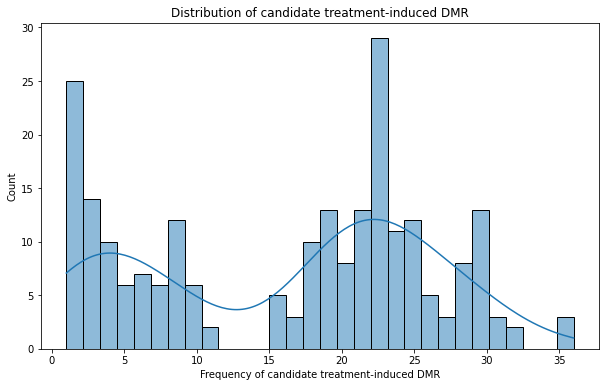

In [33]:
# Distribution plot shows the frequency of candidate treatment-induced differentially methylated regions (DMRs) across a cohort of candidate patients (who has both baseline and treatment time points) receiving treatment.
df_treatment_specific_DMRs_1 = df_treatment_specific_DMRs.copy()
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after first step is " + str(df_treatment_specific_DMRs.region_annotation.unique().size) + "\n")

# Filter the regions based on the second filter
convincing_regions_signficant_no_cancer = significant_regions_No_Bonferroni[significant_regions_No_Bonferroni["stratification"] == "No Cancer"].region_annotation.to_list()
# dmrs_higher_on_treatment
# convincing_regions_signficant_no_cancer = significant_regions_Bonferroni[significant_regions_Bonferroni["stratification"] == "No Cancer"].region_annotation.to_list()


# Filter the regions from the second step
df_treatment_specific_DMRs_1 = df_treatment_specific_DMRs_1[df_treatment_specific_DMRs_1['region_annotation'].isin(convincing_regions_signficant_no_cancer)]
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after second step is " + str(df_treatment_specific_DMRs_1.region_annotation.unique().size) + "\n")

# Drop duplicate entries for the same patient and DMR to ensure each DMR is counted once per patient
df_treatment_specific_DMRs_1 = df_treatment_specific_DMRs_1.drop_duplicates(subset=['Patient_ID', 'region_annotation'])

# Plot the distribution of region_annotation frequencies
region_annotation_counts = df_treatment_specific_DMRs_1['region_annotation'].value_counts()

# Plot the distribution of region_annotation frequencies
plt.figure(figsize=(10, 6))
sns.histplot(region_annotation_counts, bins=30, kde=True)
plt.title('Distribution of candidate treatment-induced DMR')
plt.xlabel('Frequency of candidate treatment-induced DMR')
plt.ylabel('Count')

plt.show()


In [34]:
from sklearn.mixture import GaussianMixture

# As there are two peaks of the distribution plot. Gaussian Mixture Model (GMM) was used to identify the cutoff frequency between the two peaks.
df_treatment_specific_DMRs_2 = df_treatment_specific_DMRs_1.copy()

# Calculate the frequency of each unique 'region_annotation'
frequency_df = df_treatment_specific_DMRs_2.groupby('region_annotation')['Patient_ID'].nunique().reset_index(name='frequency')

# The frequency data must be reshaped into a 2D numpy array
frequency_data = frequency_df['frequency'].values.reshape(-1, 1)

# Fit a Gaussian mixture model with two components to the frequency data
gmm = GaussianMixture(n_components=2, random_state=0)
gmm.fit(frequency_data)

# Predict the cluster for each data point
clusters = gmm.predict(frequency_data)

# Calculate the means of the two Gaussians
means = gmm.means_.flatten()

# Find the cutoff as the point where the two Gaussians intersect
# For more accuracy, you might want to find the intersection, but as a heuristic, we use the average of the means
sorted_means = np.sort(means)
cutoff = np.mean(sorted_means)

print(f"The cutoff frequency between the two peaks is approximately: {cutoff}" + "\n")

# Filter out rows where 'frequency' is less than or equal to the cutoff

# Join the frequency data back to the original DataFrame
df_treatment_specific_DMRs_2 = df_treatment_specific_DMRs_2.merge(frequency_df, on='region_annotation', how='left')
df_treatment_specific_DMRs_2 = df_treatment_specific_DMRs_2[df_treatment_specific_DMRs_2['frequency'] > cutoff]
df_treatment_specific_DMRs_2 = df_treatment_specific_DMRs_2.drop(columns='frequency')

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after the third filtering is " + str(df_treatment_specific_DMRs_2.region_annotation.unique().size)) 


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x2aac597a9160>
Traceback (most recent call last):
  File "/home/hazhang/anaconda3/envs/lunartk_v1.1.0/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/hazhang/anaconda3/envs/lunartk_v1.1.0/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/hazhang/anaconda3/envs/lunartk_v1.1.0/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/hazhang/anaconda3/envs/lunartk_v1.1.0/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback

The cutoff frequency between the two peaks is approximately: 13.916511367900487

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch after the third filtering is 141


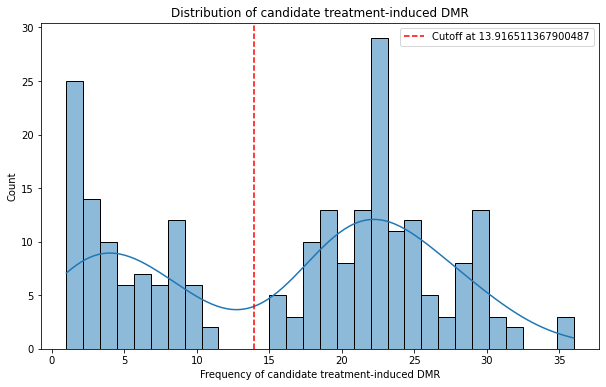

In [35]:
# Plot the distribution with the Gaussian Mixture Model cutoff

# Assuming region_annotation_counts is a pandas Series with the frequency counts
region_annotation_counts = df_treatment_specific_DMRs_1['region_annotation'].value_counts()

# Plot the distribution of region_annotation frequencies
plt.figure(figsize=(10, 6))
sns.histplot(region_annotation_counts, bins=30, kde=True)
plt.title('Distribution of candidate treatment-induced DMR')
plt.xlabel('Frequency of candidate treatment-induced DMR')
plt.ylabel('Count')

# Add a red dashed vertical line at the cutoff frequency
plt.axvline(x=cutoff, color='red', linestyle='--', label=f'Cutoff at {cutoff}')
plt.legend()

plt.show()


In [130]:
# Futher filters are applied (different methods)

# # 1. Frequency threshold > 1
# # Calculate the frequency of each region_annotation
region_annotation_counts = df_treatment_specific_DMRs_2['region_annotation'].value_counts()

# # Apply frequency threshold > 1
# convincing_regions_more_than_once = region_annotation_counts[region_annotation_counts > 1].index.tolist()
# print("Total final treatment-induced DMRs of BMS_SOW33_Infinity_01 batch based on Frequency threshold > 1 is " + str(len(convincing_regions_more_than_once)) + "\n") 

# 2. Frequency threshold > 10% of the patients
# threshold_10_percent = 0.10 * 50  
# convincing_regions_more_than_10_percent = region_annotation_counts[region_annotation_counts > threshold_10_percent].index.tolist()
# print("Total final treatment-induced DMRs of BMS_SOW33_Infinity_01 batch based on Frequency threshold > 10%  is " + str(len(convincing_regions_more_than_10_percent)) + "\n") 

# 3. Keep regions that are above the 75th percentile in frequency
quantile_75_cutoff = region_annotation_counts.quantile(0.75)
convincing_regions_quantile_cutoff = region_annotation_counts[region_annotation_counts > quantile_75_cutoff].index.tolist()
print("Total final treatment-induced DMRs of BMS_SOW33_Infinity_01 batch based on Frequency threshold > 75th is " + str(len(convincing_regions_quantile_cutoff)) + "\n") 


Total final treatment-induced DMRs of BMS_SOW33_Infinity_01 batch based on Frequency threshold > 75th is 32



In [131]:
# Check the overlapping with 75 percentile
convincing_regions_signficant_no_cancer = df_treatment_specific_DMRs_2.region_annotation.to_list()

print(len(convincing_regions_quantile_cutoff))

overlap = set(convincing_regions_quantile_cutoff) & set(convincing_regions_signficant_no_cancer)
overlap_list = list(overlap)
print(len(overlap_list))

32
32


### Validate the finalized treatement-induced DMRs

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100
Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is 141


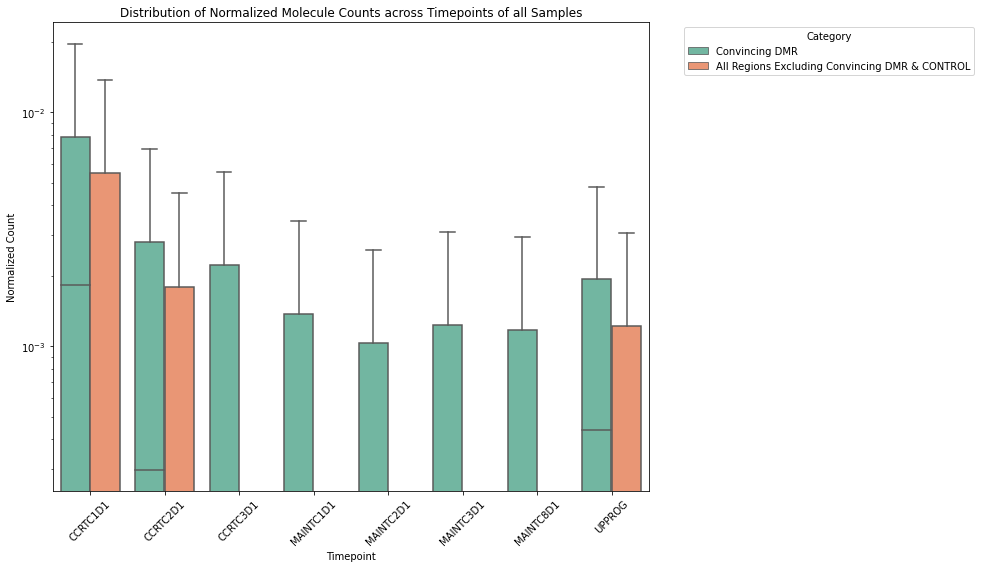

In [36]:
# Compare the Normalized Count between the 'Convincing DMR' and 'All Regions Excluding Convincing DMR' categories across different timepoints

df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size)) 

# Select the convicing DMRs based on different filter methods
# convincing_regions = list(df_treatment_specific_DMRs_1.region_annotation.unique())
convincing_regions = df_treatment_specific_DMRs_2.region_annotation.unique()
# convincing_regions = convincing_regions_quantile_cutoff
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is " + str(df_treatment_specific_DMRs_2.region_annotation.unique().size)) 


# Filter df_pivot for convincing regions
df_convincing = df_pivot[df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_convincing['Category'] = 'Convincing DMR'

# Exclude convincing regions from 'All Regions'
df_all_excluding_convincing = df_pivot[~df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_all_excluding_convincing['Category'] = 'All Regions Excluding Convincing DMR & CONTROL'

# Combine the datasets
df_combined = pd.concat([df_convincing, df_all_excluding_convincing])

# Melt the DataFrame to long format
df_long = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG'], 
                           var_name='Timepoint', value_name='Normalized Count')

# Plotting
plt.figure(figsize=(14, 8))
sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
# sns.lineplot(data=df_long, x='Timepoint', y='Normalized Count', hue='Category', estimator='mean', ci=95, marker='o')
# sns.stripplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", dodge=True, jitter=True, alpha=0.5, linewidth=1)
# sns.violinplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", split=True, inner="quart")

plt.title('Distribution of Normalized Molecule Counts across Timepoints of all Samples')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.yscale('log')

plt.show()

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is 141


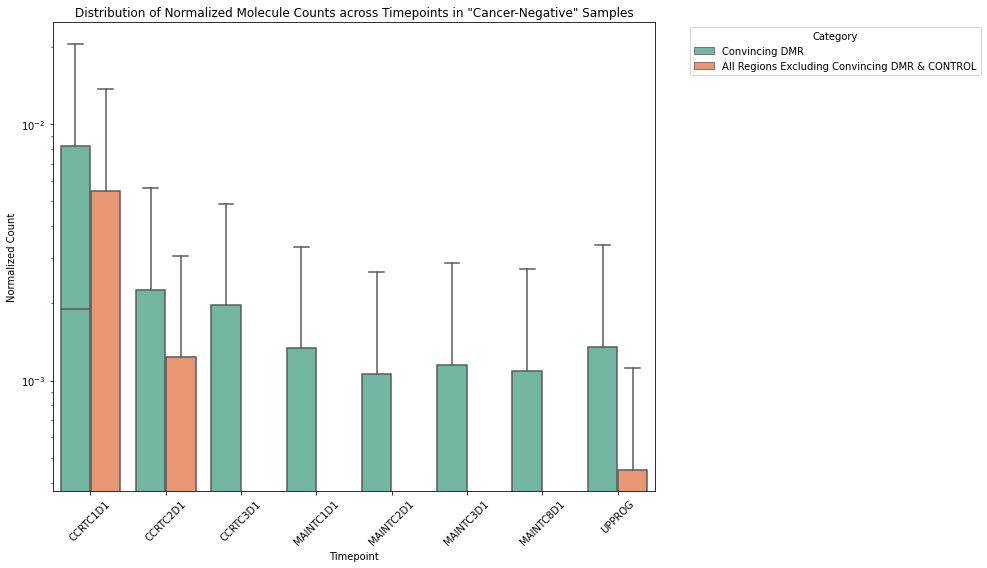

In [46]:
# Compare the Normalized Count between the 'Convincing DMR' and 'All Regions Excluding Convincing DMR' categories across different timepoints in cancer-negative samples

df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size) + "\n")

# Stratify at the sample level in df_consolidated
df_consolidated['Stratification'] = np.where(
    (df_consolidated['MB_Lung_v4_call'] == 'Detected') | (df_consolidated['epiTF_TFv2alpha'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# Merge this stratification information back into df_pivot at the sample level
df_pivot = pd.merge(
    df_pivot,
    df_consolidated[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)

# Filter for cancer-negative samples
df_pivot = df_pivot[df_pivot["Stratification"] == "No Cancer"] 

# Select the convicing DMRs based on different filter methods
# convincing_regions = list(df_treatment_specific_DMRs_1.region_annotation.unique())
convincing_regions = df_treatment_specific_DMRs_2.region_annotation.unique()
# convincing_regions = convincing_regions_quantile_cutoff
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is " + str(df_treatment_specific_DMRs_2.region_annotation.unique().size)) 


# Filter df_pivot for convincing regions
df_convincing = df_pivot[df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_convincing['Category'] = 'Convincing DMR'

# Exclude convincing regions from 'All Regions'
df_all_excluding_convincing = df_pivot[~df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_all_excluding_convincing['Category'] = 'All Regions Excluding Convincing DMR & CONTROL'

# Combine the datasets
df_combined = pd.concat([df_convincing, df_all_excluding_convincing])

# Melt the DataFrame to long format
df_long = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG'], 
                           var_name='Timepoint', value_name='Normalized Count')

# Plotting
plt.figure(figsize=(14, 8))
sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
# sns.lineplot(data=df_long, x='Timepoint', y='Normalized Count', hue='Category', estimator='mean', ci=95, marker='o')
# sns.stripplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", dodge=True, jitter=True, alpha=0.5, linewidth=1)
# sns.violinplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", split=True, inner="quart")

plt.title('Distribution of Normalized Molecule Counts across Timepoints in "Cancer-Negative" Samples')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.yscale('log')

plt.show()

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is 141


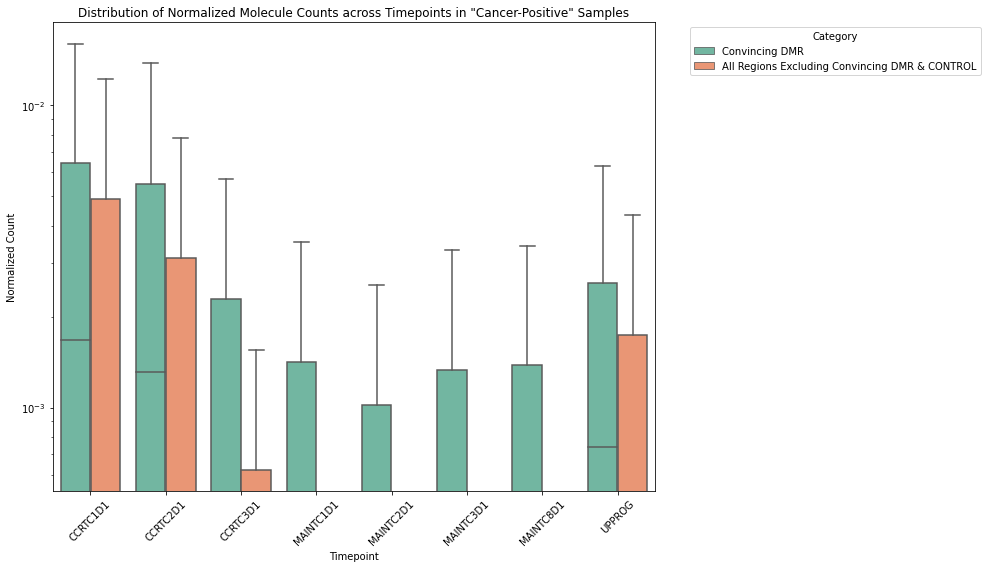

In [47]:
# Compare the Normalized Count between the 'Convincing DMR' and 'All Regions Excluding Convincing DMR' categories across different timepoints in cancer-positive samples

df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size) + "\n")

# Stratify at the sample level in df_consolidated
df_consolidated['Stratification'] = np.where(
    (df_consolidated['MB_Lung_v4_call'] == 'Detected') | (df_consolidated['epiTF_TFv2alpha'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# Merge this stratification information back into df_pivot at the sample level
df_pivot = pd.merge(
    df_pivot,
    df_consolidated[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)

# Filter for cancer-negative samples
df_pivot = df_pivot[df_pivot["Stratification"] == "Cancer"] 

# Select the convicing DMRs based on different filter methods
# convincing_regions = list(df_treatment_specific_DMRs_1.region_annotation.unique())
convincing_regions = df_treatment_specific_DMRs_2.region_annotation.unique()
# convincing_regions = convincing_regions_quantile_cutoff
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is " + str(df_treatment_specific_DMRs_2.region_annotation.unique().size)) 


# Filter df_pivot for convincing regions
df_convincing = df_pivot[df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_convincing['Category'] = 'Convincing DMR'

# Exclude convincing regions from 'All Regions'
df_all_excluding_convincing = df_pivot[~df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_all_excluding_convincing['Category'] = 'All Regions Excluding Convincing DMR & CONTROL'

# Combine the datasets
df_combined = pd.concat([df_convincing, df_all_excluding_convincing])

# Melt the DataFrame to long format
df_long = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG'], 
                           var_name='Timepoint', value_name='Normalized Count')

# Plotting
plt.figure(figsize=(14, 8))
sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
# sns.lineplot(data=df_long, x='Timepoint', y='Normalized Count', hue='Category', estimator='mean', ci=95, marker='o')
# sns.stripplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", dodge=True, jitter=True, alpha=0.5, linewidth=1)
# sns.violinplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", split=True, inner="quart")

plt.title('Distribution of Normalized Molecule Counts across Timepoints in "Cancer-Positive" Samples')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.yscale('log')

plt.show()

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100
Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is 141


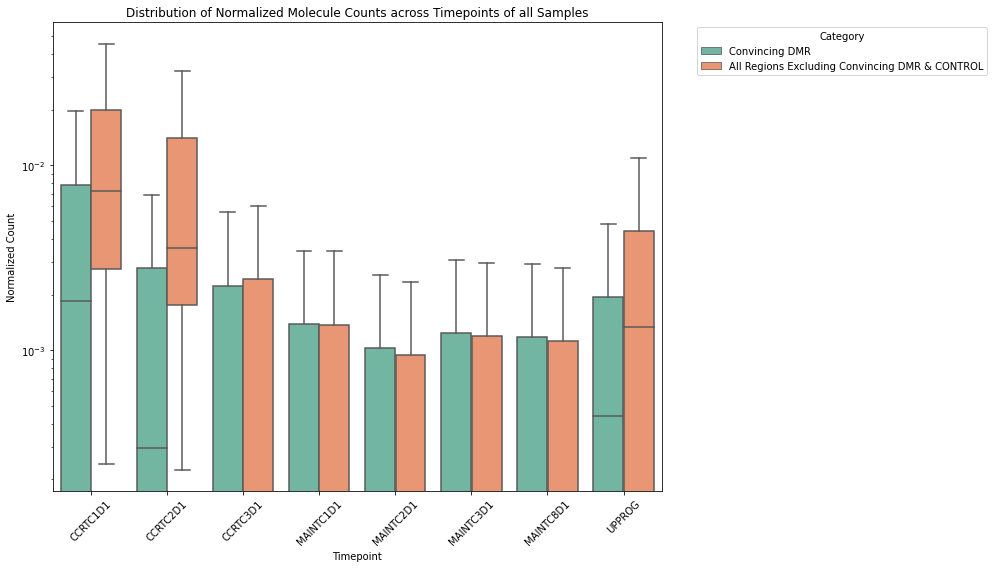

In [48]:
# Compare the Normalized Count between the 'Convincing DMR' and 'All Regions Excluding Convincing DMR' categories across different timepoints

df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size)) 

# Select the convicing DMRs based on different filter methods
# convincing_regions = list(df_treatment_specific_DMRs_1.region_annotation.unique())
convincing_regions = df_treatment_specific_DMRs_2.region_annotation.unique()
# convincing_regions = convincing_regions_quantile_cutoff
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before the third filtering is " + str(df_treatment_specific_DMRs_2.region_annotation.unique().size)) 


# Filter df_pivot for convincing regions
df_convincing = df_pivot[df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_convincing['Category'] = 'Convincing DMR'

# Exclude convincing regions from 'All Regions'
df_all_excluding_convincing = df_pivot[~df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_all_excluding_convincing['Category'] = 'All Regions Excluding Convincing DMR & CONTROL'


# Additional patient-level filtering for 'All Regions Excluding Convincing DMR & CONTROL'
df_filtered_all = pd.DataFrame()

for patient_id in df_all_excluding_convincing['Patient_ID'].unique():
    patient_data = df_all_excluding_convincing[df_all_excluding_convincing['Patient_ID'] == patient_id]
    for visit in baseline_visits:
        if not patient_data[visit].isna().all():
            baseline_visit = visit
            break
    dmr_to_exclude = patient_data[patient_data[baseline_visit] == 0]['region_annotation'].unique()
    patient_data_filtered = patient_data[~patient_data['region_annotation'].isin(dmr_to_exclude)]
    df_filtered_all = pd.concat([df_filtered_all, patient_data_filtered], ignore_index=True)

# Combine the datasets after additional filtering
df_combined = pd.concat([df_convincing, df_filtered_all], ignore_index=True)

# Melt the DataFrame to long format for plotting
df_long = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG'], 
                           var_name='Timepoint', value_name='Normalized Count')

# Plotting
plt.figure(figsize=(14, 8))
sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
plt.title('Distribution of Normalized Molecule Counts across Timepoints of all Samples')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.yscale('log')

plt.show()


Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100



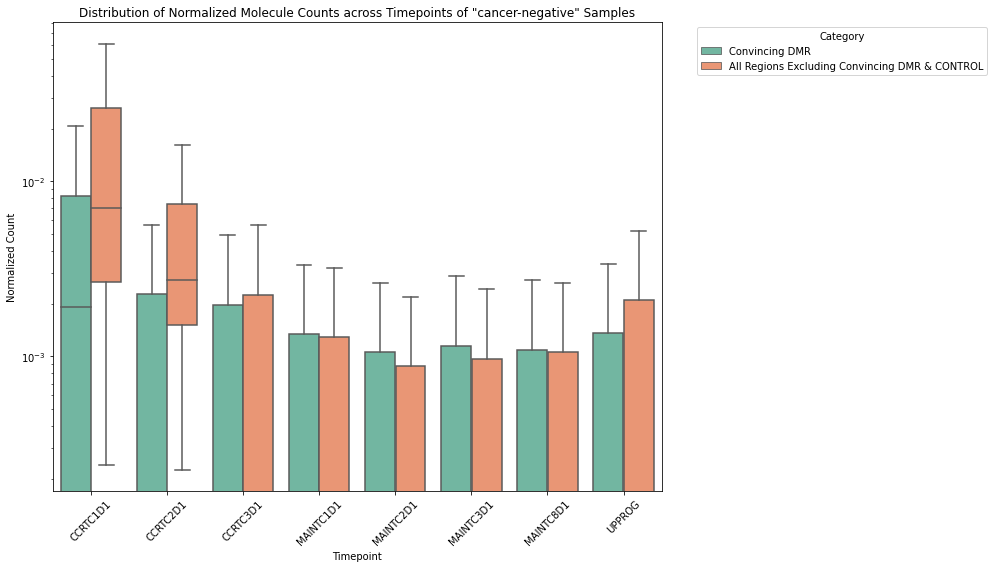

In [69]:
# Compare the Normalized Count between the 'Convincing DMR' and 'All Regions Excluding Convincing DMR' categories across different timepoints in cancer-negative samples

df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size) + "\n")

# Stratify at the sample level in df_consolidated
df_consolidated['Stratification'] = np.where(
    (df_consolidated['MB_Lung_v4_call'] == 'Detected') | (df_consolidated['epiTF_TFv2alpha'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# Merge this stratification information back into df_pivot at the sample level
df_pivot = pd.merge(
    df_pivot,
    df_consolidated[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)


# Filter df_pivot for convincing regions
df_convincing = df_pivot[df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_convincing['Category'] = 'Convincing DMR'

# Exclude convincing regions from 'All Regions'
df_all_excluding_convincing = df_pivot[~df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_all_excluding_convincing['Category'] = 'All Regions Excluding Convincing DMR & CONTROL'

# Additional patient-level filtering for 'All Regions Excluding Convincing DMR & CONTROL'
df_filtered_all = pd.DataFrame()

for patient_id in df_all_excluding_convincing['Patient_ID'].unique():
    patient_data = df_all_excluding_convincing[df_all_excluding_convincing['Patient_ID'] == patient_id]
    for visit in baseline_visits:
        if not patient_data[visit].isna().all():
            baseline_visit = visit
            break
    dmr_to_exclude = patient_data[patient_data[baseline_visit] == 0]['region_annotation'].unique()
    patient_data_filtered = patient_data[~patient_data['region_annotation'].isin(dmr_to_exclude)]
    df_filtered_all = pd.concat([df_filtered_all, patient_data_filtered], ignore_index=True)

# Combine the datasets after additional filtering
df_combined = pd.concat([df_convincing, df_filtered_all], ignore_index=True)

# Filter for cancer-negative samples
df_combined = df_combined[df_combined["Stratification"] == "No Cancer"]

# Melt the DataFrame to long format for plotting
df_long = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG'], 
                           var_name='Timepoint', value_name='Normalized Count')



# Melt the DataFrame to long format for plotting
df_long_baseline = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1'], 
                           var_name='Timepoint', value_name='Normalized Count')



# Plotting
plt.figure(figsize=(14, 8))
# sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
plt.title('Distribution of Normalized Molecule Counts across Timepoints of "cancer-negative" Samples')
# plt.title('Distribution of Normalized Molecule Counts of "cancer-negative" Baseline Samples')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.yscale('log')

plt.show()

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100



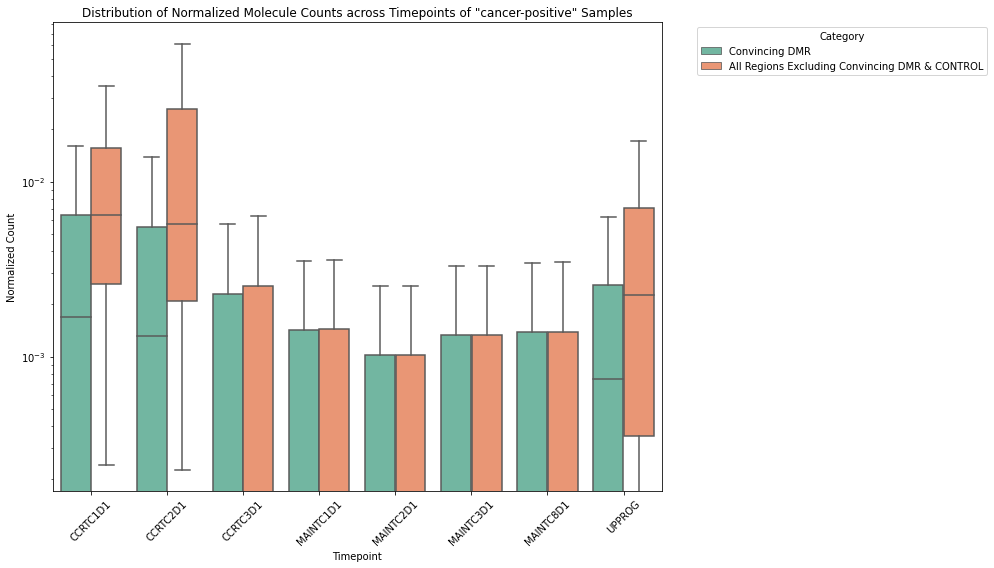

In [68]:
# Compare the Normalized Count between the 'Convincing DMR' and 'All Regions Excluding Convincing DMR' categories across different timepoints in cancer-positive samples

df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size) + "\n")

# Stratify at the sample level in df_consolidated
df_consolidated['Stratification'] = np.where(
    (df_consolidated['MB_Lung_v4_call'] == 'Detected') | (df_consolidated['epiTF_TFv2alpha'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# Merge this stratification information back into df_pivot at the sample level
df_pivot = pd.merge(
    df_pivot,
    df_consolidated[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)

# Filter df_pivot for convincing regions
df_convincing = df_pivot[df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_convincing['Category'] = 'Convincing DMR'

# Exclude convincing regions from 'All Regions'
df_all_excluding_convincing = df_pivot[~df_pivot['region_annotation'].isin(convincing_regions)].copy()
df_all_excluding_convincing['Category'] = 'All Regions Excluding Convincing DMR & CONTROL'

# Additional patient-level filtering for 'All Regions Excluding Convincing DMR & CONTROL'
df_filtered_all = pd.DataFrame()

for patient_id in df_all_excluding_convincing['Patient_ID'].unique():
    patient_data = df_all_excluding_convincing[df_all_excluding_convincing['Patient_ID'] == patient_id]
    for visit in baseline_visits:
        if not patient_data[visit].isna().all():
            baseline_visit = visit
            break
    dmr_to_exclude = patient_data[patient_data[baseline_visit] == 0]['region_annotation'].unique()
    patient_data_filtered = patient_data[~patient_data['region_annotation'].isin(dmr_to_exclude)]
    df_filtered_all = pd.concat([df_filtered_all, patient_data_filtered], ignore_index=True)

# Combine the datasets after additional filtering
df_combined = pd.concat([df_convincing, df_filtered_all], ignore_index=True)

# Filter for cancer-positive samples
df_combined = df_combined[df_combined["Stratification"] == "Cancer"]

# Melt the DataFrame to long format for plotting
df_long = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1', 'UPPROG'], 
                           var_name='Timepoint', value_name='Normalized Count')



# Melt the DataFrame to long format for plotting
df_long_baseline = df_combined.melt(id_vars=['Patient_ID', 'region_annotation', 'Category'], 
                           value_vars=['CCRTC1D1', 'CCRTC2D1'], 
                           var_name='Timepoint', value_name='Normalized Count')



# Plotting
plt.figure(figsize=(14, 8))
# sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
plt.title('Distribution of Normalized Molecule Counts across Timepoints of "cancer-positive" Samples')
# plt.title('Distribution of Normalized Molecule Counts of "cancer-positive" Baseline Samples')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.yscale('log')

plt.show()

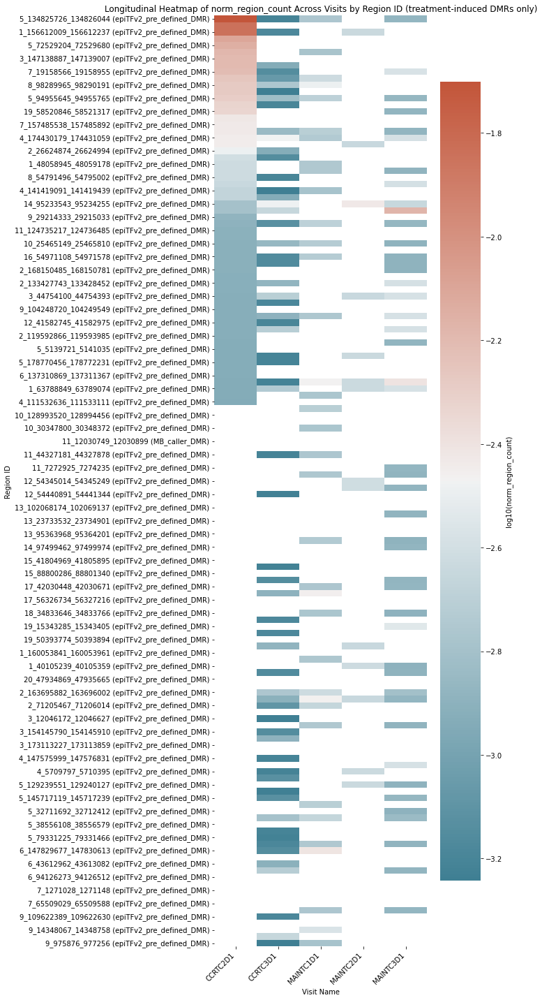

In [64]:
# heatmap plot for the longitudinal DMR signal (epiTFv2 DMR only)
# Select specific patient for longitudinal DMR signal plot (epiTFv2 DMRs only)
df_BMS_MRD_all_7 = df_BMS_MRD_all_6.copy()

# Choose patient "0171-01551" as an example
df_patient_1339 = df_BMS_MRD_all_7[df_BMS_MRD_all_7['Patient_ID'] == '0198-01406']
df_patient_1339.head()


# Assuming df_patient_1339 is defined and contains 'run_sample_id' and 'Visit_name'
epiTFv2_out_path = f"{work_dir}/TFv2beta_BMS_SOW33_04082024_ouput"

# Map sample_id to Visit_name
visit_name_mapping = df_patient_1339.set_index('run_sample_id')['Visit_name'].to_dict()

# Initialize an empty DataFrame for consolidated data
df_consolidated = pd.DataFrame()

# Desired order of Visit_names, ensuring it matches the Visit_name column after mapping
desired_order_visit_names = ['CCRTC2D1', 'CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1']


# Iterate over each sample_id to load its corresponding file
for sample_id, visit_name in visit_name_mapping.items():
    file_path = f"{epiTFv2_out_path}/{sample_id}.msre_region_stats_annotated.csv"
    try:
        # Load the data file
        df_temp = pd.read_csv(file_path)

        # Only filter for non-LR_caller_DMR annotations
        df_temp = df_temp[df_temp["annotation"] != "LR_caller_DMR"]

        # Add 'sample_id' and 'Visit_name' to the DataFrame
        df_temp['sample_id'] = sample_id
        df_temp['Visit_name'] = visit_name
        # Append to the consolidated DataFrame
        df_consolidated = pd.concat([df_consolidated, df_temp], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {sample_id}: {file_path}")
        continue


# Create a new index by combining 'region_id' and 'annotation'
df_consolidated['region_annotation'] = df_consolidated['region_id'] + " (" + df_consolidated['annotation'] + ")"

# Pivot the DataFrame to have 'region_annotation' as rows, 'Visit_name' as columns, and 'norm_region_count' as values
df_pivot = df_consolidated.pivot(index='region_annotation', columns='Visit_name', values='norm_region_count')


df_pivot_filtered = df_pivot.loc[df_pivot.index.isin(df_treatment_specific_DMRs_2.region_annotation.unique())]


# # Pivot the DataFrame to have 'region_id' as rows, 'Visit_name' as columns, and 'norm_region_count' as values
# df_pivot = df_consolidated.pivot(index='region_id', columns='Visit_name', values='norm_region_count')

# Ensure columns are in the desired order, filling missing with 0
df_pivot_filtered = df_pivot_filtered.reindex(columns=desired_order_visit_names, fill_value=0)

# Replace 0 with NaN and apply log scale
df_pivot_filtered.replace(0, np.nan, inplace=True)
df_log_scale = np.log10(df_pivot_filtered)

# Sort the rows (regions) based on the 'CCRTC1D1'
df_log_scale_sorted = df_log_scale.sort_values(by=desired_order_visit_names[0], ascending=False)

# Plotting the heatmap
plt.figure(figsize=(10, 20))  # Adjust the figure size as needed
cmap = sns.diverging_palette(220, 20, as_cmap=True)

ax = sns.heatmap(df_log_scale_sorted, cmap=cmap, cbar_kws={'label': 'log10(norm_region_count)'})

# Make sure to use desired_order_visit_names since it matches the columns in df_pivot
ax.set_xticklabels(desired_order_visit_names, rotation=45, ha="right")

plt.title('Longitudinal Heatmap of norm_region_count Across Visits by Region ID (treatment-induced DMRs only)')
plt.xlabel('Visit Name')
plt.ylabel('Region ID')
plt.tight_layout()
plt.show()




In [102]:
df_pivot = df_pivot.loc[df_pivot.index.isin(convincing_regions_signficant_no_cancer)]

df_pivot.head()

,Patient_ID,region_annotation,CCRTC1D1,CCRTC2D1,CCRTC3D1,MAINTC1D1,MAINTC2D1,MAINTC3D1,MAINTC8D1,UPPROG


In [105]:
df_pivot.shape

(0, 10)

In [69]:
df_pivot_filtered.head()

Visit_name,CCRTC2D1,CCRTC3D1,MAINTC1D1,MAINTC2D1,MAINTC3D1
region_annotation,,,,,
10_101089032_101089152 (epiTFv2_pre_defined_DMR),NaN,NaN,NaN,NaN,NaN
10_119296297_119297572 (epiTFv2_pre_defined_DMR),NaN,NaN,0.001940,NaN,NaN
10_25465149_25465810 (epiTFv2_pre_defined_DMR),0.001216,0.001375,0.001867,NaN,0.001297
10_26223100_26224084 (epiTFv2_pre_defined_DMR),0.001177,NaN,0.001735,NaN,NaN
10_30347800_30348372 (epiTFv2_pre_defined_DMR),NaN,NaN,0.001694,NaN,NaN


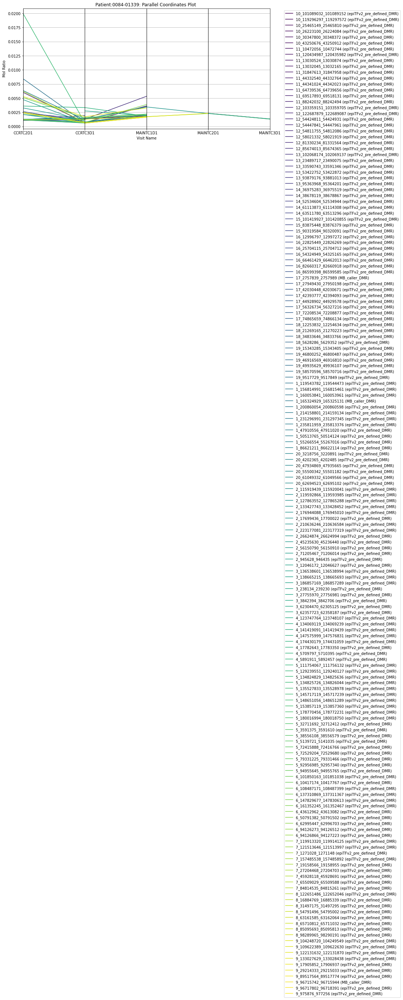

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates
import seaborn as sns

df_pivot_filtered = df_pivot_filtered.reset_index()

# Create the parallel coordinates plot
plt.figure(figsize=(12, 6))
parallel_coordinates(df_pivot_filtered, 'region_annotation', colormap='viridis')

# Setting title, labels, and legend as you specified
plt.title('Patient:0084-01339: Parallel Coordinates Plot ')
plt.xlabel('Visit Name')
plt.ylabel('Mol Ratio')
plt.xticks(ticks=range(len(df_pivot_filtered.columns[1:])), labels=df_pivot_filtered.columns[1:])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
plt.grid(True)

plt.show()

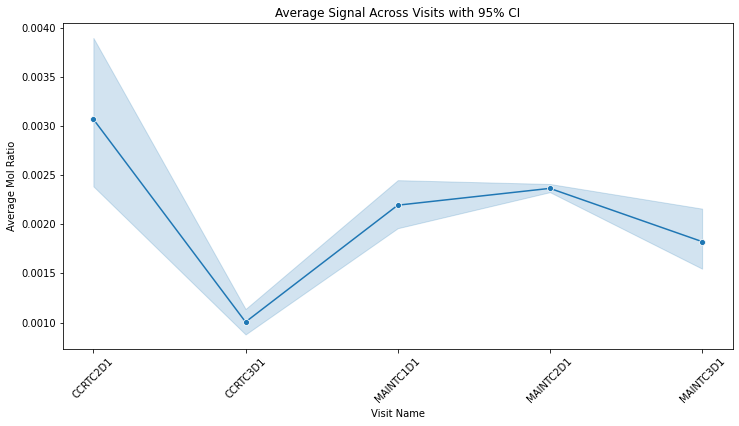

In [81]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample DataFrame preparation step - ensure this matches your actual data structure
# If 'region_annotation' is your index, reset it so we can work with the dataframe columns directly

# Convert long format to wide format if necessary, or ensure it's already in the appropriate format
# This step is assumed to be done based on your initial description

# Average the signal for each 'Visit_name' across different 'region_annotation'
# This involves melting the dataframe if it's not already in a long format
df_long_format = df_pivot_filtered.melt(id_vars=['region_annotation'], var_name='Visit_name', value_name='Signal')

# Calculate mean signal for each visit
mean_signals = df_long_format.groupby('Visit_name')['Signal'].mean().reset_index()

# Plotting with Seaborn including the 95% Confidence Interval
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_long_format, x='Visit_name', y='Signal', estimator='mean', ci=95, marker='o')

plt.title('Average Signal Across Visits with 95% CI')
plt.xlabel('Visit Name')
plt.ylabel('Average Mol Ratio')
plt.xticks(rotation=45)

plt.show()


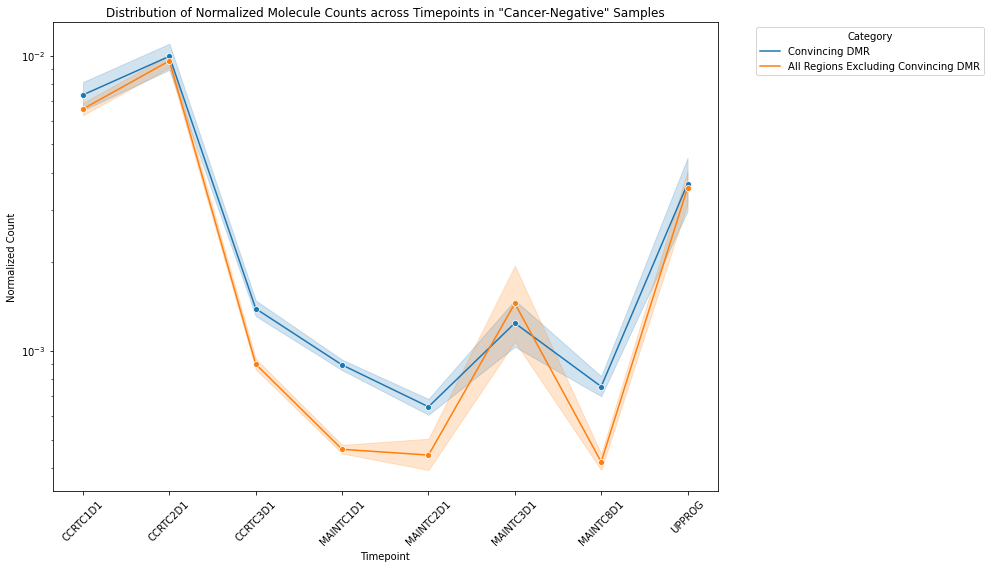

In [90]:
# Plotting
plt.figure(figsize=(14, 8))
# sns.boxplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", showfliers=False)
sns.lineplot(data=df_long, x='Timepoint', y='Normalized Count', hue='Category', estimator='mean', ci=95, marker='o')

# sns.stripplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", dodge=True, jitter=True, alpha=0.5, linewidth=1)
# sns.violinplot(x='Timepoint', y='Normalized Count', hue='Category', data=df_long, palette="Set2", split=True, inner="quart")

plt.title('Distribution of Normalized Molecule Counts across Timepoints in "Cancer-Negative" Samples')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.yscale('log')

plt.show()


In [82]:
# Read in the data df_consolidated and df_pivot from the first filter step
df_consolidated = pd.read_csv(f"{work_dir}/df_consolidated.csv", header=0)
df_pivot = pd.read_csv(f"{work_dir}/df_pivot_candidate_patient.csv", header=0)

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch NO FILTER is " + str(df_pivot.region_annotation.unique().size) + "\n")

# Filter rows where 'region_annotation' does NOT end with '(LR_caller_DMR)'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.endswith('(LR_caller_DMR)')]

# Filter rows where 'region_annotation' does NOT contain 'CONTROL'
df_pivot = df_pivot[~df_pivot['region_annotation'].str.contains('CONTROL')]

print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is " + str(df_pivot.region_annotation.unique().size) + "\n")

# df_treatment_specific_DMRs contains the filtered region_annotations after first filter
df_pivot = df_pivot[df_pivot['region_annotation'].isin(df_treatment_specific_DMRs['region_annotation'])]
df_consolidated = df_consolidated[df_consolidated['region_annotation'].isin(df_treatment_specific_DMRs['region_annotation'])]
print("Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch in df_treatment_specific_DMRs is " + str(df_pivot.region_annotation.unique().size) + "\n")
    
# Stratify at the sample level in df_consolidated
df_consolidated['Stratification'] = np.where(
    (df_consolidated['MB_Lung_v4_call'] == 'Detected') | (df_consolidated['epiTF_TFv2alpha'] > 0.0005),
    'Cancer',
    'No Cancer'
)

# Merge this stratification information back into df_pivot at the sample level
df_pivot = pd.merge(
    df_pivot,
    df_consolidated[['sample_id', 'Patient_ID', 'region_annotation', 'Stratification']].drop_duplicates(),
    on=['Patient_ID', 'region_annotation'],
    how='left'
)

# Define baseline and on-treatment visit categories
baseline_visits = ['CCRTC1D1', 'CCRTC2D1']
on_treatment_visits = ['CCRTC3D1', 'MAINTC1D1', 'MAINTC2D1', 'MAINTC3D1', 'MAINTC8D1']

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch NO FILTER is 24864

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch before initial filtering is 1100

Total size of eligible treatment-specific DMRs of BMS_SOW33_Infinity_01 batch in df_treatment_specific_DMRs is 957

